# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:10<00:00, 5.48KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

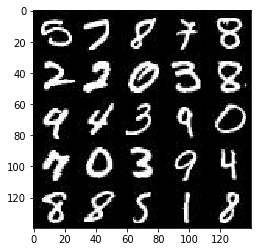

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

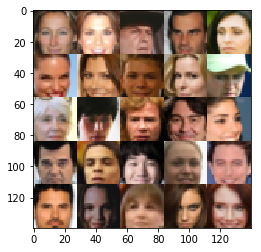

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/local/lib/python3.5/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/local/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.5/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.5/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'F

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64

        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128

        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*256)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x256

        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x128

        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 28x28x64

        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same')
        # 28x28x3
        
        out = tf.tanh(logits)

        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    samples, width, height, channels = data_shape
    
    input_real, input_z, lr = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    
    print_every = 10
    show_every = 100
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                # Rescale real image input to (-1, 1)
                batch_images *= 2.0

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 16, input_z, channels, data_image_mode)              
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.2176... Generator Loss: 0.6714
Epoch 1/2... Discriminator Loss: 1.4056... Generator Loss: 0.6099
Epoch 1/2... Discriminator Loss: 1.1522... Generator Loss: 0.7128
Epoch 1/2... Discriminator Loss: 1.4629... Generator Loss: 0.4873
Epoch 1/2... Discriminator Loss: 1.3913... Generator Loss: 0.4417
Epoch 1/2... Discriminator Loss: 1.5108... Generator Loss: 1.2677
Epoch 1/2... Discriminator Loss: 1.3556... Generator Loss: 1.3759
Epoch 1/2... Discriminator Loss: 1.1695... Generator Loss: 0.7526
Epoch 1/2... Discriminator Loss: 1.1281... Generator Loss: 1.2136
Epoch 1/2... Discriminator Loss: 1.1452... Generator Loss: 1.0603


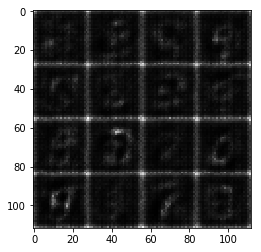

Epoch 1/2... Discriminator Loss: 1.3193... Generator Loss: 0.4210
Epoch 1/2... Discriminator Loss: 1.0953... Generator Loss: 1.3878
Epoch 1/2... Discriminator Loss: 1.0981... Generator Loss: 0.7554
Epoch 1/2... Discriminator Loss: 1.0849... Generator Loss: 0.6998
Epoch 1/2... Discriminator Loss: 1.0303... Generator Loss: 1.2040
Epoch 1/2... Discriminator Loss: 0.8796... Generator Loss: 0.9640
Epoch 1/2... Discriminator Loss: 1.0268... Generator Loss: 1.7176
Epoch 1/2... Discriminator Loss: 1.0429... Generator Loss: 0.7760
Epoch 1/2... Discriminator Loss: 0.8719... Generator Loss: 0.8191
Epoch 1/2... Discriminator Loss: 0.7983... Generator Loss: 1.2384


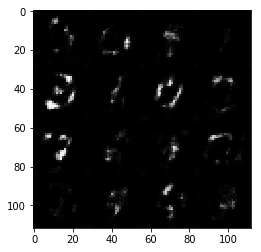

Epoch 1/2... Discriminator Loss: 0.9099... Generator Loss: 2.0286
Epoch 1/2... Discriminator Loss: 1.1657... Generator Loss: 0.4943
Epoch 1/2... Discriminator Loss: 0.7647... Generator Loss: 0.9005
Epoch 1/2... Discriminator Loss: 0.5961... Generator Loss: 1.9166
Epoch 1/2... Discriminator Loss: 0.6970... Generator Loss: 1.3824
Epoch 1/2... Discriminator Loss: 1.0863... Generator Loss: 0.5924
Epoch 1/2... Discriminator Loss: 0.7113... Generator Loss: 1.3684
Epoch 1/2... Discriminator Loss: 1.1928... Generator Loss: 0.5291
Epoch 1/2... Discriminator Loss: 0.8443... Generator Loss: 1.2244
Epoch 1/2... Discriminator Loss: 1.1992... Generator Loss: 0.4683


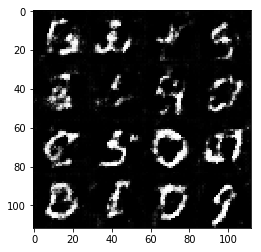

Epoch 1/2... Discriminator Loss: 0.8790... Generator Loss: 0.8059
Epoch 1/2... Discriminator Loss: 0.9064... Generator Loss: 1.2199
Epoch 1/2... Discriminator Loss: 0.8772... Generator Loss: 1.0416
Epoch 1/2... Discriminator Loss: 0.9945... Generator Loss: 1.4347
Epoch 1/2... Discriminator Loss: 1.9373... Generator Loss: 0.2078
Epoch 1/2... Discriminator Loss: 1.0868... Generator Loss: 2.0768
Epoch 1/2... Discriminator Loss: 0.8404... Generator Loss: 0.9904
Epoch 1/2... Discriminator Loss: 1.0567... Generator Loss: 0.6300
Epoch 1/2... Discriminator Loss: 1.1936... Generator Loss: 0.5093
Epoch 1/2... Discriminator Loss: 0.7913... Generator Loss: 1.0180


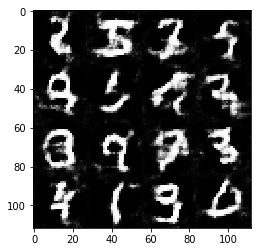

Epoch 1/2... Discriminator Loss: 0.9611... Generator Loss: 1.8127
Epoch 1/2... Discriminator Loss: 0.8246... Generator Loss: 1.0372
Epoch 1/2... Discriminator Loss: 0.9409... Generator Loss: 1.7958
Epoch 1/2... Discriminator Loss: 0.9125... Generator Loss: 1.2729
Epoch 1/2... Discriminator Loss: 0.8417... Generator Loss: 1.2720
Epoch 1/2... Discriminator Loss: 0.8910... Generator Loss: 1.9576
Epoch 1/2... Discriminator Loss: 0.8352... Generator Loss: 1.0958
Epoch 1/2... Discriminator Loss: 0.8095... Generator Loss: 1.2171
Epoch 1/2... Discriminator Loss: 0.9448... Generator Loss: 0.8012
Epoch 1/2... Discriminator Loss: 0.8602... Generator Loss: 1.0705


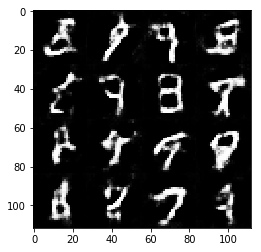

Epoch 1/2... Discriminator Loss: 0.9442... Generator Loss: 0.6814
Epoch 1/2... Discriminator Loss: 0.8500... Generator Loss: 1.3548
Epoch 1/2... Discriminator Loss: 1.0194... Generator Loss: 0.6122
Epoch 1/2... Discriminator Loss: 0.8969... Generator Loss: 0.9086
Epoch 1/2... Discriminator Loss: 0.8716... Generator Loss: 1.3072
Epoch 1/2... Discriminator Loss: 0.7623... Generator Loss: 1.1187
Epoch 1/2... Discriminator Loss: 0.8060... Generator Loss: 1.2049
Epoch 1/2... Discriminator Loss: 0.7439... Generator Loss: 1.0947
Epoch 1/2... Discriminator Loss: 0.8213... Generator Loss: 1.0003
Epoch 1/2... Discriminator Loss: 0.9005... Generator Loss: 0.9081


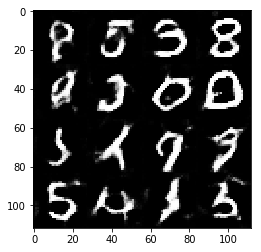

Epoch 1/2... Discriminator Loss: 0.8990... Generator Loss: 0.9546
Epoch 1/2... Discriminator Loss: 0.8827... Generator Loss: 0.9819
Epoch 1/2... Discriminator Loss: 0.8311... Generator Loss: 0.9631
Epoch 1/2... Discriminator Loss: 0.8726... Generator Loss: 0.8309
Epoch 1/2... Discriminator Loss: 0.8846... Generator Loss: 1.1023
Epoch 1/2... Discriminator Loss: 0.8576... Generator Loss: 1.0839
Epoch 1/2... Discriminator Loss: 0.9902... Generator Loss: 0.7729
Epoch 1/2... Discriminator Loss: 0.9219... Generator Loss: 0.7203
Epoch 1/2... Discriminator Loss: 0.9927... Generator Loss: 0.6720
Epoch 1/2... Discriminator Loss: 1.0469... Generator Loss: 0.5864


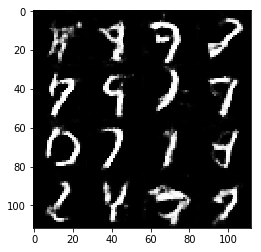

Epoch 1/2... Discriminator Loss: 0.7289... Generator Loss: 1.2505
Epoch 1/2... Discriminator Loss: 0.7696... Generator Loss: 1.2455
Epoch 1/2... Discriminator Loss: 1.1806... Generator Loss: 0.5275
Epoch 1/2... Discriminator Loss: 0.7763... Generator Loss: 1.1533
Epoch 1/2... Discriminator Loss: 0.9519... Generator Loss: 0.7028
Epoch 1/2... Discriminator Loss: 1.1845... Generator Loss: 2.7735
Epoch 1/2... Discriminator Loss: 0.7178... Generator Loss: 1.1012
Epoch 1/2... Discriminator Loss: 1.3431... Generator Loss: 0.4457
Epoch 1/2... Discriminator Loss: 0.6945... Generator Loss: 1.4414
Epoch 1/2... Discriminator Loss: 0.6658... Generator Loss: 1.4124


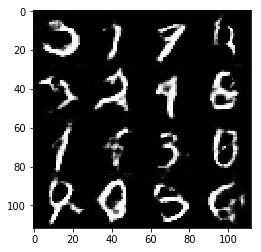

Epoch 1/2... Discriminator Loss: 0.6334... Generator Loss: 1.2237
Epoch 1/2... Discriminator Loss: 3.8498... Generator Loss: 0.0360
Epoch 1/2... Discriminator Loss: 0.8755... Generator Loss: 0.9918
Epoch 1/2... Discriminator Loss: 0.7487... Generator Loss: 0.9420
Epoch 1/2... Discriminator Loss: 0.8473... Generator Loss: 0.8103
Epoch 1/2... Discriminator Loss: 0.7893... Generator Loss: 0.8952
Epoch 1/2... Discriminator Loss: 0.8443... Generator Loss: 0.8385
Epoch 1/2... Discriminator Loss: 0.6704... Generator Loss: 1.1519
Epoch 1/2... Discriminator Loss: 0.8176... Generator Loss: 0.8779
Epoch 1/2... Discriminator Loss: 0.6784... Generator Loss: 1.3919


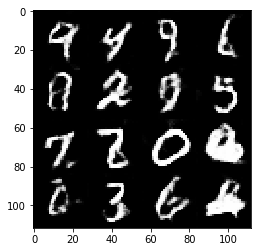

Epoch 1/2... Discriminator Loss: 0.7754... Generator Loss: 1.1649
Epoch 1/2... Discriminator Loss: 0.7412... Generator Loss: 1.7813
Epoch 1/2... Discriminator Loss: 0.6871... Generator Loss: 0.9476
Epoch 2/2... Discriminator Loss: 0.6700... Generator Loss: 1.0889
Epoch 2/2... Discriminator Loss: 3.1857... Generator Loss: 0.0654
Epoch 2/2... Discriminator Loss: 1.1680... Generator Loss: 0.5184
Epoch 2/2... Discriminator Loss: 0.7162... Generator Loss: 1.1342
Epoch 2/2... Discriminator Loss: 1.2145... Generator Loss: 0.5243
Epoch 2/2... Discriminator Loss: 0.8128... Generator Loss: 0.8952
Epoch 2/2... Discriminator Loss: 1.0024... Generator Loss: 0.6517


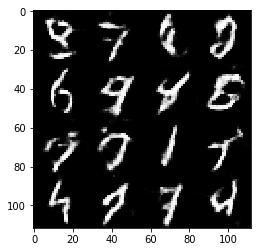

Epoch 2/2... Discriminator Loss: 0.7328... Generator Loss: 1.0361
Epoch 2/2... Discriminator Loss: 0.6898... Generator Loss: 1.0477
Epoch 2/2... Discriminator Loss: 1.3839... Generator Loss: 0.3779
Epoch 2/2... Discriminator Loss: 2.1023... Generator Loss: 3.2274
Epoch 2/2... Discriminator Loss: 0.8130... Generator Loss: 1.6100
Epoch 2/2... Discriminator Loss: 0.6709... Generator Loss: 1.2103
Epoch 2/2... Discriminator Loss: 0.7779... Generator Loss: 1.0929
Epoch 2/2... Discriminator Loss: 0.8334... Generator Loss: 0.8453
Epoch 2/2... Discriminator Loss: 0.8162... Generator Loss: 0.8688
Epoch 2/2... Discriminator Loss: 0.7823... Generator Loss: 1.1523


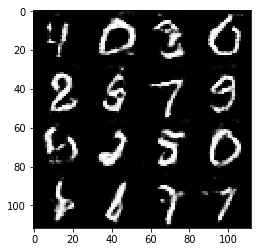

Epoch 2/2... Discriminator Loss: 0.7056... Generator Loss: 1.4268
Epoch 2/2... Discriminator Loss: 0.6785... Generator Loss: 1.0740
Epoch 2/2... Discriminator Loss: 1.0476... Generator Loss: 0.6281
Epoch 2/2... Discriminator Loss: 2.5644... Generator Loss: 0.1196
Epoch 2/2... Discriminator Loss: 0.7145... Generator Loss: 1.2118
Epoch 2/2... Discriminator Loss: 0.6738... Generator Loss: 1.6278
Epoch 2/2... Discriminator Loss: 1.0952... Generator Loss: 1.3839
Epoch 2/2... Discriminator Loss: 0.8498... Generator Loss: 0.8536
Epoch 2/2... Discriminator Loss: 0.7421... Generator Loss: 1.0237
Epoch 2/2... Discriminator Loss: 1.0747... Generator Loss: 0.5958


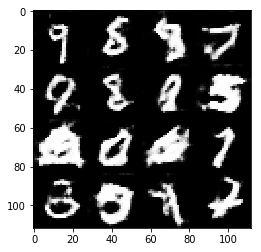

Epoch 2/2... Discriminator Loss: 0.9888... Generator Loss: 0.6996
Epoch 2/2... Discriminator Loss: 0.6076... Generator Loss: 1.1695
Epoch 2/2... Discriminator Loss: 0.7052... Generator Loss: 1.1141
Epoch 2/2... Discriminator Loss: 0.6118... Generator Loss: 1.1458
Epoch 2/2... Discriminator Loss: 0.6947... Generator Loss: 2.1493
Epoch 2/2... Discriminator Loss: 0.9289... Generator Loss: 0.7311
Epoch 2/2... Discriminator Loss: 0.6045... Generator Loss: 1.1892
Epoch 2/2... Discriminator Loss: 0.7964... Generator Loss: 0.8744
Epoch 2/2... Discriminator Loss: 0.5798... Generator Loss: 1.1905
Epoch 2/2... Discriminator Loss: 0.9666... Generator Loss: 0.6643


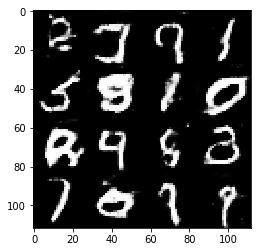

Epoch 2/2... Discriminator Loss: 1.0866... Generator Loss: 0.5447
Epoch 2/2... Discriminator Loss: 0.8373... Generator Loss: 0.8427
Epoch 2/2... Discriminator Loss: 1.0179... Generator Loss: 0.6925
Epoch 2/2... Discriminator Loss: 1.0049... Generator Loss: 0.5999
Epoch 2/2... Discriminator Loss: 0.9625... Generator Loss: 0.9643
Epoch 2/2... Discriminator Loss: 0.6973... Generator Loss: 1.9325
Epoch 2/2... Discriminator Loss: 0.9491... Generator Loss: 0.7313
Epoch 2/2... Discriminator Loss: 0.7352... Generator Loss: 0.9813
Epoch 2/2... Discriminator Loss: 0.5073... Generator Loss: 1.5948
Epoch 2/2... Discriminator Loss: 0.5864... Generator Loss: 1.2832


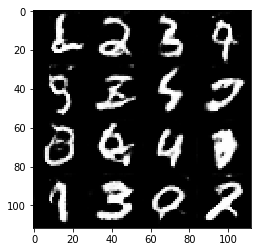

Epoch 2/2... Discriminator Loss: 0.8236... Generator Loss: 0.7933
Epoch 2/2... Discriminator Loss: 0.9265... Generator Loss: 0.6765
Epoch 2/2... Discriminator Loss: 0.9248... Generator Loss: 0.7079
Epoch 2/2... Discriminator Loss: 0.8867... Generator Loss: 0.6912
Epoch 2/2... Discriminator Loss: 0.8672... Generator Loss: 1.0977
Epoch 2/2... Discriminator Loss: 0.5652... Generator Loss: 1.2455
Epoch 2/2... Discriminator Loss: 0.7154... Generator Loss: 2.0887
Epoch 2/2... Discriminator Loss: 0.8179... Generator Loss: 0.8525
Epoch 2/2... Discriminator Loss: 0.7628... Generator Loss: 1.2498
Epoch 2/2... Discriminator Loss: 0.8106... Generator Loss: 0.8723


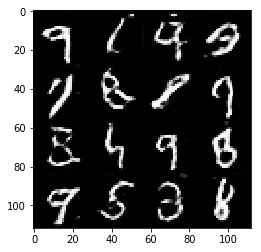

Epoch 2/2... Discriminator Loss: 0.8678... Generator Loss: 1.3522
Epoch 2/2... Discriminator Loss: 0.6074... Generator Loss: 1.1519
Epoch 2/2... Discriminator Loss: 0.6427... Generator Loss: 1.0597
Epoch 2/2... Discriminator Loss: 0.6090... Generator Loss: 1.1176
Epoch 2/2... Discriminator Loss: 0.7347... Generator Loss: 0.8690
Epoch 2/2... Discriminator Loss: 0.5569... Generator Loss: 1.9676
Epoch 2/2... Discriminator Loss: 0.5872... Generator Loss: 1.4292
Epoch 2/2... Discriminator Loss: 0.7249... Generator Loss: 1.3254
Epoch 2/2... Discriminator Loss: 0.9241... Generator Loss: 0.7208
Epoch 2/2... Discriminator Loss: 0.9281... Generator Loss: 0.7215


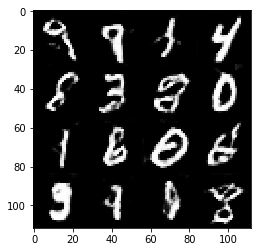

Epoch 2/2... Discriminator Loss: 0.4040... Generator Loss: 1.8920
Epoch 2/2... Discriminator Loss: 0.8454... Generator Loss: 1.6141
Epoch 2/2... Discriminator Loss: 0.7923... Generator Loss: 1.8949
Epoch 2/2... Discriminator Loss: 0.6081... Generator Loss: 1.5756
Epoch 2/2... Discriminator Loss: 0.8554... Generator Loss: 0.7560
Epoch 2/2... Discriminator Loss: 0.6238... Generator Loss: 1.2384
Epoch 2/2... Discriminator Loss: 0.5214... Generator Loss: 1.3384
Epoch 2/2... Discriminator Loss: 0.5688... Generator Loss: 1.3351
Epoch 2/2... Discriminator Loss: 0.7348... Generator Loss: 0.9878
Epoch 2/2... Discriminator Loss: 0.7174... Generator Loss: 2.0138


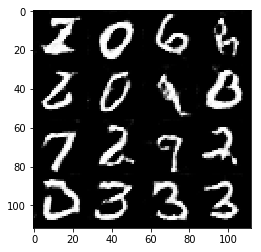

Epoch 2/2... Discriminator Loss: 0.5680... Generator Loss: 1.3414
Epoch 2/2... Discriminator Loss: 0.7045... Generator Loss: 1.0645
Epoch 2/2... Discriminator Loss: 0.7386... Generator Loss: 0.9542
Epoch 2/2... Discriminator Loss: 0.6977... Generator Loss: 0.9605
Epoch 2/2... Discriminator Loss: 0.5385... Generator Loss: 1.2932
Epoch 2/2... Discriminator Loss: 0.4942... Generator Loss: 1.4023
Epoch 2/2... Discriminator Loss: 0.8707... Generator Loss: 0.8345
Epoch 2/2... Discriminator Loss: 0.5280... Generator Loss: 1.3839
Epoch 2/2... Discriminator Loss: 1.1044... Generator Loss: 0.7116
Epoch 2/2... Discriminator Loss: 0.6170... Generator Loss: 1.2546


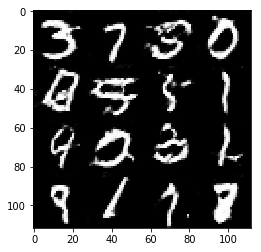

Epoch 2/2... Discriminator Loss: 0.6200... Generator Loss: 1.1818
Epoch 2/2... Discriminator Loss: 1.0962... Generator Loss: 0.5872
Epoch 2/2... Discriminator Loss: 0.6952... Generator Loss: 1.0073
Epoch 2/2... Discriminator Loss: 1.2816... Generator Loss: 0.5190
Epoch 2/2... Discriminator Loss: 0.6340... Generator Loss: 1.1850
Epoch 2/2... Discriminator Loss: 0.7717... Generator Loss: 0.9073
Epoch 2/2... Discriminator Loss: 0.5549... Generator Loss: 1.4430


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discriminator Loss: 0.5302... Generator Loss: 1.5010
Epoch 1/10... Discriminator Loss: 0.4983... Generator Loss: 1.6134
Epoch 1/10... Discriminator Loss: 0.2242... Generator Loss: 2.3742
Epoch 1/10... Discriminator Loss: 0.4881... Generator Loss: 1.7490
Epoch 1/10... Discriminator Loss: 0.6592... Generator Loss: 1.8298
Epoch 1/10... Discriminator Loss: 0.5861... Generator Loss: 1.5241
Epoch 1/10... Discriminator Loss: 0.6363... Generator Loss: 1.6177
Epoch 1/10... Discriminator Loss: 0.4685... Generator Loss: 4.3218
Epoch 1/10... Discriminator Loss: 1.2985... Generator Loss: 0.6132
Epoch 1/10... Discriminator Loss: 1.9388... Generator Loss: 0.2369


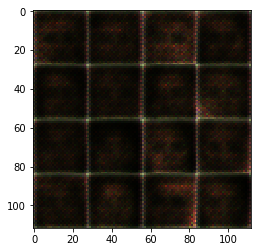

Epoch 1/10... Discriminator Loss: 0.3433... Generator Loss: 2.6980
Epoch 1/10... Discriminator Loss: 0.8950... Generator Loss: 3.3830
Epoch 1/10... Discriminator Loss: 0.4777... Generator Loss: 1.5950
Epoch 1/10... Discriminator Loss: 0.6944... Generator Loss: 1.1632
Epoch 1/10... Discriminator Loss: 0.5922... Generator Loss: 1.1900
Epoch 1/10... Discriminator Loss: 0.3794... Generator Loss: 1.8844
Epoch 1/10... Discriminator Loss: 0.9123... Generator Loss: 0.8794
Epoch 1/10... Discriminator Loss: 0.7540... Generator Loss: 1.0032
Epoch 1/10... Discriminator Loss: 0.4076... Generator Loss: 1.8439
Epoch 1/10... Discriminator Loss: 0.2396... Generator Loss: 2.5803


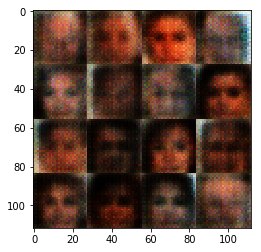

Epoch 1/10... Discriminator Loss: 0.3578... Generator Loss: 1.8154
Epoch 1/10... Discriminator Loss: 2.4576... Generator Loss: 0.1416
Epoch 1/10... Discriminator Loss: 0.6188... Generator Loss: 2.2962
Epoch 1/10... Discriminator Loss: 0.8450... Generator Loss: 1.2127
Epoch 1/10... Discriminator Loss: 0.6672... Generator Loss: 1.2263
Epoch 1/10... Discriminator Loss: 0.2607... Generator Loss: 3.0544
Epoch 1/10... Discriminator Loss: 0.4500... Generator Loss: 1.4717
Epoch 1/10... Discriminator Loss: 0.4037... Generator Loss: 1.5327
Epoch 1/10... Discriminator Loss: 0.9075... Generator Loss: 0.8162
Epoch 1/10... Discriminator Loss: 1.8658... Generator Loss: 3.7193


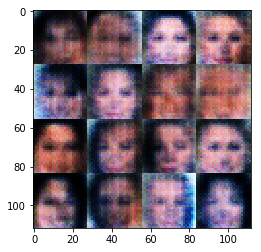

Epoch 1/10... Discriminator Loss: 1.5295... Generator Loss: 0.3605
Epoch 1/10... Discriminator Loss: 0.6967... Generator Loss: 1.1003
Epoch 1/10... Discriminator Loss: 0.5743... Generator Loss: 1.5126
Epoch 1/10... Discriminator Loss: 0.4403... Generator Loss: 1.9059
Epoch 1/10... Discriminator Loss: 1.2380... Generator Loss: 0.6058
Epoch 1/10... Discriminator Loss: 2.7318... Generator Loss: 0.1094
Epoch 1/10... Discriminator Loss: 0.8226... Generator Loss: 3.0994
Epoch 1/10... Discriminator Loss: 1.6285... Generator Loss: 0.3886
Epoch 1/10... Discriminator Loss: 1.0657... Generator Loss: 0.7305
Epoch 1/10... Discriminator Loss: 0.3087... Generator Loss: 2.5144


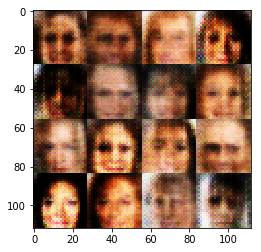

Epoch 1/10... Discriminator Loss: 0.7065... Generator Loss: 0.9920
Epoch 1/10... Discriminator Loss: 1.0803... Generator Loss: 0.6015
Epoch 1/10... Discriminator Loss: 1.2107... Generator Loss: 0.5134
Epoch 1/10... Discriminator Loss: 0.6070... Generator Loss: 3.3991
Epoch 1/10... Discriminator Loss: 0.6912... Generator Loss: 0.9673
Epoch 1/10... Discriminator Loss: 0.5032... Generator Loss: 1.3932
Epoch 1/10... Discriminator Loss: 0.7076... Generator Loss: 1.0791
Epoch 1/10... Discriminator Loss: 0.8696... Generator Loss: 5.7112
Epoch 1/10... Discriminator Loss: 1.1798... Generator Loss: 5.7502
Epoch 1/10... Discriminator Loss: 0.7213... Generator Loss: 1.1312


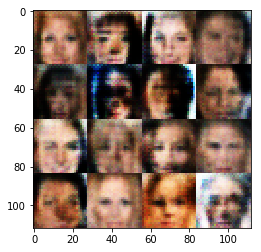

Epoch 1/10... Discriminator Loss: 1.3976... Generator Loss: 0.4317
Epoch 1/10... Discriminator Loss: 0.5929... Generator Loss: 4.9002
Epoch 1/10... Discriminator Loss: 1.0824... Generator Loss: 0.6118
Epoch 1/10... Discriminator Loss: 0.7328... Generator Loss: 1.1188
Epoch 1/10... Discriminator Loss: 0.8219... Generator Loss: 3.8574
Epoch 1/10... Discriminator Loss: 1.3971... Generator Loss: 0.3971
Epoch 1/10... Discriminator Loss: 0.3832... Generator Loss: 1.7143
Epoch 1/10... Discriminator Loss: 0.6701... Generator Loss: 1.0108
Epoch 1/10... Discriminator Loss: 0.4809... Generator Loss: 3.7658
Epoch 1/10... Discriminator Loss: 0.4700... Generator Loss: 1.9812


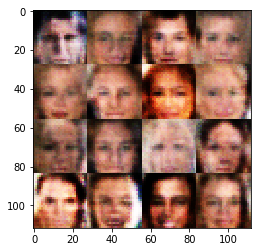

Epoch 1/10... Discriminator Loss: 1.5819... Generator Loss: 0.3716
Epoch 1/10... Discriminator Loss: 0.5403... Generator Loss: 1.1049
Epoch 1/10... Discriminator Loss: 0.1150... Generator Loss: 3.7858
Epoch 1/10... Discriminator Loss: 0.8556... Generator Loss: 1.1003
Epoch 1/10... Discriminator Loss: 0.8323... Generator Loss: 0.8286
Epoch 1/10... Discriminator Loss: 2.4891... Generator Loss: 0.1137
Epoch 1/10... Discriminator Loss: 0.7099... Generator Loss: 5.1962
Epoch 1/10... Discriminator Loss: 0.4555... Generator Loss: 3.4323
Epoch 1/10... Discriminator Loss: 0.2439... Generator Loss: 6.1532
Epoch 1/10... Discriminator Loss: 0.4624... Generator Loss: 1.4220


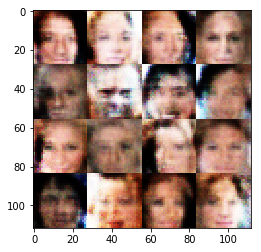

Epoch 1/10... Discriminator Loss: 0.4196... Generator Loss: 2.5625
Epoch 1/10... Discriminator Loss: 0.4550... Generator Loss: 7.2883
Epoch 1/10... Discriminator Loss: 0.9395... Generator Loss: 0.7170
Epoch 1/10... Discriminator Loss: 0.3378... Generator Loss: 2.8925
Epoch 1/10... Discriminator Loss: 0.9994... Generator Loss: 1.7817
Epoch 1/10... Discriminator Loss: 2.2081... Generator Loss: 0.1536
Epoch 1/10... Discriminator Loss: 0.3196... Generator Loss: 1.9107
Epoch 1/10... Discriminator Loss: 0.5566... Generator Loss: 3.9850
Epoch 1/10... Discriminator Loss: 0.4391... Generator Loss: 5.5746
Epoch 1/10... Discriminator Loss: 1.1710... Generator Loss: 7.6764


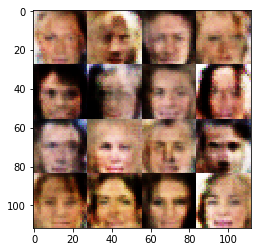

Epoch 1/10... Discriminator Loss: 1.3386... Generator Loss: 1.2132
Epoch 1/10... Discriminator Loss: 0.3312... Generator Loss: 2.7036
Epoch 1/10... Discriminator Loss: 0.3073... Generator Loss: 2.9033
Epoch 1/10... Discriminator Loss: 0.4978... Generator Loss: 1.2690
Epoch 1/10... Discriminator Loss: 2.0919... Generator Loss: 0.1681
Epoch 1/10... Discriminator Loss: 0.2506... Generator Loss: 2.4785
Epoch 1/10... Discriminator Loss: 1.0439... Generator Loss: 0.5575
Epoch 1/10... Discriminator Loss: 0.1416... Generator Loss: 4.0429
Epoch 1/10... Discriminator Loss: 0.2425... Generator Loss: 2.3663
Epoch 1/10... Discriminator Loss: 0.1041... Generator Loss: 5.2391


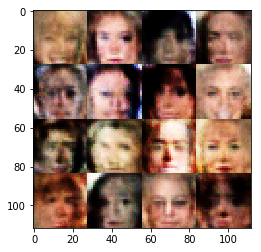

Epoch 1/10... Discriminator Loss: 1.3326... Generator Loss: 1.3590
Epoch 1/10... Discriminator Loss: 1.1074... Generator Loss: 0.8851
Epoch 1/10... Discriminator Loss: 1.2441... Generator Loss: 0.6414
Epoch 1/10... Discriminator Loss: 0.9178... Generator Loss: 1.0808
Epoch 1/10... Discriminator Loss: 0.3547... Generator Loss: 3.9077
Epoch 1/10... Discriminator Loss: 0.9496... Generator Loss: 0.6755
Epoch 1/10... Discriminator Loss: 0.3696... Generator Loss: 2.2484
Epoch 1/10... Discriminator Loss: 0.3416... Generator Loss: 1.8552
Epoch 1/10... Discriminator Loss: 0.5457... Generator Loss: 1.3122
Epoch 1/10... Discriminator Loss: 1.7212... Generator Loss: 2.8238


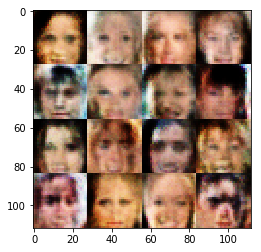

Epoch 1/10... Discriminator Loss: 0.4080... Generator Loss: 1.6152
Epoch 1/10... Discriminator Loss: 0.4596... Generator Loss: 3.2444
Epoch 1/10... Discriminator Loss: 0.4949... Generator Loss: 1.3874
Epoch 1/10... Discriminator Loss: 0.7526... Generator Loss: 3.1120
Epoch 1/10... Discriminator Loss: 1.1256... Generator Loss: 1.8780
Epoch 1/10... Discriminator Loss: 0.3461... Generator Loss: 2.5168
Epoch 1/10... Discriminator Loss: 0.3426... Generator Loss: 2.8605
Epoch 1/10... Discriminator Loss: 0.4063... Generator Loss: 2.2479
Epoch 1/10... Discriminator Loss: 0.8577... Generator Loss: 0.7250
Epoch 1/10... Discriminator Loss: 1.5363... Generator Loss: 0.3083


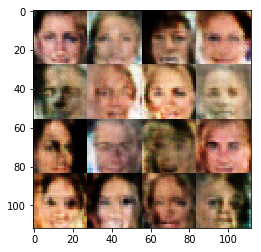

Epoch 1/10... Discriminator Loss: 0.8489... Generator Loss: 1.1217
Epoch 1/10... Discriminator Loss: 0.4930... Generator Loss: 1.4428
Epoch 1/10... Discriminator Loss: 1.0920... Generator Loss: 1.0540
Epoch 1/10... Discriminator Loss: 0.6084... Generator Loss: 2.9902
Epoch 1/10... Discriminator Loss: 0.6793... Generator Loss: 1.0756
Epoch 1/10... Discriminator Loss: 0.6172... Generator Loss: 1.2469
Epoch 1/10... Discriminator Loss: 0.4312... Generator Loss: 4.8205
Epoch 1/10... Discriminator Loss: 0.1827... Generator Loss: 2.7328
Epoch 1/10... Discriminator Loss: 1.3327... Generator Loss: 0.4493
Epoch 1/10... Discriminator Loss: 0.4102... Generator Loss: 3.7036


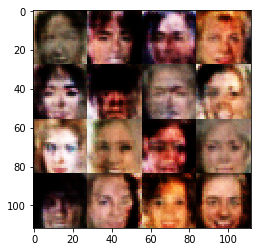

Epoch 1/10... Discriminator Loss: 1.0019... Generator Loss: 0.5579
Epoch 1/10... Discriminator Loss: 0.7973... Generator Loss: 0.7839
Epoch 1/10... Discriminator Loss: 0.2884... Generator Loss: 2.0219
Epoch 1/10... Discriminator Loss: 0.5605... Generator Loss: 4.7482
Epoch 1/10... Discriminator Loss: 0.4528... Generator Loss: 2.2928
Epoch 1/10... Discriminator Loss: 0.8114... Generator Loss: 0.8995
Epoch 1/10... Discriminator Loss: 2.5921... Generator Loss: 0.1030
Epoch 1/10... Discriminator Loss: 0.3607... Generator Loss: 3.1391
Epoch 1/10... Discriminator Loss: 0.4587... Generator Loss: 1.6283
Epoch 1/10... Discriminator Loss: 0.4390... Generator Loss: 2.7554


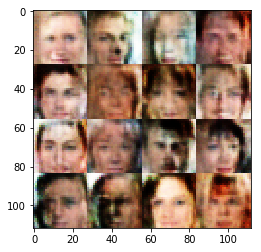

Epoch 1/10... Discriminator Loss: 0.6051... Generator Loss: 1.1017
Epoch 1/10... Discriminator Loss: 0.2229... Generator Loss: 2.7499
Epoch 1/10... Discriminator Loss: 1.3856... Generator Loss: 0.3367
Epoch 1/10... Discriminator Loss: 1.1490... Generator Loss: 0.5346
Epoch 1/10... Discriminator Loss: 0.6082... Generator Loss: 1.2628
Epoch 1/10... Discriminator Loss: 1.4994... Generator Loss: 0.3261
Epoch 1/10... Discriminator Loss: 0.3939... Generator Loss: 2.2920
Epoch 1/10... Discriminator Loss: 0.4530... Generator Loss: 1.6050
Epoch 1/10... Discriminator Loss: 1.3219... Generator Loss: 3.8341
Epoch 1/10... Discriminator Loss: 0.4200... Generator Loss: 1.4093


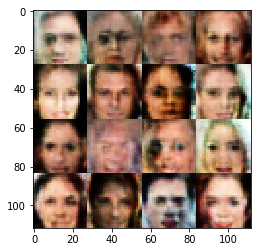

Epoch 1/10... Discriminator Loss: 1.4234... Generator Loss: 0.3606
Epoch 1/10... Discriminator Loss: 0.4131... Generator Loss: 1.7640
Epoch 1/10... Discriminator Loss: 0.6134... Generator Loss: 1.4311
Epoch 1/10... Discriminator Loss: 0.4157... Generator Loss: 1.3054
Epoch 1/10... Discriminator Loss: 0.8146... Generator Loss: 1.2582
Epoch 1/10... Discriminator Loss: 1.4581... Generator Loss: 0.3311
Epoch 1/10... Discriminator Loss: 0.5892... Generator Loss: 1.1623
Epoch 1/10... Discriminator Loss: 0.8769... Generator Loss: 0.6778
Epoch 1/10... Discriminator Loss: 0.6886... Generator Loss: 1.0029
Epoch 1/10... Discriminator Loss: 2.0181... Generator Loss: 0.1837


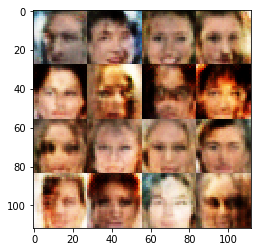

Epoch 1/10... Discriminator Loss: 0.7011... Generator Loss: 3.9099
Epoch 1/10... Discriminator Loss: 0.1137... Generator Loss: 3.8467
Epoch 1/10... Discriminator Loss: 0.2518... Generator Loss: 2.2752
Epoch 1/10... Discriminator Loss: 0.2277... Generator Loss: 1.9700
Epoch 1/10... Discriminator Loss: 0.2676... Generator Loss: 2.3684
Epoch 1/10... Discriminator Loss: 0.6108... Generator Loss: 0.9887
Epoch 1/10... Discriminator Loss: 0.4595... Generator Loss: 3.2881
Epoch 1/10... Discriminator Loss: 1.0658... Generator Loss: 0.7754
Epoch 1/10... Discriminator Loss: 0.8908... Generator Loss: 3.5877
Epoch 1/10... Discriminator Loss: 0.8378... Generator Loss: 0.7581


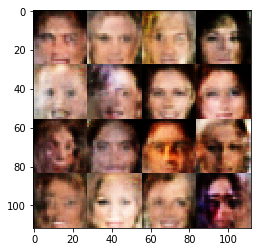

Epoch 1/10... Discriminator Loss: 2.6825... Generator Loss: 0.1297
Epoch 1/10... Discriminator Loss: 0.7767... Generator Loss: 0.8240
Epoch 1/10... Discriminator Loss: 0.4636... Generator Loss: 1.5140
Epoch 1/10... Discriminator Loss: 0.3175... Generator Loss: 1.7823
Epoch 1/10... Discriminator Loss: 0.8193... Generator Loss: 0.8606
Epoch 1/10... Discriminator Loss: 0.4490... Generator Loss: 3.2240
Epoch 1/10... Discriminator Loss: 1.0393... Generator Loss: 0.5963
Epoch 1/10... Discriminator Loss: 0.2134... Generator Loss: 2.8759
Epoch 1/10... Discriminator Loss: 0.1031... Generator Loss: 5.1981
Epoch 1/10... Discriminator Loss: 1.8302... Generator Loss: 0.2292


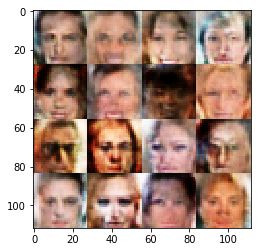

Epoch 1/10... Discriminator Loss: 0.2585... Generator Loss: 2.9236
Epoch 1/10... Discriminator Loss: 0.2994... Generator Loss: 2.1281
Epoch 1/10... Discriminator Loss: 0.8853... Generator Loss: 0.7857
Epoch 1/10... Discriminator Loss: 1.0360... Generator Loss: 0.7990
Epoch 1/10... Discriminator Loss: 0.8652... Generator Loss: 0.9043
Epoch 1/10... Discriminator Loss: 1.4318... Generator Loss: 0.3955
Epoch 1/10... Discriminator Loss: 0.3040... Generator Loss: 2.1210
Epoch 1/10... Discriminator Loss: 1.4223... Generator Loss: 0.3689
Epoch 1/10... Discriminator Loss: 0.1906... Generator Loss: 2.6255
Epoch 1/10... Discriminator Loss: 0.4532... Generator Loss: 2.7948


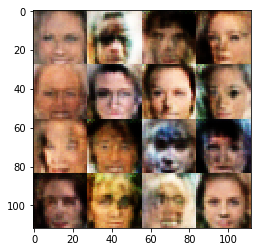

Epoch 1/10... Discriminator Loss: 0.4143... Generator Loss: 1.6147
Epoch 1/10... Discriminator Loss: 0.4104... Generator Loss: 1.9761
Epoch 1/10... Discriminator Loss: 0.3281... Generator Loss: 1.7345
Epoch 1/10... Discriminator Loss: 0.4565... Generator Loss: 2.1798
Epoch 1/10... Discriminator Loss: 1.0969... Generator Loss: 0.6464
Epoch 1/10... Discriminator Loss: 0.5913... Generator Loss: 1.5952
Epoch 1/10... Discriminator Loss: 0.5150... Generator Loss: 1.7831
Epoch 1/10... Discriminator Loss: 0.2263... Generator Loss: 2.4940
Epoch 1/10... Discriminator Loss: 0.5026... Generator Loss: 1.3117
Epoch 1/10... Discriminator Loss: 0.8733... Generator Loss: 1.5807


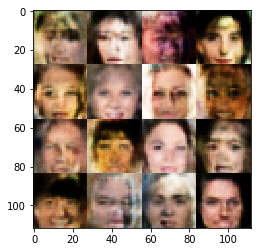

Epoch 1/10... Discriminator Loss: 1.8062... Generator Loss: 2.8851
Epoch 1/10... Discriminator Loss: 0.0574... Generator Loss: 4.3004
Epoch 1/10... Discriminator Loss: 0.5348... Generator Loss: 1.1287
Epoch 1/10... Discriminator Loss: 0.2051... Generator Loss: 2.7799
Epoch 1/10... Discriminator Loss: 0.4405... Generator Loss: 1.3642
Epoch 1/10... Discriminator Loss: 1.2017... Generator Loss: 0.5059
Epoch 1/10... Discriminator Loss: 0.8357... Generator Loss: 0.7637
Epoch 1/10... Discriminator Loss: 0.3457... Generator Loss: 2.4056
Epoch 1/10... Discriminator Loss: 2.1737... Generator Loss: 2.9226
Epoch 1/10... Discriminator Loss: 0.9949... Generator Loss: 0.6706


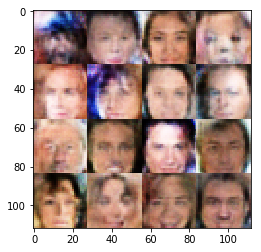

Epoch 1/10... Discriminator Loss: 0.3544... Generator Loss: 2.1526
Epoch 1/10... Discriminator Loss: 0.9091... Generator Loss: 0.7055
Epoch 1/10... Discriminator Loss: 0.2327... Generator Loss: 2.0331
Epoch 1/10... Discriminator Loss: 0.4609... Generator Loss: 1.8717
Epoch 1/10... Discriminator Loss: 0.6148... Generator Loss: 2.2102
Epoch 1/10... Discriminator Loss: 0.2451... Generator Loss: 2.0665
Epoch 1/10... Discriminator Loss: 0.2097... Generator Loss: 2.2544
Epoch 1/10... Discriminator Loss: 0.5147... Generator Loss: 1.8882
Epoch 1/10... Discriminator Loss: 1.4398... Generator Loss: 0.3806
Epoch 1/10... Discriminator Loss: 1.1330... Generator Loss: 0.5592


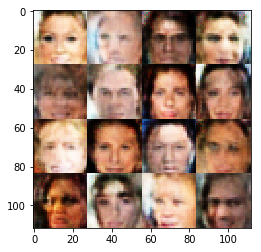

Epoch 1/10... Discriminator Loss: 0.8205... Generator Loss: 0.7958
Epoch 1/10... Discriminator Loss: 0.2984... Generator Loss: 2.8961
Epoch 1/10... Discriminator Loss: 0.6520... Generator Loss: 1.0721
Epoch 1/10... Discriminator Loss: 0.5443... Generator Loss: 1.5755
Epoch 1/10... Discriminator Loss: 0.3248... Generator Loss: 1.9067
Epoch 1/10... Discriminator Loss: 0.4216... Generator Loss: 1.3533
Epoch 1/10... Discriminator Loss: 0.6082... Generator Loss: 3.5187
Epoch 1/10... Discriminator Loss: 1.0320... Generator Loss: 0.5533
Epoch 1/10... Discriminator Loss: 0.2940... Generator Loss: 1.9934
Epoch 1/10... Discriminator Loss: 1.1771... Generator Loss: 2.8159


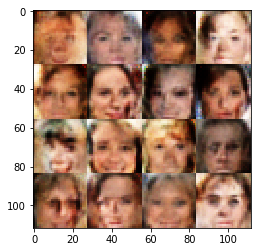

Epoch 1/10... Discriminator Loss: 0.7445... Generator Loss: 1.5870
Epoch 1/10... Discriminator Loss: 0.3837... Generator Loss: 2.1507
Epoch 1/10... Discriminator Loss: 0.5630... Generator Loss: 1.7527
Epoch 1/10... Discriminator Loss: 0.4528... Generator Loss: 1.8284
Epoch 1/10... Discriminator Loss: 0.4312... Generator Loss: 1.9512
Epoch 1/10... Discriminator Loss: 0.2224... Generator Loss: 2.3533
Epoch 1/10... Discriminator Loss: 0.5946... Generator Loss: 1.0299
Epoch 1/10... Discriminator Loss: 0.3434... Generator Loss: 2.4151
Epoch 1/10... Discriminator Loss: 0.4164... Generator Loss: 1.9087
Epoch 1/10... Discriminator Loss: 0.4225... Generator Loss: 1.4667


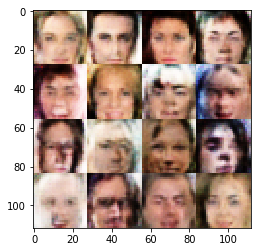

Epoch 1/10... Discriminator Loss: 0.1141... Generator Loss: 4.3718
Epoch 1/10... Discriminator Loss: 0.1850... Generator Loss: 3.3721
Epoch 1/10... Discriminator Loss: 1.2615... Generator Loss: 0.4731
Epoch 1/10... Discriminator Loss: 0.2970... Generator Loss: 2.0891
Epoch 1/10... Discriminator Loss: 0.5722... Generator Loss: 1.3970
Epoch 1/10... Discriminator Loss: 0.6021... Generator Loss: 1.0314
Epoch 1/10... Discriminator Loss: 0.6700... Generator Loss: 1.0880
Epoch 1/10... Discriminator Loss: 0.2292... Generator Loss: 2.0541
Epoch 1/10... Discriminator Loss: 0.2862... Generator Loss: 1.9747
Epoch 1/10... Discriminator Loss: 0.2842... Generator Loss: 1.9800


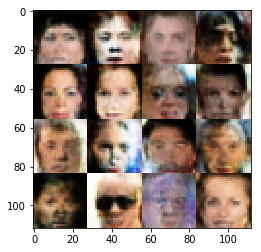

Epoch 1/10... Discriminator Loss: 0.1830... Generator Loss: 2.3305
Epoch 1/10... Discriminator Loss: 0.3406... Generator Loss: 1.7607
Epoch 1/10... Discriminator Loss: 0.1611... Generator Loss: 4.3474
Epoch 1/10... Discriminator Loss: 0.3725... Generator Loss: 2.4567
Epoch 1/10... Discriminator Loss: 0.6000... Generator Loss: 1.0609
Epoch 1/10... Discriminator Loss: 0.5577... Generator Loss: 1.2311
Epoch 1/10... Discriminator Loss: 0.2197... Generator Loss: 2.2055
Epoch 1/10... Discriminator Loss: 0.4109... Generator Loss: 2.2758
Epoch 1/10... Discriminator Loss: 1.3725... Generator Loss: 2.5671
Epoch 1/10... Discriminator Loss: 0.8757... Generator Loss: 0.8106


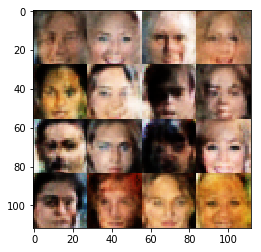

Epoch 1/10... Discriminator Loss: 1.5764... Generator Loss: 3.8357
Epoch 1/10... Discriminator Loss: 0.5102... Generator Loss: 3.1921
Epoch 1/10... Discriminator Loss: 0.1432... Generator Loss: 2.7651
Epoch 1/10... Discriminator Loss: 0.1437... Generator Loss: 3.4776
Epoch 1/10... Discriminator Loss: 0.1834... Generator Loss: 3.9446
Epoch 1/10... Discriminator Loss: 0.1281... Generator Loss: 3.4709
Epoch 1/10... Discriminator Loss: 0.0838... Generator Loss: 5.5239
Epoch 1/10... Discriminator Loss: 0.3490... Generator Loss: 1.5942
Epoch 1/10... Discriminator Loss: 0.6925... Generator Loss: 0.8747
Epoch 1/10... Discriminator Loss: 1.4284... Generator Loss: 0.3503


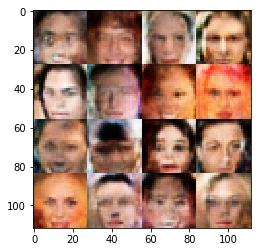

Epoch 1/10... Discriminator Loss: 0.6758... Generator Loss: 1.5270
Epoch 1/10... Discriminator Loss: 1.0288... Generator Loss: 0.6027
Epoch 1/10... Discriminator Loss: 0.6173... Generator Loss: 1.8429
Epoch 1/10... Discriminator Loss: 0.2411... Generator Loss: 2.4692
Epoch 1/10... Discriminator Loss: 0.7709... Generator Loss: 0.8530
Epoch 1/10... Discriminator Loss: 0.2281... Generator Loss: 2.3732
Epoch 1/10... Discriminator Loss: 0.5124... Generator Loss: 1.1859
Epoch 1/10... Discriminator Loss: 0.8015... Generator Loss: 0.7769
Epoch 1/10... Discriminator Loss: 0.1217... Generator Loss: 3.6984
Epoch 1/10... Discriminator Loss: 1.4204... Generator Loss: 0.3489


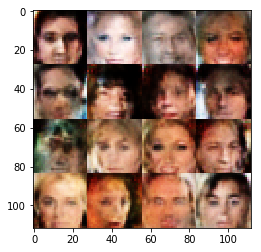

Epoch 1/10... Discriminator Loss: 0.9397... Generator Loss: 0.6939
Epoch 1/10... Discriminator Loss: 1.1752... Generator Loss: 2.9242
Epoch 1/10... Discriminator Loss: 0.2399... Generator Loss: 2.0830
Epoch 1/10... Discriminator Loss: 0.3266... Generator Loss: 2.7074
Epoch 1/10... Discriminator Loss: 0.5151... Generator Loss: 1.8692
Epoch 1/10... Discriminator Loss: 0.4231... Generator Loss: 1.6985
Epoch 1/10... Discriminator Loss: 0.7177... Generator Loss: 1.4664
Epoch 1/10... Discriminator Loss: 0.5005... Generator Loss: 2.3603
Epoch 1/10... Discriminator Loss: 0.5838... Generator Loss: 1.2093
Epoch 1/10... Discriminator Loss: 1.1262... Generator Loss: 2.1128


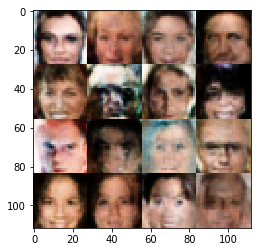

Epoch 1/10... Discriminator Loss: 5.0303... Generator Loss: 6.4969
Epoch 1/10... Discriminator Loss: 0.9402... Generator Loss: 1.3278
Epoch 1/10... Discriminator Loss: 0.4701... Generator Loss: 1.7863
Epoch 1/10... Discriminator Loss: 0.2736... Generator Loss: 2.7749
Epoch 1/10... Discriminator Loss: 0.3540... Generator Loss: 1.8344
Epoch 1/10... Discriminator Loss: 0.3850... Generator Loss: 1.8184
Epoch 1/10... Discriminator Loss: 0.6111... Generator Loss: 1.0472
Epoch 1/10... Discriminator Loss: 0.1244... Generator Loss: 3.1135
Epoch 1/10... Discriminator Loss: 0.2137... Generator Loss: 2.5669
Epoch 1/10... Discriminator Loss: 0.5484... Generator Loss: 1.8497


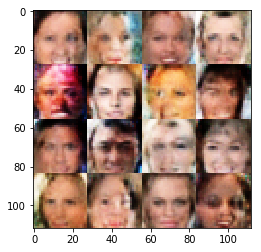

Epoch 1/10... Discriminator Loss: 0.4945... Generator Loss: 1.2835
Epoch 1/10... Discriminator Loss: 0.2269... Generator Loss: 2.8319
Epoch 1/10... Discriminator Loss: 0.3017... Generator Loss: 2.8551
Epoch 1/10... Discriminator Loss: 0.3449... Generator Loss: 1.5844
Epoch 1/10... Discriminator Loss: 0.3160... Generator Loss: 1.9188
Epoch 1/10... Discriminator Loss: 0.1974... Generator Loss: 5.0328
Epoch 1/10... Discriminator Loss: 0.8071... Generator Loss: 0.7428
Epoch 1/10... Discriminator Loss: 0.3347... Generator Loss: 1.7602
Epoch 1/10... Discriminator Loss: 0.3548... Generator Loss: 3.7141
Epoch 1/10... Discriminator Loss: 1.6899... Generator Loss: 0.3143


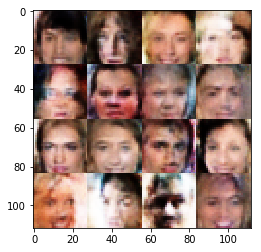

Epoch 1/10... Discriminator Loss: 1.0260... Generator Loss: 3.8717
Epoch 1/10... Discriminator Loss: 5.1861... Generator Loss: 6.0543
Epoch 1/10... Discriminator Loss: 0.9167... Generator Loss: 2.3413
Epoch 1/10... Discriminator Loss: 0.7862... Generator Loss: 4.1054
Epoch 1/10... Discriminator Loss: 0.2647... Generator Loss: 2.2079
Epoch 1/10... Discriminator Loss: 0.6193... Generator Loss: 4.7506
Epoch 1/10... Discriminator Loss: 0.3712... Generator Loss: 1.5377
Epoch 1/10... Discriminator Loss: 0.3604... Generator Loss: 2.2034
Epoch 1/10... Discriminator Loss: 0.1154... Generator Loss: 5.1682
Epoch 1/10... Discriminator Loss: 0.3720... Generator Loss: 2.6923


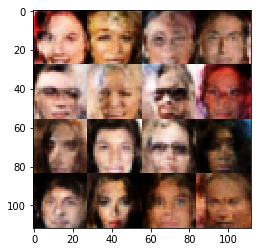

Epoch 1/10... Discriminator Loss: 0.9439... Generator Loss: 0.6985
Epoch 1/10... Discriminator Loss: 0.7574... Generator Loss: 0.9287
Epoch 1/10... Discriminator Loss: 0.5077... Generator Loss: 2.2161
Epoch 1/10... Discriminator Loss: 0.2758... Generator Loss: 2.1525
Epoch 1/10... Discriminator Loss: 0.4010... Generator Loss: 1.5407
Epoch 1/10... Discriminator Loss: 1.7961... Generator Loss: 0.2617
Epoch 2/10... Discriminator Loss: 0.7391... Generator Loss: 1.0070
Epoch 2/10... Discriminator Loss: 0.5802... Generator Loss: 1.3810
Epoch 2/10... Discriminator Loss: 1.0205... Generator Loss: 0.5571
Epoch 2/10... Discriminator Loss: 0.6645... Generator Loss: 2.9038


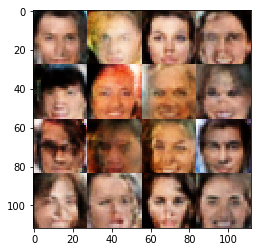

Epoch 2/10... Discriminator Loss: 0.5724... Generator Loss: 1.0853
Epoch 2/10... Discriminator Loss: 1.6457... Generator Loss: 0.2659
Epoch 2/10... Discriminator Loss: 0.5639... Generator Loss: 2.0529
Epoch 2/10... Discriminator Loss: 0.5233... Generator Loss: 1.1936
Epoch 2/10... Discriminator Loss: 0.1079... Generator Loss: 3.6264
Epoch 2/10... Discriminator Loss: 0.4987... Generator Loss: 1.1707
Epoch 2/10... Discriminator Loss: 0.3118... Generator Loss: 1.9579
Epoch 2/10... Discriminator Loss: 0.3062... Generator Loss: 1.9855
Epoch 2/10... Discriminator Loss: 0.3184... Generator Loss: 2.7839
Epoch 2/10... Discriminator Loss: 0.9285... Generator Loss: 0.6621


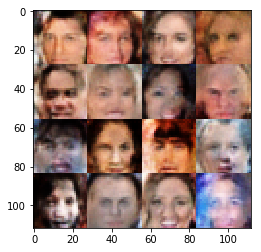

Epoch 2/10... Discriminator Loss: 0.8167... Generator Loss: 0.7660
Epoch 2/10... Discriminator Loss: 0.1073... Generator Loss: 4.5319
Epoch 2/10... Discriminator Loss: 0.9804... Generator Loss: 0.6224
Epoch 2/10... Discriminator Loss: 0.1153... Generator Loss: 3.2517
Epoch 2/10... Discriminator Loss: 0.7222... Generator Loss: 2.9478
Epoch 2/10... Discriminator Loss: 0.7841... Generator Loss: 0.7934
Epoch 2/10... Discriminator Loss: 0.3210... Generator Loss: 1.8041
Epoch 2/10... Discriminator Loss: 0.5076... Generator Loss: 1.2618
Epoch 2/10... Discriminator Loss: 0.6973... Generator Loss: 6.2451
Epoch 2/10... Discriminator Loss: 0.2435... Generator Loss: 2.3080


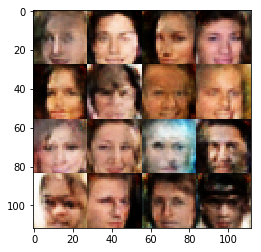

Epoch 2/10... Discriminator Loss: 0.5950... Generator Loss: 1.6096
Epoch 2/10... Discriminator Loss: 0.8400... Generator Loss: 0.7157
Epoch 2/10... Discriminator Loss: 0.2389... Generator Loss: 2.3833
Epoch 2/10... Discriminator Loss: 0.4991... Generator Loss: 1.8625
Epoch 2/10... Discriminator Loss: 0.2624... Generator Loss: 2.0401
Epoch 2/10... Discriminator Loss: 0.2587... Generator Loss: 2.0567
Epoch 2/10... Discriminator Loss: 0.6608... Generator Loss: 5.4623
Epoch 2/10... Discriminator Loss: 1.1845... Generator Loss: 3.8588
Epoch 2/10... Discriminator Loss: 0.3826... Generator Loss: 1.8064
Epoch 2/10... Discriminator Loss: 0.5185... Generator Loss: 1.8685


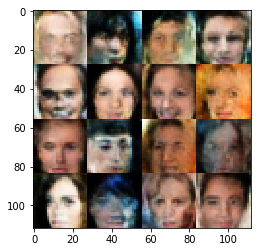

Epoch 2/10... Discriminator Loss: 0.9176... Generator Loss: 0.6551
Epoch 2/10... Discriminator Loss: 0.5454... Generator Loss: 2.8818
Epoch 2/10... Discriminator Loss: 0.4266... Generator Loss: 1.8025
Epoch 2/10... Discriminator Loss: 0.2228... Generator Loss: 4.1278
Epoch 2/10... Discriminator Loss: 0.1306... Generator Loss: 3.1743
Epoch 2/10... Discriminator Loss: 0.5467... Generator Loss: 1.0819
Epoch 2/10... Discriminator Loss: 0.6334... Generator Loss: 1.1105
Epoch 2/10... Discriminator Loss: 0.6892... Generator Loss: 1.0015
Epoch 2/10... Discriminator Loss: 0.6845... Generator Loss: 1.0685
Epoch 2/10... Discriminator Loss: 0.8542... Generator Loss: 0.8480


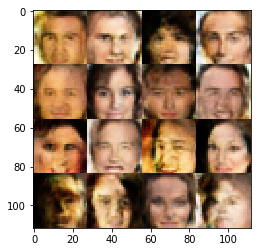

Epoch 2/10... Discriminator Loss: 0.5666... Generator Loss: 2.6575
Epoch 2/10... Discriminator Loss: 0.4562... Generator Loss: 1.5529
Epoch 2/10... Discriminator Loss: 0.6377... Generator Loss: 1.0745
Epoch 2/10... Discriminator Loss: 0.5679... Generator Loss: 1.5188
Epoch 2/10... Discriminator Loss: 0.4901... Generator Loss: 1.3140
Epoch 2/10... Discriminator Loss: 0.4026... Generator Loss: 1.6110
Epoch 2/10... Discriminator Loss: 0.3951... Generator Loss: 1.9344
Epoch 2/10... Discriminator Loss: 0.3894... Generator Loss: 2.3742
Epoch 2/10... Discriminator Loss: 0.1792... Generator Loss: 2.6955
Epoch 2/10... Discriminator Loss: 0.3712... Generator Loss: 2.3356


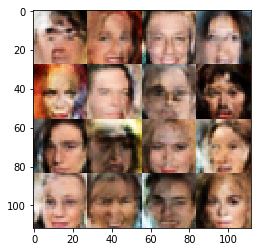

Epoch 2/10... Discriminator Loss: 0.3599... Generator Loss: 1.6336
Epoch 2/10... Discriminator Loss: 0.8400... Generator Loss: 0.7547
Epoch 2/10... Discriminator Loss: 0.9965... Generator Loss: 2.4477
Epoch 2/10... Discriminator Loss: 0.9843... Generator Loss: 4.3845
Epoch 2/10... Discriminator Loss: 0.5426... Generator Loss: 1.2265
Epoch 2/10... Discriminator Loss: 0.7598... Generator Loss: 0.8502
Epoch 2/10... Discriminator Loss: 0.3613... Generator Loss: 3.0526
Epoch 2/10... Discriminator Loss: 0.2544... Generator Loss: 2.8829
Epoch 2/10... Discriminator Loss: 0.4759... Generator Loss: 1.3080
Epoch 2/10... Discriminator Loss: 0.3391... Generator Loss: 1.9949


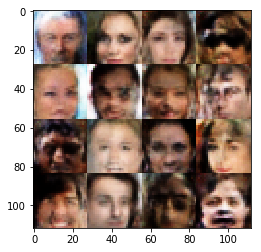

Epoch 2/10... Discriminator Loss: 0.0653... Generator Loss: 4.3302
Epoch 2/10... Discriminator Loss: 0.2938... Generator Loss: 4.3955
Epoch 2/10... Discriminator Loss: 0.0654... Generator Loss: 3.4252
Epoch 2/10... Discriminator Loss: 0.5632... Generator Loss: 1.1763
Epoch 2/10... Discriminator Loss: 3.1767... Generator Loss: 6.1589
Epoch 2/10... Discriminator Loss: 0.6040... Generator Loss: 2.0937
Epoch 2/10... Discriminator Loss: 0.5930... Generator Loss: 1.1049
Epoch 2/10... Discriminator Loss: 0.3850... Generator Loss: 7.3336
Epoch 2/10... Discriminator Loss: 0.2038... Generator Loss: 2.4813
Epoch 2/10... Discriminator Loss: 0.9385... Generator Loss: 0.6811


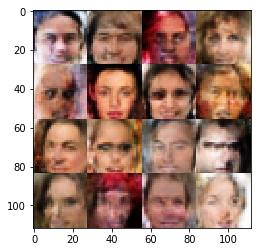

Epoch 2/10... Discriminator Loss: 0.3350... Generator Loss: 3.5361
Epoch 2/10... Discriminator Loss: 0.4071... Generator Loss: 1.6818
Epoch 2/10... Discriminator Loss: 1.0915... Generator Loss: 3.5043
Epoch 2/10... Discriminator Loss: 0.2685... Generator Loss: 2.6068
Epoch 2/10... Discriminator Loss: 0.1329... Generator Loss: 3.2151
Epoch 2/10... Discriminator Loss: 0.4125... Generator Loss: 1.6094
Epoch 2/10... Discriminator Loss: 0.2391... Generator Loss: 2.3119
Epoch 2/10... Discriminator Loss: 0.5003... Generator Loss: 1.3116
Epoch 2/10... Discriminator Loss: 0.0710... Generator Loss: 4.3225
Epoch 2/10... Discriminator Loss: 0.2551... Generator Loss: 2.5069


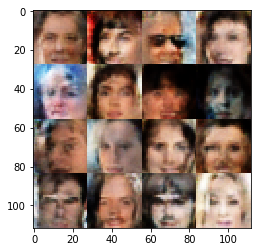

Epoch 2/10... Discriminator Loss: 0.6941... Generator Loss: 0.9701
Epoch 2/10... Discriminator Loss: 0.3580... Generator Loss: 1.6277
Epoch 2/10... Discriminator Loss: 0.3417... Generator Loss: 1.7846
Epoch 2/10... Discriminator Loss: 0.5170... Generator Loss: 1.1723
Epoch 2/10... Discriminator Loss: 1.0515... Generator Loss: 0.5848
Epoch 2/10... Discriminator Loss: 0.5094... Generator Loss: 1.4019
Epoch 2/10... Discriminator Loss: 0.7961... Generator Loss: 0.7727
Epoch 2/10... Discriminator Loss: 0.3118... Generator Loss: 1.9075
Epoch 2/10... Discriminator Loss: 0.3069... Generator Loss: 1.7587
Epoch 2/10... Discriminator Loss: 0.5466... Generator Loss: 4.0166


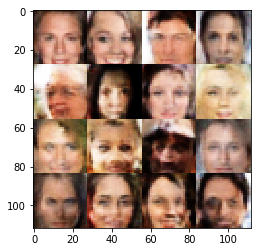

Epoch 2/10... Discriminator Loss: 0.6447... Generator Loss: 2.1458
Epoch 2/10... Discriminator Loss: 1.1219... Generator Loss: 0.6644
Epoch 2/10... Discriminator Loss: 0.4193... Generator Loss: 1.8313
Epoch 2/10... Discriminator Loss: 0.4705... Generator Loss: 1.8214
Epoch 2/10... Discriminator Loss: 1.2791... Generator Loss: 0.4311
Epoch 2/10... Discriminator Loss: 0.3640... Generator Loss: 2.1461
Epoch 2/10... Discriminator Loss: 0.4439... Generator Loss: 3.7512
Epoch 2/10... Discriminator Loss: 0.3775... Generator Loss: 2.5660
Epoch 2/10... Discriminator Loss: 0.5420... Generator Loss: 1.1624
Epoch 2/10... Discriminator Loss: 0.2048... Generator Loss: 2.4685


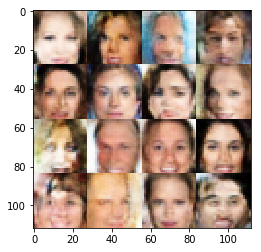

Epoch 2/10... Discriminator Loss: 0.6960... Generator Loss: 0.9248
Epoch 2/10... Discriminator Loss: 0.6442... Generator Loss: 1.6546
Epoch 2/10... Discriminator Loss: 1.0939... Generator Loss: 0.5785
Epoch 2/10... Discriminator Loss: 0.2479... Generator Loss: 2.0807
Epoch 2/10... Discriminator Loss: 4.2196... Generator Loss: 6.7494
Epoch 2/10... Discriminator Loss: 0.3579... Generator Loss: 6.2321
Epoch 2/10... Discriminator Loss: 1.6990... Generator Loss: 0.2861
Epoch 2/10... Discriminator Loss: 0.2253... Generator Loss: 2.3372
Epoch 2/10... Discriminator Loss: 0.4501... Generator Loss: 1.4331
Epoch 2/10... Discriminator Loss: 0.1867... Generator Loss: 2.8048


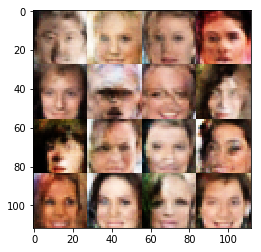

Epoch 2/10... Discriminator Loss: 0.6425... Generator Loss: 1.0279
Epoch 2/10... Discriminator Loss: 0.4643... Generator Loss: 1.2061
Epoch 2/10... Discriminator Loss: 1.9972... Generator Loss: 0.2193
Epoch 2/10... Discriminator Loss: 0.6862... Generator Loss: 0.9385
Epoch 2/10... Discriminator Loss: 0.1825... Generator Loss: 3.1871
Epoch 2/10... Discriminator Loss: 0.1427... Generator Loss: 2.8404
Epoch 2/10... Discriminator Loss: 0.5279... Generator Loss: 3.1759
Epoch 2/10... Discriminator Loss: 0.1929... Generator Loss: 2.3518
Epoch 2/10... Discriminator Loss: 0.7076... Generator Loss: 0.9523
Epoch 2/10... Discriminator Loss: 0.6849... Generator Loss: 2.0260


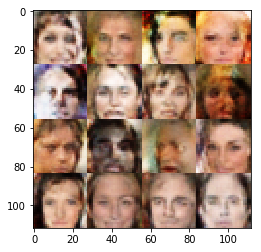

Epoch 2/10... Discriminator Loss: 0.5196... Generator Loss: 1.4445
Epoch 2/10... Discriminator Loss: 0.4972... Generator Loss: 1.9807
Epoch 2/10... Discriminator Loss: 1.6601... Generator Loss: 5.4982
Epoch 2/10... Discriminator Loss: 1.2267... Generator Loss: 0.4504
Epoch 2/10... Discriminator Loss: 0.3544... Generator Loss: 1.6967
Epoch 2/10... Discriminator Loss: 0.8429... Generator Loss: 0.7760
Epoch 2/10... Discriminator Loss: 0.4317... Generator Loss: 1.7231
Epoch 2/10... Discriminator Loss: 0.1416... Generator Loss: 3.0321
Epoch 2/10... Discriminator Loss: 0.5857... Generator Loss: 2.9958
Epoch 2/10... Discriminator Loss: 0.1085... Generator Loss: 3.6108


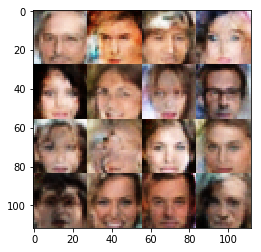

Epoch 2/10... Discriminator Loss: 0.3966... Generator Loss: 1.7779
Epoch 2/10... Discriminator Loss: 0.3418... Generator Loss: 1.7175
Epoch 2/10... Discriminator Loss: 0.1226... Generator Loss: 6.0251
Epoch 2/10... Discriminator Loss: 0.4516... Generator Loss: 1.8920
Epoch 2/10... Discriminator Loss: 0.3986... Generator Loss: 1.5328
Epoch 2/10... Discriminator Loss: 0.0604... Generator Loss: 4.3526
Epoch 2/10... Discriminator Loss: 0.0941... Generator Loss: 4.8386
Epoch 2/10... Discriminator Loss: 0.3162... Generator Loss: 2.4055
Epoch 2/10... Discriminator Loss: 0.7317... Generator Loss: 1.6307
Epoch 2/10... Discriminator Loss: 1.3617... Generator Loss: 4.2975


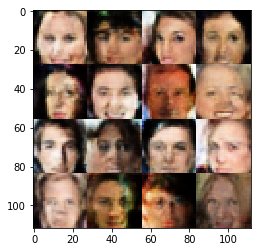

Epoch 2/10... Discriminator Loss: 0.8272... Generator Loss: 1.0192
Epoch 2/10... Discriminator Loss: 0.8186... Generator Loss: 0.8783
Epoch 2/10... Discriminator Loss: 0.4823... Generator Loss: 1.8406
Epoch 2/10... Discriminator Loss: 0.6264... Generator Loss: 3.9121
Epoch 2/10... Discriminator Loss: 1.3883... Generator Loss: 0.4428
Epoch 2/10... Discriminator Loss: 0.3853... Generator Loss: 1.7109
Epoch 2/10... Discriminator Loss: 0.4248... Generator Loss: 2.2198
Epoch 2/10... Discriminator Loss: 0.3013... Generator Loss: 1.8683
Epoch 2/10... Discriminator Loss: 0.2596... Generator Loss: 3.2466
Epoch 2/10... Discriminator Loss: 0.3807... Generator Loss: 1.8041


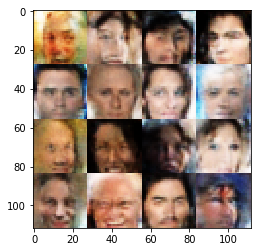

Epoch 2/10... Discriminator Loss: 1.1452... Generator Loss: 0.5307
Epoch 2/10... Discriminator Loss: 0.4128... Generator Loss: 1.8806
Epoch 2/10... Discriminator Loss: 0.4085... Generator Loss: 1.6408
Epoch 2/10... Discriminator Loss: 1.5196... Generator Loss: 0.2996
Epoch 2/10... Discriminator Loss: 0.5239... Generator Loss: 1.2913
Epoch 2/10... Discriminator Loss: 0.7441... Generator Loss: 0.8810
Epoch 2/10... Discriminator Loss: 0.2508... Generator Loss: 2.2547
Epoch 2/10... Discriminator Loss: 0.4016... Generator Loss: 1.6348
Epoch 2/10... Discriminator Loss: 0.7963... Generator Loss: 0.7706
Epoch 2/10... Discriminator Loss: 2.5797... Generator Loss: 5.1568


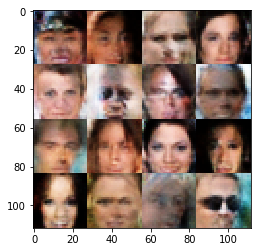

Epoch 2/10... Discriminator Loss: 0.9894... Generator Loss: 2.6157
Epoch 2/10... Discriminator Loss: 0.9564... Generator Loss: 0.6661
Epoch 2/10... Discriminator Loss: 0.9888... Generator Loss: 0.6520
Epoch 2/10... Discriminator Loss: 0.4368... Generator Loss: 1.7643
Epoch 2/10... Discriminator Loss: 0.5197... Generator Loss: 1.1912
Epoch 2/10... Discriminator Loss: 0.2373... Generator Loss: 2.3696
Epoch 2/10... Discriminator Loss: 0.3853... Generator Loss: 1.8110
Epoch 2/10... Discriminator Loss: 0.1158... Generator Loss: 2.9749
Epoch 2/10... Discriminator Loss: 0.5733... Generator Loss: 1.1196
Epoch 2/10... Discriminator Loss: 0.2555... Generator Loss: 2.3249


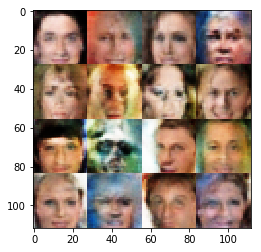

Epoch 2/10... Discriminator Loss: 0.5954... Generator Loss: 1.3743
Epoch 2/10... Discriminator Loss: 0.4033... Generator Loss: 1.8805
Epoch 2/10... Discriminator Loss: 0.8508... Generator Loss: 4.3112
Epoch 2/10... Discriminator Loss: 0.2619... Generator Loss: 4.1406
Epoch 2/10... Discriminator Loss: 1.0777... Generator Loss: 0.5807
Epoch 2/10... Discriminator Loss: 0.2648... Generator Loss: 2.2968
Epoch 2/10... Discriminator Loss: 0.2124... Generator Loss: 2.3256
Epoch 2/10... Discriminator Loss: 0.5777... Generator Loss: 1.7548
Epoch 2/10... Discriminator Loss: 0.2827... Generator Loss: 2.2325
Epoch 2/10... Discriminator Loss: 0.7874... Generator Loss: 0.8031


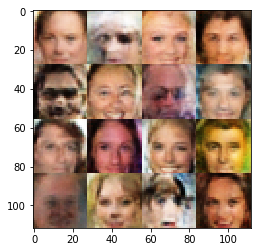

Epoch 2/10... Discriminator Loss: 0.7012... Generator Loss: 0.9237
Epoch 2/10... Discriminator Loss: 0.5007... Generator Loss: 1.3132
Epoch 2/10... Discriminator Loss: 0.5066... Generator Loss: 1.3133
Epoch 2/10... Discriminator Loss: 3.0555... Generator Loss: 6.9384
Epoch 2/10... Discriminator Loss: 0.5451... Generator Loss: 1.5735
Epoch 2/10... Discriminator Loss: 0.4547... Generator Loss: 1.5604
Epoch 2/10... Discriminator Loss: 0.2935... Generator Loss: 2.2402
Epoch 2/10... Discriminator Loss: 0.9200... Generator Loss: 0.7211
Epoch 2/10... Discriminator Loss: 0.7831... Generator Loss: 0.8710
Epoch 2/10... Discriminator Loss: 0.6567... Generator Loss: 0.9769


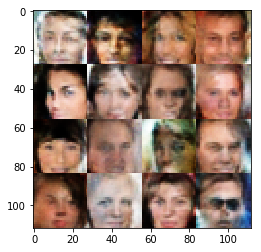

Epoch 2/10... Discriminator Loss: 1.9184... Generator Loss: 0.2160
Epoch 2/10... Discriminator Loss: 0.5416... Generator Loss: 1.2858
Epoch 2/10... Discriminator Loss: 0.4610... Generator Loss: 1.4805
Epoch 2/10... Discriminator Loss: 0.1386... Generator Loss: 3.5256
Epoch 2/10... Discriminator Loss: 0.1369... Generator Loss: 3.2798
Epoch 2/10... Discriminator Loss: 0.3444... Generator Loss: 1.6403
Epoch 2/10... Discriminator Loss: 0.6198... Generator Loss: 1.5171
Epoch 2/10... Discriminator Loss: 0.4935... Generator Loss: 1.2336
Epoch 2/10... Discriminator Loss: 0.3057... Generator Loss: 1.7901
Epoch 2/10... Discriminator Loss: 0.5901... Generator Loss: 1.1818


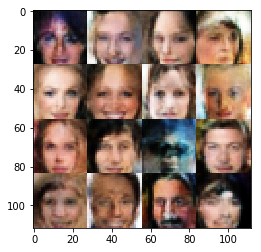

Epoch 2/10... Discriminator Loss: 0.7316... Generator Loss: 1.2377
Epoch 2/10... Discriminator Loss: 1.2834... Generator Loss: 0.4232
Epoch 2/10... Discriminator Loss: 0.2383... Generator Loss: 3.1949
Epoch 2/10... Discriminator Loss: 4.9988... Generator Loss: 6.6549
Epoch 2/10... Discriminator Loss: 1.2059... Generator Loss: 2.5334
Epoch 2/10... Discriminator Loss: 1.2057... Generator Loss: 0.5200
Epoch 2/10... Discriminator Loss: 0.2633... Generator Loss: 4.7157
Epoch 2/10... Discriminator Loss: 0.4153... Generator Loss: 1.4805
Epoch 2/10... Discriminator Loss: 0.4581... Generator Loss: 1.3626
Epoch 2/10... Discriminator Loss: 0.2622... Generator Loss: 2.1451


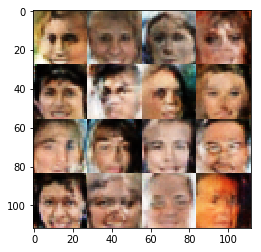

Epoch 2/10... Discriminator Loss: 0.2227... Generator Loss: 2.2218
Epoch 2/10... Discriminator Loss: 0.1119... Generator Loss: 4.1986
Epoch 2/10... Discriminator Loss: 0.2821... Generator Loss: 2.1494
Epoch 2/10... Discriminator Loss: 0.2289... Generator Loss: 2.2458
Epoch 2/10... Discriminator Loss: 0.3315... Generator Loss: 1.8573
Epoch 2/10... Discriminator Loss: 0.1456... Generator Loss: 3.1108
Epoch 2/10... Discriminator Loss: 0.7565... Generator Loss: 5.1496
Epoch 2/10... Discriminator Loss: 0.5971... Generator Loss: 1.0410
Epoch 2/10... Discriminator Loss: 0.4123... Generator Loss: 2.0720
Epoch 2/10... Discriminator Loss: 0.6303... Generator Loss: 1.2513


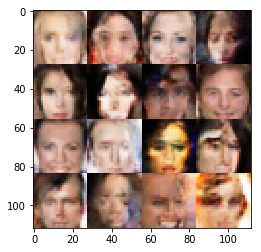

Epoch 2/10... Discriminator Loss: 0.6029... Generator Loss: 1.8285
Epoch 2/10... Discriminator Loss: 1.0760... Generator Loss: 0.5606
Epoch 2/10... Discriminator Loss: 0.3260... Generator Loss: 1.8696
Epoch 2/10... Discriminator Loss: 0.3607... Generator Loss: 1.8683
Epoch 2/10... Discriminator Loss: 0.5406... Generator Loss: 1.2484
Epoch 2/10... Discriminator Loss: 0.6133... Generator Loss: 1.1147
Epoch 2/10... Discriminator Loss: 0.4549... Generator Loss: 1.3735
Epoch 2/10... Discriminator Loss: 0.6387... Generator Loss: 1.5627
Epoch 2/10... Discriminator Loss: 0.4956... Generator Loss: 1.4199
Epoch 2/10... Discriminator Loss: 0.3853... Generator Loss: 1.6647


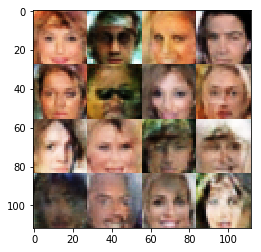

Epoch 2/10... Discriminator Loss: 0.1848... Generator Loss: 2.6631
Epoch 2/10... Discriminator Loss: 0.6400... Generator Loss: 2.1991
Epoch 2/10... Discriminator Loss: 1.2617... Generator Loss: 0.4784
Epoch 2/10... Discriminator Loss: 0.3792... Generator Loss: 1.9954
Epoch 2/10... Discriminator Loss: 1.1271... Generator Loss: 0.5915
Epoch 2/10... Discriminator Loss: 0.5290... Generator Loss: 1.3484
Epoch 2/10... Discriminator Loss: 0.4015... Generator Loss: 2.4080
Epoch 2/10... Discriminator Loss: 0.8960... Generator Loss: 1.7345
Epoch 2/10... Discriminator Loss: 0.6520... Generator Loss: 1.5361
Epoch 2/10... Discriminator Loss: 0.8971... Generator Loss: 2.5969


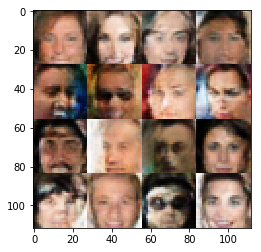

Epoch 2/10... Discriminator Loss: 1.1255... Generator Loss: 0.5693
Epoch 2/10... Discriminator Loss: 0.9823... Generator Loss: 2.5013
Epoch 2/10... Discriminator Loss: 0.9013... Generator Loss: 0.7128
Epoch 2/10... Discriminator Loss: 0.1733... Generator Loss: 2.9742
Epoch 2/10... Discriminator Loss: 0.6129... Generator Loss: 1.0508
Epoch 2/10... Discriminator Loss: 0.7976... Generator Loss: 0.8455
Epoch 2/10... Discriminator Loss: 0.6590... Generator Loss: 1.0887
Epoch 2/10... Discriminator Loss: 0.3318... Generator Loss: 2.0292
Epoch 2/10... Discriminator Loss: 0.5583... Generator Loss: 1.1297
Epoch 2/10... Discriminator Loss: 1.1097... Generator Loss: 0.5953


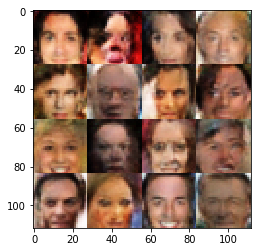

Epoch 2/10... Discriminator Loss: 0.5367... Generator Loss: 1.5803
Epoch 2/10... Discriminator Loss: 0.2689... Generator Loss: 2.0556
Epoch 2/10... Discriminator Loss: 0.2213... Generator Loss: 2.2903
Epoch 2/10... Discriminator Loss: 0.9276... Generator Loss: 0.7513
Epoch 2/10... Discriminator Loss: 0.3971... Generator Loss: 2.2018
Epoch 2/10... Discriminator Loss: 0.4948... Generator Loss: 1.5914
Epoch 2/10... Discriminator Loss: 0.1490... Generator Loss: 3.8294
Epoch 2/10... Discriminator Loss: 0.6389... Generator Loss: 1.3031
Epoch 2/10... Discriminator Loss: 0.4726... Generator Loss: 1.6150
Epoch 2/10... Discriminator Loss: 0.5878... Generator Loss: 1.0538


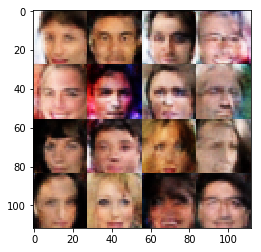

Epoch 2/10... Discriminator Loss: 0.2370... Generator Loss: 3.7553
Epoch 2/10... Discriminator Loss: 1.0980... Generator Loss: 0.5546
Epoch 2/10... Discriminator Loss: 0.3526... Generator Loss: 1.7828
Epoch 2/10... Discriminator Loss: 1.0782... Generator Loss: 0.5660
Epoch 2/10... Discriminator Loss: 0.5686... Generator Loss: 1.1841
Epoch 2/10... Discriminator Loss: 0.3048... Generator Loss: 2.0080
Epoch 2/10... Discriminator Loss: 0.5565... Generator Loss: 2.2349
Epoch 2/10... Discriminator Loss: 0.1775... Generator Loss: 2.6487
Epoch 2/10... Discriminator Loss: 0.5653... Generator Loss: 1.1297
Epoch 2/10... Discriminator Loss: 1.1584... Generator Loss: 0.5306


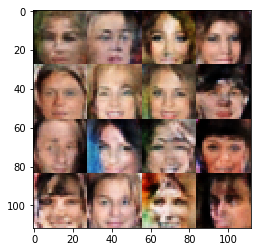

Epoch 2/10... Discriminator Loss: 1.6577... Generator Loss: 0.3574
Epoch 2/10... Discriminator Loss: 0.8580... Generator Loss: 1.9501
Epoch 2/10... Discriminator Loss: 1.2538... Generator Loss: 0.4960
Epoch 2/10... Discriminator Loss: 0.6510... Generator Loss: 2.8485
Epoch 2/10... Discriminator Loss: 0.7017... Generator Loss: 1.1578
Epoch 2/10... Discriminator Loss: 0.2923... Generator Loss: 2.3755
Epoch 2/10... Discriminator Loss: 0.3727... Generator Loss: 1.7220
Epoch 2/10... Discriminator Loss: 0.5900... Generator Loss: 1.1430
Epoch 2/10... Discriminator Loss: 0.6264... Generator Loss: 1.0494
Epoch 2/10... Discriminator Loss: 0.9533... Generator Loss: 0.6699


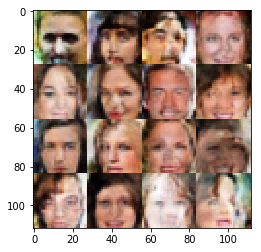

Epoch 2/10... Discriminator Loss: 0.0939... Generator Loss: 3.4917
Epoch 2/10... Discriminator Loss: 0.4976... Generator Loss: 1.3690
Epoch 2/10... Discriminator Loss: 0.6789... Generator Loss: 0.9202
Epoch 2/10... Discriminator Loss: 0.2917... Generator Loss: 1.9406
Epoch 2/10... Discriminator Loss: 0.0639... Generator Loss: 9.1539
Epoch 2/10... Discriminator Loss: 0.5708... Generator Loss: 1.2235
Epoch 2/10... Discriminator Loss: 0.6234... Generator Loss: 1.0555
Epoch 2/10... Discriminator Loss: 0.1366... Generator Loss: 3.4209
Epoch 2/10... Discriminator Loss: 0.5269... Generator Loss: 1.3348
Epoch 2/10... Discriminator Loss: 0.8590... Generator Loss: 0.7749


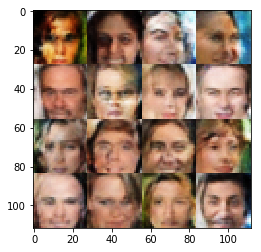

Epoch 2/10... Discriminator Loss: 0.5411... Generator Loss: 2.2261
Epoch 2/10... Discriminator Loss: 0.5192... Generator Loss: 1.7781
Epoch 2/10... Discriminator Loss: 0.5230... Generator Loss: 1.2110
Epoch 2/10... Discriminator Loss: 0.2063... Generator Loss: 2.6581
Epoch 2/10... Discriminator Loss: 0.4957... Generator Loss: 1.3312
Epoch 2/10... Discriminator Loss: 0.1924... Generator Loss: 2.9076
Epoch 2/10... Discriminator Loss: 1.9222... Generator Loss: 0.2637
Epoch 2/10... Discriminator Loss: 0.7467... Generator Loss: 0.9408
Epoch 2/10... Discriminator Loss: 0.6586... Generator Loss: 1.0159
Epoch 2/10... Discriminator Loss: 0.6908... Generator Loss: 1.0053


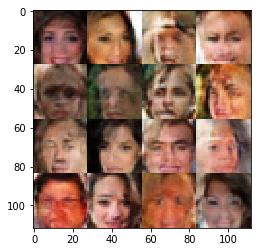

Epoch 2/10... Discriminator Loss: 0.5062... Generator Loss: 1.5565
Epoch 2/10... Discriminator Loss: 0.6627... Generator Loss: 0.9278
Epoch 2/10... Discriminator Loss: 0.5576... Generator Loss: 1.3277
Epoch 2/10... Discriminator Loss: 1.8303... Generator Loss: 0.2795
Epoch 2/10... Discriminator Loss: 0.7464... Generator Loss: 0.9251
Epoch 2/10... Discriminator Loss: 0.0793... Generator Loss: 3.7119
Epoch 2/10... Discriminator Loss: 0.4027... Generator Loss: 1.4943
Epoch 2/10... Discriminator Loss: 1.4491... Generator Loss: 0.3608
Epoch 2/10... Discriminator Loss: 0.3106... Generator Loss: 3.3135
Epoch 2/10... Discriminator Loss: 0.8817... Generator Loss: 0.8238


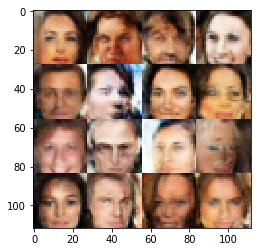

Epoch 2/10... Discriminator Loss: 0.3978... Generator Loss: 3.7037
Epoch 2/10... Discriminator Loss: 0.5840... Generator Loss: 1.1381
Epoch 2/10... Discriminator Loss: 0.1889... Generator Loss: 2.6021
Epoch 3/10... Discriminator Loss: 1.3687... Generator Loss: 0.3821
Epoch 3/10... Discriminator Loss: 1.3752... Generator Loss: 0.4464
Epoch 3/10... Discriminator Loss: 0.6584... Generator Loss: 1.0101
Epoch 3/10... Discriminator Loss: 0.1316... Generator Loss: 3.3465
Epoch 3/10... Discriminator Loss: 0.4563... Generator Loss: 2.5271
Epoch 3/10... Discriminator Loss: 0.6647... Generator Loss: 1.0201
Epoch 3/10... Discriminator Loss: 0.2949... Generator Loss: 1.7646


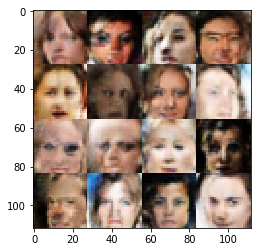

Epoch 3/10... Discriminator Loss: 0.8002... Generator Loss: 0.8601
Epoch 3/10... Discriminator Loss: 0.5086... Generator Loss: 1.3198
Epoch 3/10... Discriminator Loss: 0.7156... Generator Loss: 0.9836
Epoch 3/10... Discriminator Loss: 1.4393... Generator Loss: 0.3706
Epoch 3/10... Discriminator Loss: 0.3451... Generator Loss: 1.6666
Epoch 3/10... Discriminator Loss: 0.3591... Generator Loss: 1.7392
Epoch 3/10... Discriminator Loss: 0.6909... Generator Loss: 0.9238
Epoch 3/10... Discriminator Loss: 0.5956... Generator Loss: 1.1263
Epoch 3/10... Discriminator Loss: 0.3728... Generator Loss: 1.5794
Epoch 3/10... Discriminator Loss: 0.8237... Generator Loss: 0.8325


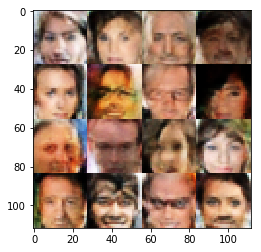

Epoch 3/10... Discriminator Loss: 0.5160... Generator Loss: 1.3713
Epoch 3/10... Discriminator Loss: 0.5283... Generator Loss: 1.2140
Epoch 3/10... Discriminator Loss: 0.3492... Generator Loss: 1.7781
Epoch 3/10... Discriminator Loss: 0.3338... Generator Loss: 1.5280
Epoch 3/10... Discriminator Loss: 0.6858... Generator Loss: 2.2764
Epoch 3/10... Discriminator Loss: 0.6833... Generator Loss: 1.2759
Epoch 3/10... Discriminator Loss: 0.7375... Generator Loss: 1.2306
Epoch 3/10... Discriminator Loss: 0.6365... Generator Loss: 2.2397
Epoch 3/10... Discriminator Loss: 0.4270... Generator Loss: 1.4789
Epoch 3/10... Discriminator Loss: 0.4658... Generator Loss: 1.3769


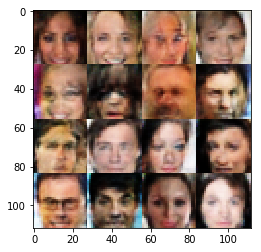

Epoch 3/10... Discriminator Loss: 0.7222... Generator Loss: 0.9590
Epoch 3/10... Discriminator Loss: 0.8302... Generator Loss: 1.0217
Epoch 3/10... Discriminator Loss: 1.7034... Generator Loss: 0.3169
Epoch 3/10... Discriminator Loss: 0.7421... Generator Loss: 1.0111
Epoch 3/10... Discriminator Loss: 0.2148... Generator Loss: 2.3191
Epoch 3/10... Discriminator Loss: 0.4321... Generator Loss: 3.4109
Epoch 3/10... Discriminator Loss: 0.9322... Generator Loss: 0.7135
Epoch 3/10... Discriminator Loss: 0.6126... Generator Loss: 1.0364
Epoch 3/10... Discriminator Loss: 0.6723... Generator Loss: 0.9813
Epoch 3/10... Discriminator Loss: 0.4710... Generator Loss: 1.3426


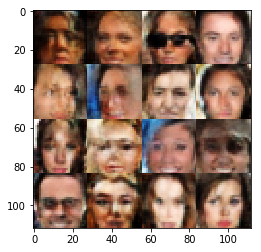

Epoch 3/10... Discriminator Loss: 0.6472... Generator Loss: 0.9750
Epoch 3/10... Discriminator Loss: 0.8016... Generator Loss: 0.8683
Epoch 3/10... Discriminator Loss: 0.0779... Generator Loss: 3.7935
Epoch 3/10... Discriminator Loss: 0.8169... Generator Loss: 0.7829
Epoch 3/10... Discriminator Loss: 0.9491... Generator Loss: 0.7358
Epoch 3/10... Discriminator Loss: 0.3190... Generator Loss: 1.7674
Epoch 3/10... Discriminator Loss: 0.3807... Generator Loss: 1.6453
Epoch 3/10... Discriminator Loss: 0.5912... Generator Loss: 1.6069
Epoch 3/10... Discriminator Loss: 0.3657... Generator Loss: 2.7062
Epoch 3/10... Discriminator Loss: 0.5347... Generator Loss: 1.2077


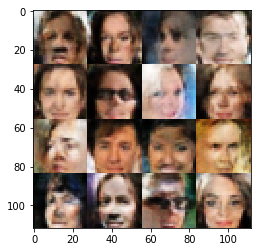

Epoch 3/10... Discriminator Loss: 0.6668... Generator Loss: 0.9819
Epoch 3/10... Discriminator Loss: 0.5606... Generator Loss: 1.1672
Epoch 3/10... Discriminator Loss: 0.1852... Generator Loss: 2.5976
Epoch 3/10... Discriminator Loss: 0.4126... Generator Loss: 1.4766
Epoch 3/10... Discriminator Loss: 0.5120... Generator Loss: 1.3005
Epoch 3/10... Discriminator Loss: 0.3382... Generator Loss: 1.6130
Epoch 3/10... Discriminator Loss: 0.4362... Generator Loss: 1.5330
Epoch 3/10... Discriminator Loss: 0.4562... Generator Loss: 2.0319
Epoch 3/10... Discriminator Loss: 0.9909... Generator Loss: 0.6228
Epoch 3/10... Discriminator Loss: 1.3430... Generator Loss: 0.4169


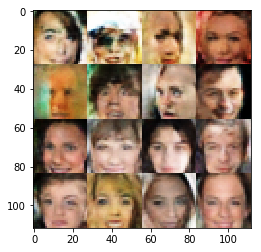

Epoch 3/10... Discriminator Loss: 0.5333... Generator Loss: 1.3163
Epoch 3/10... Discriminator Loss: 0.3624... Generator Loss: 2.0853
Epoch 3/10... Discriminator Loss: 0.2897... Generator Loss: 2.8636
Epoch 3/10... Discriminator Loss: 0.3636... Generator Loss: 1.5634
Epoch 3/10... Discriminator Loss: 1.0146... Generator Loss: 0.6135
Epoch 3/10... Discriminator Loss: 0.2398... Generator Loss: 3.3965
Epoch 3/10... Discriminator Loss: 0.4102... Generator Loss: 1.3986
Epoch 3/10... Discriminator Loss: 0.6078... Generator Loss: 2.5368
Epoch 3/10... Discriminator Loss: 0.5865... Generator Loss: 3.3934
Epoch 3/10... Discriminator Loss: 1.7106... Generator Loss: 3.2067


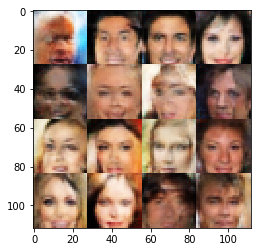

Epoch 3/10... Discriminator Loss: 0.8689... Generator Loss: 0.8673
Epoch 3/10... Discriminator Loss: 1.3746... Generator Loss: 0.3863
Epoch 3/10... Discriminator Loss: 0.5584... Generator Loss: 1.3417
Epoch 3/10... Discriminator Loss: 0.1961... Generator Loss: 3.0232
Epoch 3/10... Discriminator Loss: 0.4855... Generator Loss: 2.7342
Epoch 3/10... Discriminator Loss: 0.3975... Generator Loss: 1.8613
Epoch 3/10... Discriminator Loss: 0.6359... Generator Loss: 1.1864
Epoch 3/10... Discriminator Loss: 3.2517... Generator Loss: 0.0767
Epoch 3/10... Discriminator Loss: 0.5590... Generator Loss: 1.7280
Epoch 3/10... Discriminator Loss: 0.7451... Generator Loss: 2.3161


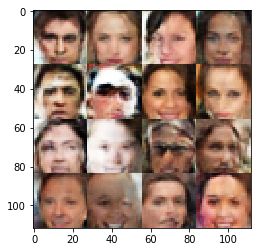

Epoch 3/10... Discriminator Loss: 0.4968... Generator Loss: 1.7741
Epoch 3/10... Discriminator Loss: 0.4466... Generator Loss: 2.2176
Epoch 3/10... Discriminator Loss: 0.9909... Generator Loss: 0.6357
Epoch 3/10... Discriminator Loss: 0.8313... Generator Loss: 0.7895
Epoch 3/10... Discriminator Loss: 0.6750... Generator Loss: 0.9648
Epoch 3/10... Discriminator Loss: 0.5059... Generator Loss: 1.2636
Epoch 3/10... Discriminator Loss: 0.6028... Generator Loss: 1.1293
Epoch 3/10... Discriminator Loss: 0.1169... Generator Loss: 3.1273
Epoch 3/10... Discriminator Loss: 0.1273... Generator Loss: 2.9821
Epoch 3/10... Discriminator Loss: 0.5972... Generator Loss: 1.2894


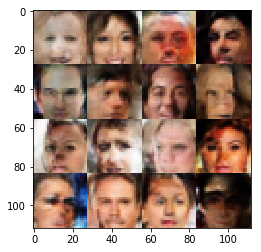

Epoch 3/10... Discriminator Loss: 0.4284... Generator Loss: 1.3837
Epoch 3/10... Discriminator Loss: 1.4539... Generator Loss: 0.4205
Epoch 3/10... Discriminator Loss: 0.8721... Generator Loss: 0.7282
Epoch 3/10... Discriminator Loss: 0.8244... Generator Loss: 0.8081
Epoch 3/10... Discriminator Loss: 1.8704... Generator Loss: 6.5018
Epoch 3/10... Discriminator Loss: 0.8202... Generator Loss: 0.8616
Epoch 3/10... Discriminator Loss: 0.6721... Generator Loss: 1.3266
Epoch 3/10... Discriminator Loss: 0.3157... Generator Loss: 2.1732
Epoch 3/10... Discriminator Loss: 0.6126... Generator Loss: 1.1733
Epoch 3/10... Discriminator Loss: 0.1816... Generator Loss: 3.0006


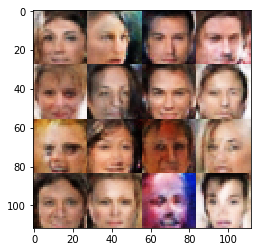

Epoch 3/10... Discriminator Loss: 0.3688... Generator Loss: 2.4900
Epoch 3/10... Discriminator Loss: 0.4026... Generator Loss: 1.5608
Epoch 3/10... Discriminator Loss: 0.3479... Generator Loss: 2.0400
Epoch 3/10... Discriminator Loss: 0.6504... Generator Loss: 1.0436
Epoch 3/10... Discriminator Loss: 0.4728... Generator Loss: 1.5499
Epoch 3/10... Discriminator Loss: 0.1603... Generator Loss: 2.9869
Epoch 3/10... Discriminator Loss: 0.5332... Generator Loss: 1.3322
Epoch 3/10... Discriminator Loss: 0.2829... Generator Loss: 2.4573
Epoch 3/10... Discriminator Loss: 0.4611... Generator Loss: 1.6557
Epoch 3/10... Discriminator Loss: 0.5183... Generator Loss: 1.6343


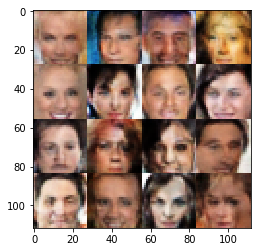

Epoch 3/10... Discriminator Loss: 0.8116... Generator Loss: 0.8165
Epoch 3/10... Discriminator Loss: 0.9499... Generator Loss: 0.6816
Epoch 3/10... Discriminator Loss: 0.4000... Generator Loss: 1.9210
Epoch 3/10... Discriminator Loss: 0.2507... Generator Loss: 3.1319
Epoch 3/10... Discriminator Loss: 0.7857... Generator Loss: 0.8655
Epoch 3/10... Discriminator Loss: 0.2650... Generator Loss: 4.1904
Epoch 3/10... Discriminator Loss: 1.4622... Generator Loss: 0.3755
Epoch 3/10... Discriminator Loss: 0.5901... Generator Loss: 1.2114
Epoch 3/10... Discriminator Loss: 0.2823... Generator Loss: 2.5985
Epoch 3/10... Discriminator Loss: 1.0464... Generator Loss: 0.5364


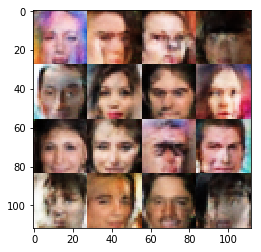

Epoch 3/10... Discriminator Loss: 1.4141... Generator Loss: 0.4189
Epoch 3/10... Discriminator Loss: 2.8314... Generator Loss: 5.9745
Epoch 3/10... Discriminator Loss: 0.6562... Generator Loss: 1.0706
Epoch 3/10... Discriminator Loss: 1.0031... Generator Loss: 0.8575
Epoch 3/10... Discriminator Loss: 0.6346... Generator Loss: 1.1764
Epoch 3/10... Discriminator Loss: 0.7424... Generator Loss: 0.9653
Epoch 3/10... Discriminator Loss: 0.4200... Generator Loss: 2.3674
Epoch 3/10... Discriminator Loss: 0.3152... Generator Loss: 1.9908
Epoch 3/10... Discriminator Loss: 0.6019... Generator Loss: 1.2017
Epoch 3/10... Discriminator Loss: 0.8140... Generator Loss: 0.7872


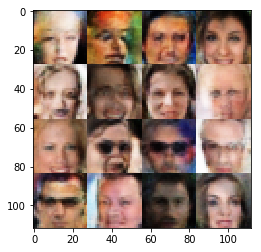

Epoch 3/10... Discriminator Loss: 2.4556... Generator Loss: 4.7221
Epoch 3/10... Discriminator Loss: 0.4718... Generator Loss: 1.8723
Epoch 3/10... Discriminator Loss: 0.6884... Generator Loss: 1.0756
Epoch 3/10... Discriminator Loss: 0.6523... Generator Loss: 1.1036
Epoch 3/10... Discriminator Loss: 0.8098... Generator Loss: 0.8058
Epoch 3/10... Discriminator Loss: 0.7306... Generator Loss: 0.8877
Epoch 3/10... Discriminator Loss: 0.7756... Generator Loss: 0.8516
Epoch 3/10... Discriminator Loss: 0.7275... Generator Loss: 0.8799
Epoch 3/10... Discriminator Loss: 0.5033... Generator Loss: 1.4215
Epoch 3/10... Discriminator Loss: 1.0876... Generator Loss: 0.5696


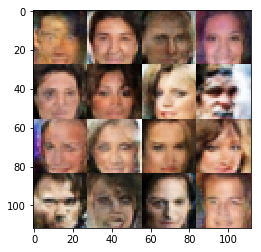

Epoch 3/10... Discriminator Loss: 0.2736... Generator Loss: 3.2264
Epoch 3/10... Discriminator Loss: 0.6915... Generator Loss: 0.9425
Epoch 3/10... Discriminator Loss: 0.5374... Generator Loss: 1.2185
Epoch 3/10... Discriminator Loss: 0.3274... Generator Loss: 1.7698
Epoch 3/10... Discriminator Loss: 0.3894... Generator Loss: 1.8434
Epoch 3/10... Discriminator Loss: 0.2668... Generator Loss: 2.0220
Epoch 3/10... Discriminator Loss: 0.4320... Generator Loss: 1.4938
Epoch 3/10... Discriminator Loss: 0.4480... Generator Loss: 1.3905
Epoch 3/10... Discriminator Loss: 0.6052... Generator Loss: 1.0586
Epoch 3/10... Discriminator Loss: 0.6722... Generator Loss: 1.0038


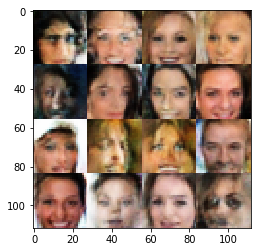

Epoch 3/10... Discriminator Loss: 0.3861... Generator Loss: 3.9918
Epoch 3/10... Discriminator Loss: 2.5980... Generator Loss: 4.7997
Epoch 3/10... Discriminator Loss: 0.5378... Generator Loss: 1.8635
Epoch 3/10... Discriminator Loss: 0.6342... Generator Loss: 1.3662
Epoch 3/10... Discriminator Loss: 0.5195... Generator Loss: 1.4199
Epoch 3/10... Discriminator Loss: 0.4864... Generator Loss: 2.7761
Epoch 3/10... Discriminator Loss: 0.8164... Generator Loss: 1.0403
Epoch 3/10... Discriminator Loss: 0.9964... Generator Loss: 1.7494
Epoch 3/10... Discriminator Loss: 0.7817... Generator Loss: 0.8310
Epoch 3/10... Discriminator Loss: 0.6517... Generator Loss: 1.4716


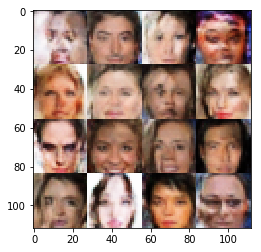

Epoch 3/10... Discriminator Loss: 0.6695... Generator Loss: 0.9951
Epoch 3/10... Discriminator Loss: 0.6064... Generator Loss: 1.0875
Epoch 3/10... Discriminator Loss: 0.2901... Generator Loss: 2.2873
Epoch 3/10... Discriminator Loss: 0.5313... Generator Loss: 1.3333
Epoch 3/10... Discriminator Loss: 0.5127... Generator Loss: 1.5170
Epoch 3/10... Discriminator Loss: 0.3065... Generator Loss: 2.4427
Epoch 3/10... Discriminator Loss: 0.4420... Generator Loss: 1.4980
Epoch 3/10... Discriminator Loss: 0.5853... Generator Loss: 1.1666
Epoch 3/10... Discriminator Loss: 0.3481... Generator Loss: 1.7634
Epoch 3/10... Discriminator Loss: 0.4036... Generator Loss: 1.5844


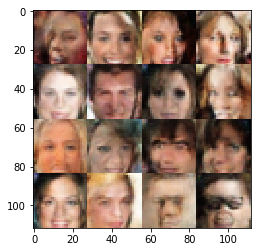

Epoch 3/10... Discriminator Loss: 1.1672... Generator Loss: 0.4924
Epoch 3/10... Discriminator Loss: 0.5558... Generator Loss: 1.2060
Epoch 3/10... Discriminator Loss: 0.2696... Generator Loss: 2.1534
Epoch 3/10... Discriminator Loss: 0.1009... Generator Loss: 4.4404
Epoch 3/10... Discriminator Loss: 0.6863... Generator Loss: 1.0197
Epoch 3/10... Discriminator Loss: 0.5971... Generator Loss: 1.0207
Epoch 3/10... Discriminator Loss: 0.6958... Generator Loss: 1.0811
Epoch 3/10... Discriminator Loss: 0.9499... Generator Loss: 0.6545
Epoch 3/10... Discriminator Loss: 1.8520... Generator Loss: 0.2787
Epoch 3/10... Discriminator Loss: 0.7306... Generator Loss: 1.0067


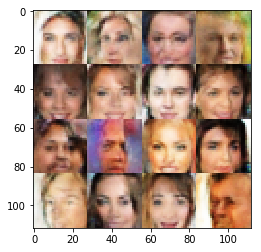

Epoch 3/10... Discriminator Loss: 0.6302... Generator Loss: 3.3523
Epoch 3/10... Discriminator Loss: 1.3854... Generator Loss: 0.4628
Epoch 3/10... Discriminator Loss: 0.7859... Generator Loss: 0.8100
Epoch 3/10... Discriminator Loss: 0.4758... Generator Loss: 1.4535
Epoch 3/10... Discriminator Loss: 0.7206... Generator Loss: 1.0747
Epoch 3/10... Discriminator Loss: 1.5205... Generator Loss: 0.3492
Epoch 3/10... Discriminator Loss: 1.4090... Generator Loss: 0.5101
Epoch 3/10... Discriminator Loss: 0.7811... Generator Loss: 1.0947
Epoch 3/10... Discriminator Loss: 0.7376... Generator Loss: 0.8875
Epoch 3/10... Discriminator Loss: 0.8370... Generator Loss: 1.0085


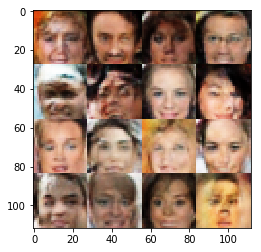

Epoch 3/10... Discriminator Loss: 0.6692... Generator Loss: 1.1875
Epoch 3/10... Discriminator Loss: 0.8376... Generator Loss: 0.7750
Epoch 3/10... Discriminator Loss: 0.9975... Generator Loss: 0.6582
Epoch 3/10... Discriminator Loss: 0.9858... Generator Loss: 0.6428
Epoch 3/10... Discriminator Loss: 0.2660... Generator Loss: 2.6755
Epoch 3/10... Discriminator Loss: 0.6893... Generator Loss: 1.2229
Epoch 3/10... Discriminator Loss: 1.1609... Generator Loss: 0.5286
Epoch 3/10... Discriminator Loss: 0.7619... Generator Loss: 0.8029
Epoch 3/10... Discriminator Loss: 0.8017... Generator Loss: 0.8303
Epoch 3/10... Discriminator Loss: 0.5684... Generator Loss: 1.1859


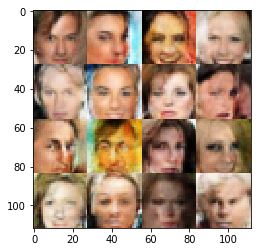

Epoch 3/10... Discriminator Loss: 0.5426... Generator Loss: 5.9975
Epoch 3/10... Discriminator Loss: 0.2724... Generator Loss: 2.1736
Epoch 3/10... Discriminator Loss: 0.6788... Generator Loss: 0.9295
Epoch 3/10... Discriminator Loss: 0.5040... Generator Loss: 1.9380
Epoch 3/10... Discriminator Loss: 0.3257... Generator Loss: 2.8123
Epoch 3/10... Discriminator Loss: 0.5332... Generator Loss: 1.4348
Epoch 3/10... Discriminator Loss: 0.5444... Generator Loss: 1.5855
Epoch 3/10... Discriminator Loss: 0.0809... Generator Loss: 4.3447
Epoch 3/10... Discriminator Loss: 0.3923... Generator Loss: 3.2374
Epoch 3/10... Discriminator Loss: 0.6642... Generator Loss: 1.1443


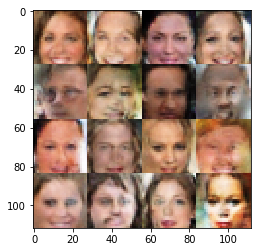

Epoch 3/10... Discriminator Loss: 2.0616... Generator Loss: 0.2106
Epoch 3/10... Discriminator Loss: 0.5783... Generator Loss: 1.1374
Epoch 3/10... Discriminator Loss: 0.4454... Generator Loss: 1.7985
Epoch 3/10... Discriminator Loss: 0.3476... Generator Loss: 1.7900
Epoch 3/10... Discriminator Loss: 0.5311... Generator Loss: 1.2095
Epoch 3/10... Discriminator Loss: 0.4789... Generator Loss: 1.3963
Epoch 3/10... Discriminator Loss: 0.5753... Generator Loss: 1.1041
Epoch 3/10... Discriminator Loss: 0.6734... Generator Loss: 0.9744
Epoch 3/10... Discriminator Loss: 0.6053... Generator Loss: 1.0923
Epoch 3/10... Discriminator Loss: 0.1910... Generator Loss: 3.6219


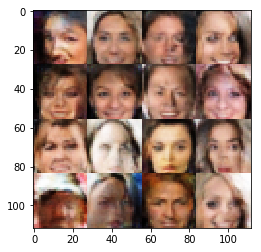

Epoch 3/10... Discriminator Loss: 0.7006... Generator Loss: 0.9345
Epoch 3/10... Discriminator Loss: 0.6189... Generator Loss: 1.0490
Epoch 3/10... Discriminator Loss: 0.4604... Generator Loss: 1.9952
Epoch 3/10... Discriminator Loss: 1.0344... Generator Loss: 3.0196
Epoch 3/10... Discriminator Loss: 0.5053... Generator Loss: 1.3721
Epoch 3/10... Discriminator Loss: 0.6522... Generator Loss: 2.8862
Epoch 3/10... Discriminator Loss: 0.5243... Generator Loss: 2.4724
Epoch 3/10... Discriminator Loss: 0.8442... Generator Loss: 0.7543
Epoch 3/10... Discriminator Loss: 0.3211... Generator Loss: 2.1608
Epoch 3/10... Discriminator Loss: 1.3490... Generator Loss: 0.4454


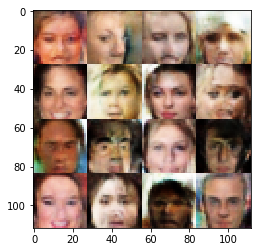

Epoch 3/10... Discriminator Loss: 0.3969... Generator Loss: 1.5331
Epoch 3/10... Discriminator Loss: 0.2018... Generator Loss: 2.6524
Epoch 3/10... Discriminator Loss: 0.2740... Generator Loss: 2.0217
Epoch 3/10... Discriminator Loss: 0.3891... Generator Loss: 1.8495
Epoch 3/10... Discriminator Loss: 1.9438... Generator Loss: 0.2872
Epoch 3/10... Discriminator Loss: 0.8147... Generator Loss: 0.7731
Epoch 3/10... Discriminator Loss: 0.3232... Generator Loss: 1.7784
Epoch 3/10... Discriminator Loss: 1.3242... Generator Loss: 0.4406
Epoch 3/10... Discriminator Loss: 0.4191... Generator Loss: 1.3255
Epoch 3/10... Discriminator Loss: 0.7203... Generator Loss: 1.1845


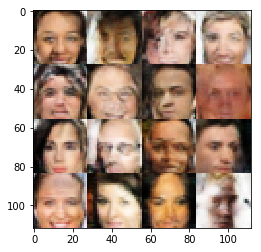

Epoch 3/10... Discriminator Loss: 0.8367... Generator Loss: 0.9300
Epoch 3/10... Discriminator Loss: 0.6580... Generator Loss: 1.1200
Epoch 3/10... Discriminator Loss: 0.9048... Generator Loss: 0.7660
Epoch 3/10... Discriminator Loss: 1.1330... Generator Loss: 2.2977
Epoch 3/10... Discriminator Loss: 1.9765... Generator Loss: 0.3041
Epoch 3/10... Discriminator Loss: 0.8477... Generator Loss: 0.9742
Epoch 3/10... Discriminator Loss: 0.9249... Generator Loss: 0.7336
Epoch 3/10... Discriminator Loss: 0.8078... Generator Loss: 0.9084
Epoch 3/10... Discriminator Loss: 0.8274... Generator Loss: 0.8072
Epoch 3/10... Discriminator Loss: 1.8758... Generator Loss: 0.2352


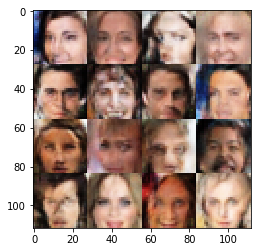

Epoch 3/10... Discriminator Loss: 0.7862... Generator Loss: 1.0815
Epoch 3/10... Discriminator Loss: 0.5514... Generator Loss: 2.4323
Epoch 3/10... Discriminator Loss: 0.9571... Generator Loss: 0.6978
Epoch 3/10... Discriminator Loss: 1.0614... Generator Loss: 0.5583
Epoch 3/10... Discriminator Loss: 0.4883... Generator Loss: 1.3119
Epoch 3/10... Discriminator Loss: 0.7160... Generator Loss: 0.9114
Epoch 3/10... Discriminator Loss: 0.3446... Generator Loss: 1.7078
Epoch 3/10... Discriminator Loss: 0.7164... Generator Loss: 0.9821
Epoch 3/10... Discriminator Loss: 0.5151... Generator Loss: 1.3849
Epoch 3/10... Discriminator Loss: 0.7281... Generator Loss: 0.9294


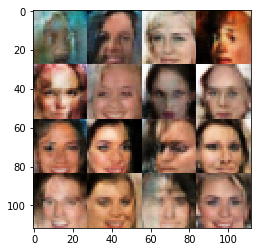

Epoch 3/10... Discriminator Loss: 0.3671... Generator Loss: 1.6396
Epoch 3/10... Discriminator Loss: 0.5166... Generator Loss: 1.2572
Epoch 3/10... Discriminator Loss: 0.4033... Generator Loss: 1.8231
Epoch 3/10... Discriminator Loss: 0.6081... Generator Loss: 3.2064
Epoch 3/10... Discriminator Loss: 0.7900... Generator Loss: 0.8892
Epoch 3/10... Discriminator Loss: 1.1655... Generator Loss: 0.5475
Epoch 3/10... Discriminator Loss: 0.6646... Generator Loss: 3.1126
Epoch 3/10... Discriminator Loss: 0.5049... Generator Loss: 1.3315
Epoch 3/10... Discriminator Loss: 0.5529... Generator Loss: 1.2362
Epoch 3/10... Discriminator Loss: 0.7267... Generator Loss: 0.9281


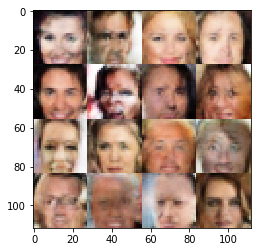

Epoch 3/10... Discriminator Loss: 1.0980... Generator Loss: 0.5221
Epoch 3/10... Discriminator Loss: 1.5530... Generator Loss: 0.3303
Epoch 3/10... Discriminator Loss: 0.3673... Generator Loss: 1.5664
Epoch 3/10... Discriminator Loss: 0.6504... Generator Loss: 0.9832
Epoch 3/10... Discriminator Loss: 0.2913... Generator Loss: 1.8755
Epoch 3/10... Discriminator Loss: 0.9875... Generator Loss: 0.6302
Epoch 3/10... Discriminator Loss: 0.4264... Generator Loss: 1.6222
Epoch 3/10... Discriminator Loss: 0.3651... Generator Loss: 2.0624
Epoch 3/10... Discriminator Loss: 1.3175... Generator Loss: 0.4123
Epoch 3/10... Discriminator Loss: 0.6832... Generator Loss: 1.0083


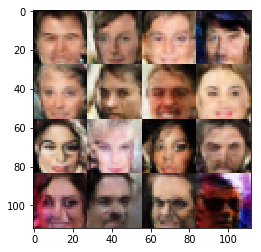

Epoch 3/10... Discriminator Loss: 0.4426... Generator Loss: 1.5197
Epoch 3/10... Discriminator Loss: 0.7302... Generator Loss: 1.0769
Epoch 3/10... Discriminator Loss: 0.4399... Generator Loss: 1.5127
Epoch 3/10... Discriminator Loss: 1.2913... Generator Loss: 4.7292
Epoch 3/10... Discriminator Loss: 1.1284... Generator Loss: 1.7906
Epoch 3/10... Discriminator Loss: 0.9215... Generator Loss: 1.2338
Epoch 3/10... Discriminator Loss: 0.4859... Generator Loss: 2.0123
Epoch 3/10... Discriminator Loss: 0.3824... Generator Loss: 2.5684
Epoch 3/10... Discriminator Loss: 0.4428... Generator Loss: 1.8324
Epoch 3/10... Discriminator Loss: 0.5350... Generator Loss: 1.3986


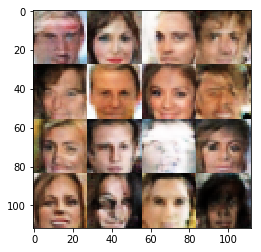

Epoch 3/10... Discriminator Loss: 0.9184... Generator Loss: 2.9809
Epoch 3/10... Discriminator Loss: 0.6754... Generator Loss: 0.9708
Epoch 3/10... Discriminator Loss: 1.1310... Generator Loss: 0.5796
Epoch 3/10... Discriminator Loss: 1.4137... Generator Loss: 0.3873
Epoch 3/10... Discriminator Loss: 0.4081... Generator Loss: 1.5068
Epoch 3/10... Discriminator Loss: 0.5870... Generator Loss: 1.4287
Epoch 3/10... Discriminator Loss: 0.3560... Generator Loss: 1.6999
Epoch 3/10... Discriminator Loss: 0.4617... Generator Loss: 1.5770
Epoch 3/10... Discriminator Loss: 0.3828... Generator Loss: 1.9520
Epoch 3/10... Discriminator Loss: 1.0519... Generator Loss: 0.5776


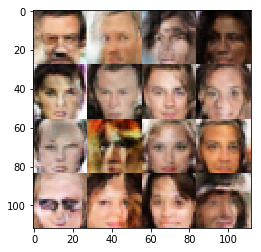

Epoch 3/10... Discriminator Loss: 3.3562... Generator Loss: 6.7870
Epoch 3/10... Discriminator Loss: 0.8258... Generator Loss: 2.2925
Epoch 3/10... Discriminator Loss: 0.6120... Generator Loss: 1.1069
Epoch 3/10... Discriminator Loss: 0.5562... Generator Loss: 1.3709
Epoch 3/10... Discriminator Loss: 0.9278... Generator Loss: 0.7297
Epoch 3/10... Discriminator Loss: 0.6816... Generator Loss: 1.0472
Epoch 3/10... Discriminator Loss: 0.4821... Generator Loss: 1.4208
Epoch 3/10... Discriminator Loss: 0.6612... Generator Loss: 1.0488
Epoch 3/10... Discriminator Loss: 0.5333... Generator Loss: 3.3465
Epoch 3/10... Discriminator Loss: 0.6616... Generator Loss: 0.9686


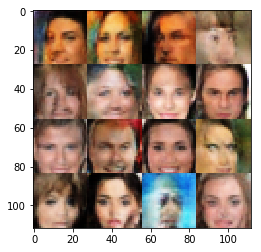

Epoch 3/10... Discriminator Loss: 0.3893... Generator Loss: 1.7777
Epoch 3/10... Discriminator Loss: 0.6070... Generator Loss: 1.1463
Epoch 3/10... Discriminator Loss: 1.0478... Generator Loss: 0.5684
Epoch 3/10... Discriminator Loss: 0.4221... Generator Loss: 1.4180
Epoch 3/10... Discriminator Loss: 0.1903... Generator Loss: 2.6883
Epoch 3/10... Discriminator Loss: 0.5349... Generator Loss: 1.2486
Epoch 3/10... Discriminator Loss: 0.9430... Generator Loss: 0.6590
Epoch 3/10... Discriminator Loss: 0.8192... Generator Loss: 0.8145
Epoch 3/10... Discriminator Loss: 1.4922... Generator Loss: 0.3711
Epoch 4/10... Discriminator Loss: 0.3707... Generator Loss: 1.5782


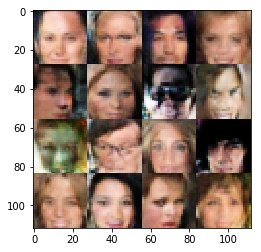

Epoch 4/10... Discriminator Loss: 0.2660... Generator Loss: 2.5454
Epoch 4/10... Discriminator Loss: 0.5633... Generator Loss: 1.2254
Epoch 4/10... Discriminator Loss: 0.5043... Generator Loss: 1.7499
Epoch 4/10... Discriminator Loss: 1.0729... Generator Loss: 0.5759
Epoch 4/10... Discriminator Loss: 0.4679... Generator Loss: 1.4853
Epoch 4/10... Discriminator Loss: 0.5763... Generator Loss: 1.1766
Epoch 4/10... Discriminator Loss: 0.5568... Generator Loss: 1.4483
Epoch 4/10... Discriminator Loss: 0.3141... Generator Loss: 1.8980
Epoch 4/10... Discriminator Loss: 0.4348... Generator Loss: 1.5802
Epoch 4/10... Discriminator Loss: 0.4191... Generator Loss: 1.5443


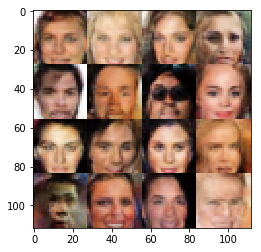

Epoch 4/10... Discriminator Loss: 2.8706... Generator Loss: 0.0982
Epoch 4/10... Discriminator Loss: 0.5040... Generator Loss: 1.2471
Epoch 4/10... Discriminator Loss: 0.5935... Generator Loss: 1.0980
Epoch 4/10... Discriminator Loss: 0.6941... Generator Loss: 0.9451
Epoch 4/10... Discriminator Loss: 0.6190... Generator Loss: 1.1266
Epoch 4/10... Discriminator Loss: 0.0682... Generator Loss: 4.2567
Epoch 4/10... Discriminator Loss: 0.3731... Generator Loss: 1.6162
Epoch 4/10... Discriminator Loss: 0.7495... Generator Loss: 0.9278
Epoch 4/10... Discriminator Loss: 0.2080... Generator Loss: 3.3074
Epoch 4/10... Discriminator Loss: 0.2050... Generator Loss: 2.6493


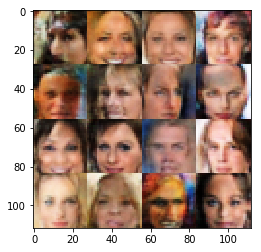

Epoch 4/10... Discriminator Loss: 1.0006... Generator Loss: 0.6818
Epoch 4/10... Discriminator Loss: 1.0195... Generator Loss: 0.6404
Epoch 4/10... Discriminator Loss: 0.6124... Generator Loss: 1.0494
Epoch 4/10... Discriminator Loss: 0.5836... Generator Loss: 1.1317
Epoch 4/10... Discriminator Loss: 0.6961... Generator Loss: 0.9750
Epoch 4/10... Discriminator Loss: 0.9340... Generator Loss: 0.7092
Epoch 4/10... Discriminator Loss: 0.3895... Generator Loss: 2.1498
Epoch 4/10... Discriminator Loss: 1.0521... Generator Loss: 0.6016
Epoch 4/10... Discriminator Loss: 0.5753... Generator Loss: 1.1486
Epoch 4/10... Discriminator Loss: 0.2299... Generator Loss: 2.4174


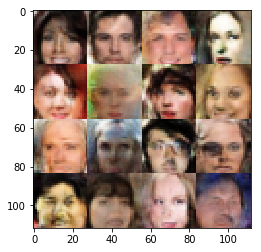

Epoch 4/10... Discriminator Loss: 0.6047... Generator Loss: 1.1542
Epoch 4/10... Discriminator Loss: 0.5123... Generator Loss: 1.2050
Epoch 4/10... Discriminator Loss: 1.8739... Generator Loss: 0.2269
Epoch 4/10... Discriminator Loss: 0.7904... Generator Loss: 0.9982
Epoch 4/10... Discriminator Loss: 0.5594... Generator Loss: 1.2607
Epoch 4/10... Discriminator Loss: 0.5172... Generator Loss: 2.1103
Epoch 4/10... Discriminator Loss: 0.9370... Generator Loss: 0.6248
Epoch 4/10... Discriminator Loss: 0.5795... Generator Loss: 1.2224
Epoch 4/10... Discriminator Loss: 0.3996... Generator Loss: 1.5348
Epoch 4/10... Discriminator Loss: 1.4512... Generator Loss: 0.3763


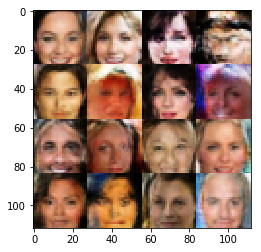

Epoch 4/10... Discriminator Loss: 1.8160... Generator Loss: 0.2753
Epoch 4/10... Discriminator Loss: 0.6453... Generator Loss: 1.3979
Epoch 4/10... Discriminator Loss: 0.5341... Generator Loss: 1.2434
Epoch 4/10... Discriminator Loss: 0.3557... Generator Loss: 1.7769
Epoch 4/10... Discriminator Loss: 1.0552... Generator Loss: 0.6446
Epoch 4/10... Discriminator Loss: 1.5127... Generator Loss: 0.3777
Epoch 4/10... Discriminator Loss: 0.4921... Generator Loss: 1.6518
Epoch 4/10... Discriminator Loss: 0.6888... Generator Loss: 0.9509
Epoch 4/10... Discriminator Loss: 0.5409... Generator Loss: 1.1734
Epoch 4/10... Discriminator Loss: 0.4206... Generator Loss: 1.4864


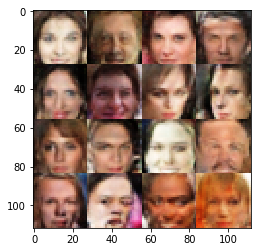

Epoch 4/10... Discriminator Loss: 0.6344... Generator Loss: 1.0435
Epoch 4/10... Discriminator Loss: 0.7551... Generator Loss: 0.8079
Epoch 4/10... Discriminator Loss: 0.3983... Generator Loss: 1.5504
Epoch 4/10... Discriminator Loss: 0.5676... Generator Loss: 1.1676
Epoch 4/10... Discriminator Loss: 0.4491... Generator Loss: 1.7040
Epoch 4/10... Discriminator Loss: 0.4903... Generator Loss: 1.6150
Epoch 4/10... Discriminator Loss: 0.5972... Generator Loss: 1.1089
Epoch 4/10... Discriminator Loss: 0.5997... Generator Loss: 1.1133
Epoch 4/10... Discriminator Loss: 0.4992... Generator Loss: 1.9403
Epoch 4/10... Discriminator Loss: 1.2037... Generator Loss: 0.5516


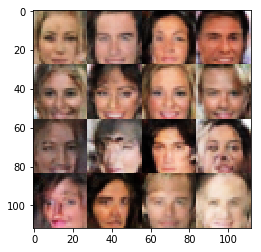

Epoch 4/10... Discriminator Loss: 0.7465... Generator Loss: 0.9487
Epoch 4/10... Discriminator Loss: 0.1050... Generator Loss: 3.9926
Epoch 4/10... Discriminator Loss: 1.0729... Generator Loss: 0.6133
Epoch 4/10... Discriminator Loss: 0.3553... Generator Loss: 1.6857
Epoch 4/10... Discriminator Loss: 0.9370... Generator Loss: 0.6090
Epoch 4/10... Discriminator Loss: 0.5468... Generator Loss: 1.6107
Epoch 4/10... Discriminator Loss: 0.5992... Generator Loss: 1.1060
Epoch 4/10... Discriminator Loss: 0.4667... Generator Loss: 1.6917
Epoch 4/10... Discriminator Loss: 0.8266... Generator Loss: 0.7845
Epoch 4/10... Discriminator Loss: 0.8053... Generator Loss: 0.8665


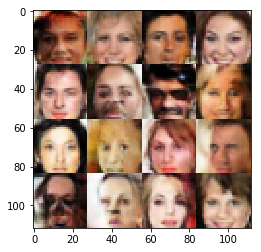

Epoch 4/10... Discriminator Loss: 1.0112... Generator Loss: 0.5909
Epoch 4/10... Discriminator Loss: 1.1503... Generator Loss: 0.5209
Epoch 4/10... Discriminator Loss: 1.0846... Generator Loss: 0.5713
Epoch 4/10... Discriminator Loss: 0.9665... Generator Loss: 3.3488
Epoch 4/10... Discriminator Loss: 0.8102... Generator Loss: 0.9475
Epoch 4/10... Discriminator Loss: 1.3559... Generator Loss: 0.5021
Epoch 4/10... Discriminator Loss: 0.4691... Generator Loss: 1.5911
Epoch 4/10... Discriminator Loss: 1.0034... Generator Loss: 0.6218
Epoch 4/10... Discriminator Loss: 1.4077... Generator Loss: 0.4986
Epoch 4/10... Discriminator Loss: 0.6286... Generator Loss: 1.2125


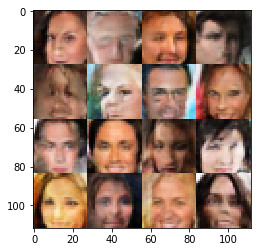

Epoch 4/10... Discriminator Loss: 0.7577... Generator Loss: 1.8883
Epoch 4/10... Discriminator Loss: 0.5651... Generator Loss: 1.2133
Epoch 4/10... Discriminator Loss: 0.4045... Generator Loss: 2.2251
Epoch 4/10... Discriminator Loss: 0.5012... Generator Loss: 1.7168
Epoch 4/10... Discriminator Loss: 1.9394... Generator Loss: 0.2409
Epoch 4/10... Discriminator Loss: 0.7531... Generator Loss: 2.4616
Epoch 4/10... Discriminator Loss: 0.6657... Generator Loss: 1.0902
Epoch 4/10... Discriminator Loss: 0.3509... Generator Loss: 1.9276
Epoch 4/10... Discriminator Loss: 0.4214... Generator Loss: 1.9311
Epoch 4/10... Discriminator Loss: 0.6784... Generator Loss: 0.9787


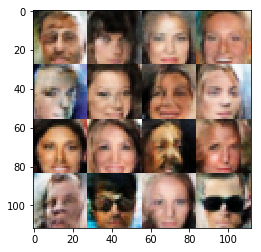

Epoch 4/10... Discriminator Loss: 0.7612... Generator Loss: 0.8494
Epoch 4/10... Discriminator Loss: 0.5178... Generator Loss: 1.2819
Epoch 4/10... Discriminator Loss: 1.7921... Generator Loss: 4.1588
Epoch 4/10... Discriminator Loss: 1.0822... Generator Loss: 0.6896
Epoch 4/10... Discriminator Loss: 1.2550... Generator Loss: 0.4744
Epoch 4/10... Discriminator Loss: 0.4258... Generator Loss: 1.7793
Epoch 4/10... Discriminator Loss: 0.8986... Generator Loss: 0.7221
Epoch 4/10... Discriminator Loss: 1.4440... Generator Loss: 0.3803
Epoch 4/10... Discriminator Loss: 0.8956... Generator Loss: 2.0199
Epoch 4/10... Discriminator Loss: 0.4226... Generator Loss: 1.9630


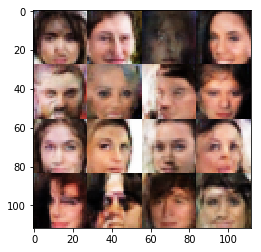

Epoch 4/10... Discriminator Loss: 0.7191... Generator Loss: 0.9716
Epoch 4/10... Discriminator Loss: 0.5074... Generator Loss: 1.3881
Epoch 4/10... Discriminator Loss: 0.4294... Generator Loss: 2.1176
Epoch 4/10... Discriminator Loss: 0.4325... Generator Loss: 1.5273
Epoch 4/10... Discriminator Loss: 1.1959... Generator Loss: 0.5226
Epoch 4/10... Discriminator Loss: 0.2480... Generator Loss: 1.9162
Epoch 4/10... Discriminator Loss: 0.5590... Generator Loss: 1.3241
Epoch 4/10... Discriminator Loss: 0.4595... Generator Loss: 1.4999
Epoch 4/10... Discriminator Loss: 0.2489... Generator Loss: 2.2382
Epoch 4/10... Discriminator Loss: 0.4788... Generator Loss: 1.4136


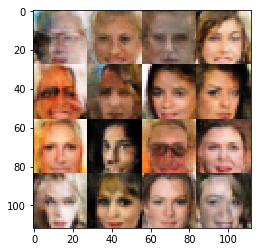

Epoch 4/10... Discriminator Loss: 0.7443... Generator Loss: 0.8284
Epoch 4/10... Discriminator Loss: 0.4913... Generator Loss: 1.4194
Epoch 4/10... Discriminator Loss: 0.4197... Generator Loss: 1.3666
Epoch 4/10... Discriminator Loss: 0.4134... Generator Loss: 1.5000
Epoch 4/10... Discriminator Loss: 0.6604... Generator Loss: 0.9552
Epoch 4/10... Discriminator Loss: 0.9780... Generator Loss: 3.3407
Epoch 4/10... Discriminator Loss: 1.9023... Generator Loss: 0.3140
Epoch 4/10... Discriminator Loss: 2.6398... Generator Loss: 0.1467
Epoch 4/10... Discriminator Loss: 1.3231... Generator Loss: 0.5095
Epoch 4/10... Discriminator Loss: 0.9017... Generator Loss: 0.7348


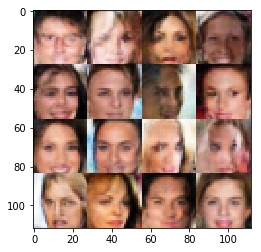

Epoch 4/10... Discriminator Loss: 0.9691... Generator Loss: 0.7380
Epoch 4/10... Discriminator Loss: 0.7318... Generator Loss: 0.9574
Epoch 4/10... Discriminator Loss: 0.6516... Generator Loss: 2.3683
Epoch 4/10... Discriminator Loss: 0.6670... Generator Loss: 0.9791
Epoch 4/10... Discriminator Loss: 0.5921... Generator Loss: 1.1263
Epoch 4/10... Discriminator Loss: 0.6529... Generator Loss: 1.2454
Epoch 4/10... Discriminator Loss: 0.7175... Generator Loss: 0.9342
Epoch 4/10... Discriminator Loss: 0.5447... Generator Loss: 1.2796
Epoch 4/10... Discriminator Loss: 0.7219... Generator Loss: 0.9501
Epoch 4/10... Discriminator Loss: 0.7672... Generator Loss: 0.8910


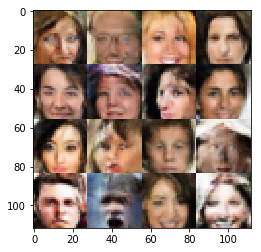

Epoch 4/10... Discriminator Loss: 1.8019... Generator Loss: 0.3106
Epoch 4/10... Discriminator Loss: 0.9302... Generator Loss: 0.7265
Epoch 4/10... Discriminator Loss: 0.8256... Generator Loss: 0.8167
Epoch 4/10... Discriminator Loss: 1.9698... Generator Loss: 0.2699
Epoch 4/10... Discriminator Loss: 0.6113... Generator Loss: 1.1303
Epoch 4/10... Discriminator Loss: 1.2234... Generator Loss: 0.5467
Epoch 4/10... Discriminator Loss: 0.4266... Generator Loss: 1.5515
Epoch 4/10... Discriminator Loss: 1.3337... Generator Loss: 0.4948
Epoch 4/10... Discriminator Loss: 0.2088... Generator Loss: 2.5614
Epoch 4/10... Discriminator Loss: 0.7012... Generator Loss: 1.0120


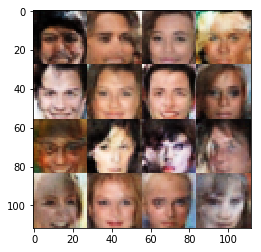

Epoch 4/10... Discriminator Loss: 0.4303... Generator Loss: 2.0295
Epoch 4/10... Discriminator Loss: 0.6481... Generator Loss: 1.3254
Epoch 4/10... Discriminator Loss: 0.5085... Generator Loss: 1.2178
Epoch 4/10... Discriminator Loss: 0.5399... Generator Loss: 2.3169
Epoch 4/10... Discriminator Loss: 0.7990... Generator Loss: 0.9125
Epoch 4/10... Discriminator Loss: 0.8081... Generator Loss: 0.8167
Epoch 4/10... Discriminator Loss: 0.2034... Generator Loss: 2.4868
Epoch 4/10... Discriminator Loss: 1.5376... Generator Loss: 0.3559
Epoch 4/10... Discriminator Loss: 0.4638... Generator Loss: 2.2260
Epoch 4/10... Discriminator Loss: 0.5007... Generator Loss: 1.4996


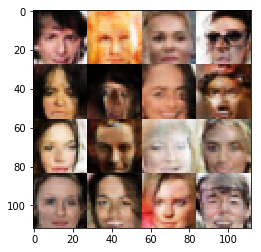

Epoch 4/10... Discriminator Loss: 0.2798... Generator Loss: 2.0687
Epoch 4/10... Discriminator Loss: 2.5232... Generator Loss: 0.1757
Epoch 4/10... Discriminator Loss: 0.6355... Generator Loss: 1.3174
Epoch 4/10... Discriminator Loss: 0.6816... Generator Loss: 1.0342
Epoch 4/10... Discriminator Loss: 0.8399... Generator Loss: 0.7739
Epoch 4/10... Discriminator Loss: 0.8884... Generator Loss: 0.7850
Epoch 4/10... Discriminator Loss: 1.6689... Generator Loss: 0.3187
Epoch 4/10... Discriminator Loss: 0.5076... Generator Loss: 1.3235
Epoch 4/10... Discriminator Loss: 1.1447... Generator Loss: 0.5502
Epoch 4/10... Discriminator Loss: 0.3240... Generator Loss: 1.9268


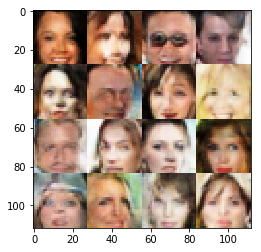

Epoch 4/10... Discriminator Loss: 0.7749... Generator Loss: 0.9081
Epoch 4/10... Discriminator Loss: 0.5451... Generator Loss: 1.9290
Epoch 4/10... Discriminator Loss: 1.8430... Generator Loss: 0.2690
Epoch 4/10... Discriminator Loss: 1.1117... Generator Loss: 0.6227
Epoch 4/10... Discriminator Loss: 0.5186... Generator Loss: 2.1771
Epoch 4/10... Discriminator Loss: 0.5581... Generator Loss: 1.1585
Epoch 4/10... Discriminator Loss: 0.5543... Generator Loss: 1.1961
Epoch 4/10... Discriminator Loss: 0.5299... Generator Loss: 1.2021
Epoch 4/10... Discriminator Loss: 0.9172... Generator Loss: 0.7719
Epoch 4/10... Discriminator Loss: 0.7237... Generator Loss: 1.8885


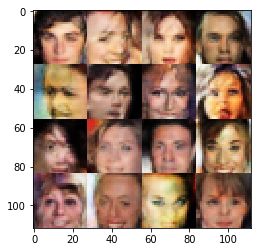

Epoch 4/10... Discriminator Loss: 0.2807... Generator Loss: 2.2007
Epoch 4/10... Discriminator Loss: 0.5752... Generator Loss: 1.1338
Epoch 4/10... Discriminator Loss: 1.0919... Generator Loss: 0.5606
Epoch 4/10... Discriminator Loss: 0.1597... Generator Loss: 2.9767
Epoch 4/10... Discriminator Loss: 0.4774... Generator Loss: 1.4464
Epoch 4/10... Discriminator Loss: 0.3721... Generator Loss: 2.2605
Epoch 4/10... Discriminator Loss: 0.5008... Generator Loss: 1.1872
Epoch 4/10... Discriminator Loss: 0.1305... Generator Loss: 5.2172
Epoch 4/10... Discriminator Loss: 0.8156... Generator Loss: 0.7663
Epoch 4/10... Discriminator Loss: 0.6283... Generator Loss: 1.0984


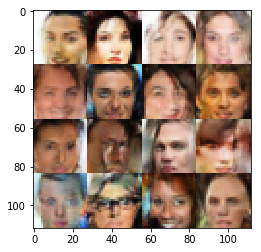

Epoch 4/10... Discriminator Loss: 0.3210... Generator Loss: 1.8135
Epoch 4/10... Discriminator Loss: 1.8686... Generator Loss: 0.2449
Epoch 4/10... Discriminator Loss: 1.0752... Generator Loss: 0.6214
Epoch 4/10... Discriminator Loss: 0.5750... Generator Loss: 1.2848
Epoch 4/10... Discriminator Loss: 1.7208... Generator Loss: 0.2914
Epoch 4/10... Discriminator Loss: 0.5720... Generator Loss: 2.3066
Epoch 4/10... Discriminator Loss: 0.6057... Generator Loss: 2.1546
Epoch 4/10... Discriminator Loss: 0.4179... Generator Loss: 1.7059
Epoch 4/10... Discriminator Loss: 0.7315... Generator Loss: 0.9448
Epoch 4/10... Discriminator Loss: 0.5261... Generator Loss: 1.5992


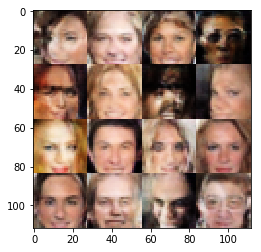

Epoch 4/10... Discriminator Loss: 0.7244... Generator Loss: 1.0099
Epoch 4/10... Discriminator Loss: 2.1430... Generator Loss: 0.2152
Epoch 4/10... Discriminator Loss: 0.6936... Generator Loss: 3.0421
Epoch 4/10... Discriminator Loss: 1.0844... Generator Loss: 0.5943
Epoch 4/10... Discriminator Loss: 1.1501... Generator Loss: 0.6393
Epoch 4/10... Discriminator Loss: 0.3604... Generator Loss: 2.2995
Epoch 4/10... Discriminator Loss: 0.4941... Generator Loss: 1.2688
Epoch 4/10... Discriminator Loss: 1.1584... Generator Loss: 0.5259
Epoch 4/10... Discriminator Loss: 0.2050... Generator Loss: 2.5372
Epoch 4/10... Discriminator Loss: 0.8075... Generator Loss: 0.8446


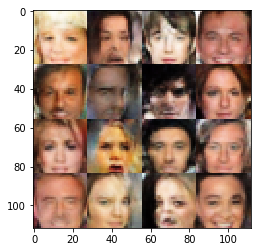

Epoch 4/10... Discriminator Loss: 0.7606... Generator Loss: 0.8752
Epoch 4/10... Discriminator Loss: 0.1994... Generator Loss: 2.2339
Epoch 4/10... Discriminator Loss: 0.2369... Generator Loss: 2.1575
Epoch 4/10... Discriminator Loss: 0.5504... Generator Loss: 1.2058
Epoch 4/10... Discriminator Loss: 0.3914... Generator Loss: 1.5793
Epoch 4/10... Discriminator Loss: 0.4966... Generator Loss: 1.3162
Epoch 4/10... Discriminator Loss: 0.5536... Generator Loss: 1.3524
Epoch 4/10... Discriminator Loss: 0.4122... Generator Loss: 1.8343
Epoch 4/10... Discriminator Loss: 1.1755... Generator Loss: 0.5533
Epoch 4/10... Discriminator Loss: 0.7989... Generator Loss: 0.8807


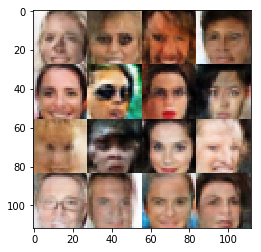

Epoch 4/10... Discriminator Loss: 0.4687... Generator Loss: 1.6545
Epoch 4/10... Discriminator Loss: 0.4151... Generator Loss: 1.8144
Epoch 4/10... Discriminator Loss: 1.2924... Generator Loss: 0.4947
Epoch 4/10... Discriminator Loss: 0.4807... Generator Loss: 1.5400
Epoch 4/10... Discriminator Loss: 0.6647... Generator Loss: 1.0575
Epoch 4/10... Discriminator Loss: 0.3555... Generator Loss: 1.6445
Epoch 4/10... Discriminator Loss: 0.5476... Generator Loss: 1.2503
Epoch 4/10... Discriminator Loss: 0.5919... Generator Loss: 1.1362
Epoch 4/10... Discriminator Loss: 0.7348... Generator Loss: 0.8584
Epoch 4/10... Discriminator Loss: 0.2362... Generator Loss: 2.6000


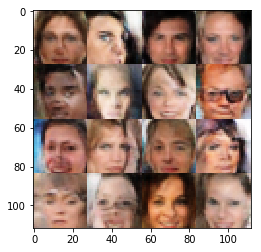

Epoch 4/10... Discriminator Loss: 0.8265... Generator Loss: 0.9067
Epoch 4/10... Discriminator Loss: 0.3786... Generator Loss: 1.6628
Epoch 4/10... Discriminator Loss: 0.6096... Generator Loss: 1.3021
Epoch 4/10... Discriminator Loss: 0.6448... Generator Loss: 1.6181
Epoch 4/10... Discriminator Loss: 0.8897... Generator Loss: 0.7506
Epoch 4/10... Discriminator Loss: 0.4445... Generator Loss: 1.4486
Epoch 4/10... Discriminator Loss: 0.4499... Generator Loss: 1.3706
Epoch 4/10... Discriminator Loss: 0.1589... Generator Loss: 3.1820
Epoch 4/10... Discriminator Loss: 0.9654... Generator Loss: 0.7440
Epoch 4/10... Discriminator Loss: 0.5248... Generator Loss: 2.8211


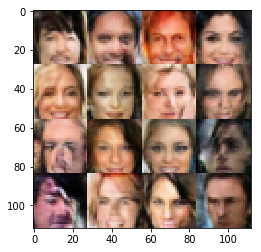

Epoch 4/10... Discriminator Loss: 2.9741... Generator Loss: 5.8781
Epoch 4/10... Discriminator Loss: 1.2409... Generator Loss: 0.5739
Epoch 4/10... Discriminator Loss: 0.5353... Generator Loss: 1.5168
Epoch 4/10... Discriminator Loss: 0.5275... Generator Loss: 1.3667
Epoch 4/10... Discriminator Loss: 0.4664... Generator Loss: 2.4185
Epoch 4/10... Discriminator Loss: 0.9828... Generator Loss: 0.6846
Epoch 4/10... Discriminator Loss: 0.4828... Generator Loss: 2.1357
Epoch 4/10... Discriminator Loss: 0.3882... Generator Loss: 1.7864
Epoch 4/10... Discriminator Loss: 0.4743... Generator Loss: 2.1376
Epoch 4/10... Discriminator Loss: 0.3923... Generator Loss: 1.6083


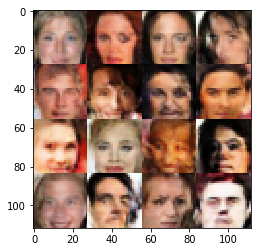

Epoch 4/10... Discriminator Loss: 0.3970... Generator Loss: 2.1844
Epoch 4/10... Discriminator Loss: 1.0196... Generator Loss: 0.7032
Epoch 4/10... Discriminator Loss: 2.1224... Generator Loss: 4.7566
Epoch 4/10... Discriminator Loss: 0.7907... Generator Loss: 0.8020
Epoch 4/10... Discriminator Loss: 1.0438... Generator Loss: 3.2518
Epoch 4/10... Discriminator Loss: 0.9538... Generator Loss: 0.6945
Epoch 4/10... Discriminator Loss: 0.8622... Generator Loss: 0.7403
Epoch 4/10... Discriminator Loss: 1.4039... Generator Loss: 0.4477
Epoch 4/10... Discriminator Loss: 0.8954... Generator Loss: 3.7782
Epoch 4/10... Discriminator Loss: 0.4320... Generator Loss: 2.2736


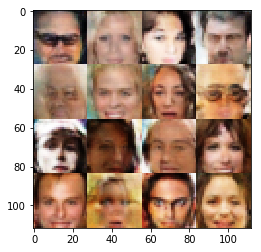

Epoch 4/10... Discriminator Loss: 1.1142... Generator Loss: 0.5561
Epoch 4/10... Discriminator Loss: 1.1008... Generator Loss: 0.5867
Epoch 4/10... Discriminator Loss: 0.3330... Generator Loss: 1.9503
Epoch 4/10... Discriminator Loss: 0.6018... Generator Loss: 1.0508
Epoch 4/10... Discriminator Loss: 0.7273... Generator Loss: 0.9269
Epoch 4/10... Discriminator Loss: 0.9416... Generator Loss: 0.7230
Epoch 4/10... Discriminator Loss: 1.0269... Generator Loss: 0.6700
Epoch 4/10... Discriminator Loss: 0.8898... Generator Loss: 0.7284
Epoch 4/10... Discriminator Loss: 0.8127... Generator Loss: 0.8980
Epoch 4/10... Discriminator Loss: 0.3120... Generator Loss: 2.1171


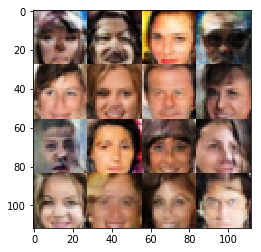

Epoch 4/10... Discriminator Loss: 0.7133... Generator Loss: 0.9570
Epoch 4/10... Discriminator Loss: 1.4680... Generator Loss: 0.3916
Epoch 4/10... Discriminator Loss: 0.4562... Generator Loss: 2.3859
Epoch 4/10... Discriminator Loss: 0.7398... Generator Loss: 0.9207
Epoch 4/10... Discriminator Loss: 0.9274... Generator Loss: 2.5024
Epoch 4/10... Discriminator Loss: 0.5994... Generator Loss: 1.1627
Epoch 4/10... Discriminator Loss: 1.6674... Generator Loss: 0.3353
Epoch 4/10... Discriminator Loss: 0.5679... Generator Loss: 2.9818
Epoch 4/10... Discriminator Loss: 0.4491... Generator Loss: 1.5681
Epoch 4/10... Discriminator Loss: 0.5033... Generator Loss: 1.2839


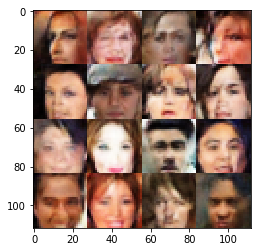

Epoch 4/10... Discriminator Loss: 0.4570... Generator Loss: 1.6629
Epoch 4/10... Discriminator Loss: 0.2037... Generator Loss: 2.3066
Epoch 4/10... Discriminator Loss: 0.8795... Generator Loss: 0.8112
Epoch 4/10... Discriminator Loss: 0.4027... Generator Loss: 1.5763
Epoch 4/10... Discriminator Loss: 0.7247... Generator Loss: 0.8423
Epoch 4/10... Discriminator Loss: 0.5341... Generator Loss: 1.8188
Epoch 4/10... Discriminator Loss: 0.7375... Generator Loss: 1.9503
Epoch 4/10... Discriminator Loss: 0.6090... Generator Loss: 1.9173
Epoch 4/10... Discriminator Loss: 0.9079... Generator Loss: 0.7208
Epoch 4/10... Discriminator Loss: 0.6335... Generator Loss: 1.0381


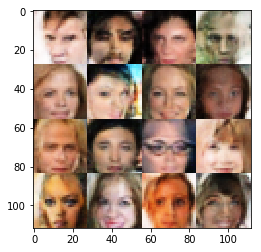

Epoch 4/10... Discriminator Loss: 0.6307... Generator Loss: 0.9591
Epoch 4/10... Discriminator Loss: 0.2025... Generator Loss: 3.2145
Epoch 4/10... Discriminator Loss: 0.5084... Generator Loss: 1.4320
Epoch 4/10... Discriminator Loss: 0.6580... Generator Loss: 0.9513
Epoch 4/10... Discriminator Loss: 0.8357... Generator Loss: 0.7502
Epoch 4/10... Discriminator Loss: 0.3045... Generator Loss: 1.8321
Epoch 4/10... Discriminator Loss: 1.3177... Generator Loss: 0.4256
Epoch 4/10... Discriminator Loss: 0.5541... Generator Loss: 1.2812
Epoch 4/10... Discriminator Loss: 0.2829... Generator Loss: 2.2179
Epoch 4/10... Discriminator Loss: 0.6184... Generator Loss: 1.2257


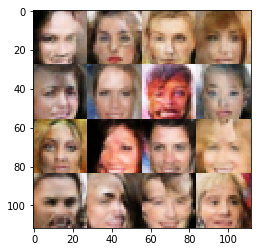

Epoch 4/10... Discriminator Loss: 0.4482... Generator Loss: 1.6108
Epoch 4/10... Discriminator Loss: 0.6455... Generator Loss: 1.3566
Epoch 4/10... Discriminator Loss: 0.4727... Generator Loss: 2.8040
Epoch 4/10... Discriminator Loss: 0.6261... Generator Loss: 3.3974
Epoch 4/10... Discriminator Loss: 1.3111... Generator Loss: 0.4189
Epoch 4/10... Discriminator Loss: 0.5969... Generator Loss: 1.1922
Epoch 4/10... Discriminator Loss: 0.8180... Generator Loss: 0.8227
Epoch 4/10... Discriminator Loss: 0.1787... Generator Loss: 3.9919
Epoch 4/10... Discriminator Loss: 0.4183... Generator Loss: 2.0869
Epoch 4/10... Discriminator Loss: 1.0188... Generator Loss: 0.6297


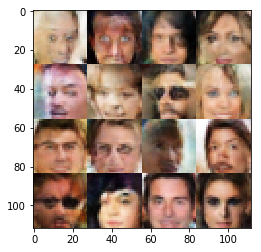

Epoch 4/10... Discriminator Loss: 0.5481... Generator Loss: 1.2368
Epoch 4/10... Discriminator Loss: 0.3670... Generator Loss: 2.2158
Epoch 4/10... Discriminator Loss: 0.4755... Generator Loss: 1.3571
Epoch 4/10... Discriminator Loss: 5.4241... Generator Loss: 7.8370
Epoch 4/10... Discriminator Loss: 1.5396... Generator Loss: 0.3664
Epoch 4/10... Discriminator Loss: 0.4772... Generator Loss: 1.5740
Epoch 4/10... Discriminator Loss: 0.7804... Generator Loss: 0.9062
Epoch 4/10... Discriminator Loss: 0.7081... Generator Loss: 1.3091
Epoch 4/10... Discriminator Loss: 0.5090... Generator Loss: 1.3670
Epoch 4/10... Discriminator Loss: 0.4417... Generator Loss: 1.4492


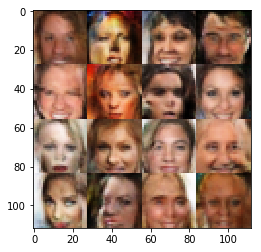

Epoch 4/10... Discriminator Loss: 0.4912... Generator Loss: 1.4792
Epoch 4/10... Discriminator Loss: 0.4289... Generator Loss: 1.6269
Epoch 4/10... Discriminator Loss: 0.5453... Generator Loss: 1.2261
Epoch 4/10... Discriminator Loss: 0.4038... Generator Loss: 1.6580
Epoch 4/10... Discriminator Loss: 0.2252... Generator Loss: 2.4920
Epoch 4/10... Discriminator Loss: 0.2929... Generator Loss: 2.1046
Epoch 5/10... Discriminator Loss: 1.2146... Generator Loss: 0.4445
Epoch 5/10... Discriminator Loss: 0.6560... Generator Loss: 1.0407
Epoch 5/10... Discriminator Loss: 0.6681... Generator Loss: 1.0495
Epoch 5/10... Discriminator Loss: 0.6917... Generator Loss: 1.0051


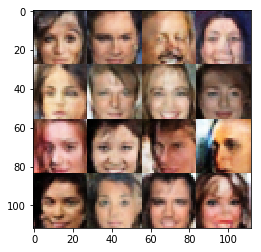

Epoch 5/10... Discriminator Loss: 0.3489... Generator Loss: 1.8343
Epoch 5/10... Discriminator Loss: 0.6130... Generator Loss: 2.5124
Epoch 5/10... Discriminator Loss: 0.7807... Generator Loss: 0.9061
Epoch 5/10... Discriminator Loss: 1.0509... Generator Loss: 0.5983
Epoch 5/10... Discriminator Loss: 0.3774... Generator Loss: 3.1325
Epoch 5/10... Discriminator Loss: 2.0775... Generator Loss: 0.2333
Epoch 5/10... Discriminator Loss: 1.4601... Generator Loss: 0.4429
Epoch 5/10... Discriminator Loss: 0.4279... Generator Loss: 1.6220
Epoch 5/10... Discriminator Loss: 0.5209... Generator Loss: 1.3066
Epoch 5/10... Discriminator Loss: 0.5384... Generator Loss: 1.8597


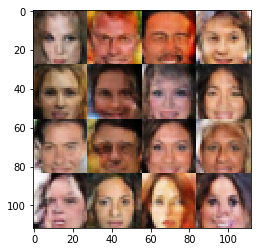

Epoch 5/10... Discriminator Loss: 0.8543... Generator Loss: 0.7089
Epoch 5/10... Discriminator Loss: 1.3486... Generator Loss: 0.5919
Epoch 5/10... Discriminator Loss: 0.5470... Generator Loss: 2.9897
Epoch 5/10... Discriminator Loss: 0.4557... Generator Loss: 2.3608
Epoch 5/10... Discriminator Loss: 0.5740... Generator Loss: 1.2783
Epoch 5/10... Discriminator Loss: 0.4295... Generator Loss: 1.7720
Epoch 5/10... Discriminator Loss: 0.6723... Generator Loss: 1.0705
Epoch 5/10... Discriminator Loss: 0.4170... Generator Loss: 1.8701
Epoch 5/10... Discriminator Loss: 0.6777... Generator Loss: 1.2456
Epoch 5/10... Discriminator Loss: 0.7081... Generator Loss: 0.9635


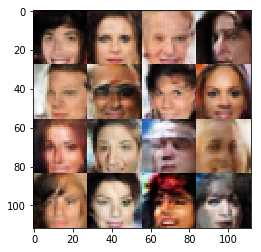

Epoch 5/10... Discriminator Loss: 0.7747... Generator Loss: 0.8042
Epoch 5/10... Discriminator Loss: 0.5448... Generator Loss: 1.1200
Epoch 5/10... Discriminator Loss: 0.9384... Generator Loss: 0.7494
Epoch 5/10... Discriminator Loss: 1.7234... Generator Loss: 0.3678
Epoch 5/10... Discriminator Loss: 0.7987... Generator Loss: 0.8983
Epoch 5/10... Discriminator Loss: 0.7105... Generator Loss: 1.8004
Epoch 5/10... Discriminator Loss: 0.5241... Generator Loss: 3.2444
Epoch 5/10... Discriminator Loss: 1.3356... Generator Loss: 0.4744
Epoch 5/10... Discriminator Loss: 0.4463... Generator Loss: 1.8128
Epoch 5/10... Discriminator Loss: 0.5717... Generator Loss: 1.2286


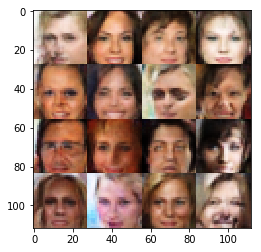

Epoch 5/10... Discriminator Loss: 0.4622... Generator Loss: 1.4831
Epoch 5/10... Discriminator Loss: 1.5040... Generator Loss: 0.4026
Epoch 5/10... Discriminator Loss: 0.1391... Generator Loss: 3.2793
Epoch 5/10... Discriminator Loss: 0.9067... Generator Loss: 0.6817
Epoch 5/10... Discriminator Loss: 0.3994... Generator Loss: 1.4963
Epoch 5/10... Discriminator Loss: 0.2865... Generator Loss: 1.9685
Epoch 5/10... Discriminator Loss: 0.7197... Generator Loss: 1.0164
Epoch 5/10... Discriminator Loss: 0.3003... Generator Loss: 2.6268
Epoch 5/10... Discriminator Loss: 0.5319... Generator Loss: 1.3409
Epoch 5/10... Discriminator Loss: 0.9384... Generator Loss: 0.6758


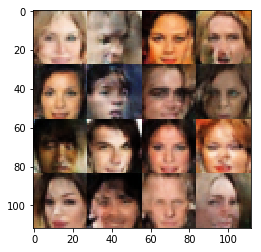

Epoch 5/10... Discriminator Loss: 0.6940... Generator Loss: 1.0115
Epoch 5/10... Discriminator Loss: 0.2900... Generator Loss: 1.9891
Epoch 5/10... Discriminator Loss: 0.3762... Generator Loss: 2.5470
Epoch 5/10... Discriminator Loss: 0.6268... Generator Loss: 1.0998
Epoch 5/10... Discriminator Loss: 0.3037... Generator Loss: 2.6678
Epoch 5/10... Discriminator Loss: 0.5896... Generator Loss: 1.2757
Epoch 5/10... Discriminator Loss: 1.3070... Generator Loss: 0.4781
Epoch 5/10... Discriminator Loss: 0.6436... Generator Loss: 3.0985
Epoch 5/10... Discriminator Loss: 0.9924... Generator Loss: 0.7012
Epoch 5/10... Discriminator Loss: 1.6086... Generator Loss: 0.3155


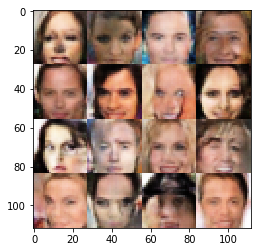

Epoch 5/10... Discriminator Loss: 0.5535... Generator Loss: 2.2553
Epoch 5/10... Discriminator Loss: 0.2529... Generator Loss: 2.4041
Epoch 5/10... Discriminator Loss: 1.4705... Generator Loss: 0.3889
Epoch 5/10... Discriminator Loss: 0.4728... Generator Loss: 1.4285
Epoch 5/10... Discriminator Loss: 1.0276... Generator Loss: 0.6027
Epoch 5/10... Discriminator Loss: 0.6801... Generator Loss: 2.4017
Epoch 5/10... Discriminator Loss: 0.3288... Generator Loss: 2.0501
Epoch 5/10... Discriminator Loss: 0.9048... Generator Loss: 3.0820
Epoch 5/10... Discriminator Loss: 0.5735... Generator Loss: 1.1585
Epoch 5/10... Discriminator Loss: 1.1373... Generator Loss: 0.5364


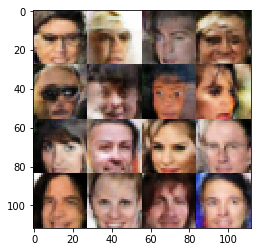

Epoch 5/10... Discriminator Loss: 1.5798... Generator Loss: 0.3251
Epoch 5/10... Discriminator Loss: 0.3582... Generator Loss: 1.7252
Epoch 5/10... Discriminator Loss: 1.7590... Generator Loss: 0.2878
Epoch 5/10... Discriminator Loss: 0.5506... Generator Loss: 2.5444
Epoch 5/10... Discriminator Loss: 0.7662... Generator Loss: 0.8824
Epoch 5/10... Discriminator Loss: 0.6440... Generator Loss: 1.1234
Epoch 5/10... Discriminator Loss: 0.6533... Generator Loss: 1.0827
Epoch 5/10... Discriminator Loss: 0.3617... Generator Loss: 2.0196
Epoch 5/10... Discriminator Loss: 0.5754... Generator Loss: 1.1088
Epoch 5/10... Discriminator Loss: 0.7739... Generator Loss: 0.8908


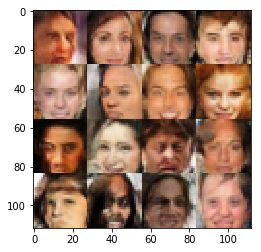

Epoch 5/10... Discriminator Loss: 1.4717... Generator Loss: 0.3893
Epoch 5/10... Discriminator Loss: 0.6136... Generator Loss: 1.1133
Epoch 5/10... Discriminator Loss: 0.4658... Generator Loss: 1.7942
Epoch 5/10... Discriminator Loss: 0.6064... Generator Loss: 1.0836
Epoch 5/10... Discriminator Loss: 0.3629... Generator Loss: 1.6069
Epoch 5/10... Discriminator Loss: 1.3064... Generator Loss: 0.4859
Epoch 5/10... Discriminator Loss: 0.6817... Generator Loss: 1.1532
Epoch 5/10... Discriminator Loss: 0.5087... Generator Loss: 1.3650
Epoch 5/10... Discriminator Loss: 1.0549... Generator Loss: 0.5583
Epoch 5/10... Discriminator Loss: 0.4887... Generator Loss: 1.3372


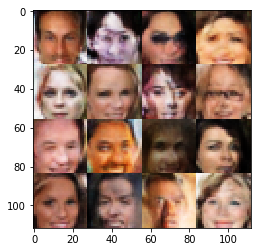

Epoch 5/10... Discriminator Loss: 1.3653... Generator Loss: 0.4703
Epoch 5/10... Discriminator Loss: 0.6402... Generator Loss: 1.1135
Epoch 5/10... Discriminator Loss: 2.5263... Generator Loss: 0.1672
Epoch 5/10... Discriminator Loss: 0.4975... Generator Loss: 1.4987
Epoch 5/10... Discriminator Loss: 1.7427... Generator Loss: 0.3236
Epoch 5/10... Discriminator Loss: 0.9014... Generator Loss: 0.7088
Epoch 5/10... Discriminator Loss: 0.6622... Generator Loss: 1.0194
Epoch 5/10... Discriminator Loss: 0.3921... Generator Loss: 2.4772
Epoch 5/10... Discriminator Loss: 0.3564... Generator Loss: 2.4927
Epoch 5/10... Discriminator Loss: 0.8279... Generator Loss: 0.7933


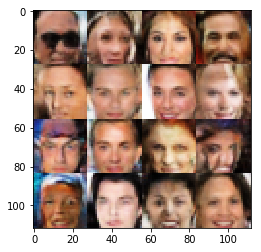

Epoch 5/10... Discriminator Loss: 0.6697... Generator Loss: 1.0666
Epoch 5/10... Discriminator Loss: 0.5048... Generator Loss: 1.2897
Epoch 5/10... Discriminator Loss: 0.4285... Generator Loss: 1.3557
Epoch 5/10... Discriminator Loss: 0.1822... Generator Loss: 2.9480
Epoch 5/10... Discriminator Loss: 0.7592... Generator Loss: 0.8653
Epoch 5/10... Discriminator Loss: 0.3399... Generator Loss: 2.7170
Epoch 5/10... Discriminator Loss: 0.9796... Generator Loss: 0.6880
Epoch 5/10... Discriminator Loss: 0.4535... Generator Loss: 1.3831
Epoch 5/10... Discriminator Loss: 0.3759... Generator Loss: 1.5786
Epoch 5/10... Discriminator Loss: 0.2465... Generator Loss: 2.1597


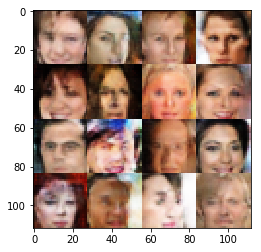

Epoch 5/10... Discriminator Loss: 0.3808... Generator Loss: 2.1418
Epoch 5/10... Discriminator Loss: 0.7053... Generator Loss: 0.9621
Epoch 5/10... Discriminator Loss: 4.4427... Generator Loss: 6.4001
Epoch 5/10... Discriminator Loss: 1.3744... Generator Loss: 0.4305
Epoch 5/10... Discriminator Loss: 0.1674... Generator Loss: 3.1097
Epoch 5/10... Discriminator Loss: 0.5662... Generator Loss: 1.2067
Epoch 5/10... Discriminator Loss: 1.2005... Generator Loss: 0.5124
Epoch 5/10... Discriminator Loss: 0.3189... Generator Loss: 1.9623
Epoch 5/10... Discriminator Loss: 0.4891... Generator Loss: 1.4595
Epoch 5/10... Discriminator Loss: 1.7944... Generator Loss: 0.2884


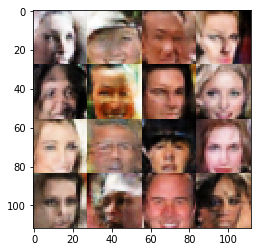

Epoch 5/10... Discriminator Loss: 0.9461... Generator Loss: 3.2750
Epoch 5/10... Discriminator Loss: 0.7408... Generator Loss: 0.9150
Epoch 5/10... Discriminator Loss: 0.7215... Generator Loss: 0.8803
Epoch 5/10... Discriminator Loss: 0.5776... Generator Loss: 1.1686
Epoch 5/10... Discriminator Loss: 0.5535... Generator Loss: 1.2497
Epoch 5/10... Discriminator Loss: 0.5062... Generator Loss: 1.3685
Epoch 5/10... Discriminator Loss: 0.8917... Generator Loss: 0.9233
Epoch 5/10... Discriminator Loss: 0.4796... Generator Loss: 2.5123
Epoch 5/10... Discriminator Loss: 1.0244... Generator Loss: 0.7127
Epoch 5/10... Discriminator Loss: 0.3329... Generator Loss: 1.8546


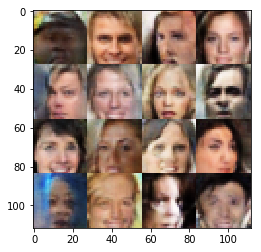

Epoch 5/10... Discriminator Loss: 1.3616... Generator Loss: 0.4316
Epoch 5/10... Discriminator Loss: 1.0276... Generator Loss: 0.6580
Epoch 5/10... Discriminator Loss: 0.9728... Generator Loss: 0.7313
Epoch 5/10... Discriminator Loss: 0.4264... Generator Loss: 1.4686
Epoch 5/10... Discriminator Loss: 0.3431... Generator Loss: 1.9505
Epoch 5/10... Discriminator Loss: 0.6284... Generator Loss: 1.0700
Epoch 5/10... Discriminator Loss: 1.0963... Generator Loss: 0.6697
Epoch 5/10... Discriminator Loss: 0.3711... Generator Loss: 1.9798
Epoch 5/10... Discriminator Loss: 1.2236... Generator Loss: 0.5309
Epoch 5/10... Discriminator Loss: 0.7010... Generator Loss: 2.7049


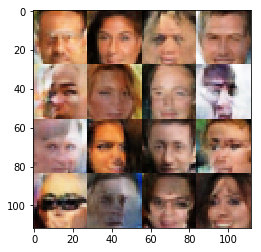

Epoch 5/10... Discriminator Loss: 0.5732... Generator Loss: 1.1353
Epoch 5/10... Discriminator Loss: 0.7942... Generator Loss: 0.8882
Epoch 5/10... Discriminator Loss: 1.3409... Generator Loss: 0.4442
Epoch 5/10... Discriminator Loss: 0.1481... Generator Loss: 2.7171
Epoch 5/10... Discriminator Loss: 0.4155... Generator Loss: 1.4717
Epoch 5/10... Discriminator Loss: 0.6610... Generator Loss: 1.0801
Epoch 5/10... Discriminator Loss: 0.4959... Generator Loss: 1.3926
Epoch 5/10... Discriminator Loss: 0.5769... Generator Loss: 1.2048
Epoch 5/10... Discriminator Loss: 0.7973... Generator Loss: 0.9404
Epoch 5/10... Discriminator Loss: 0.9614... Generator Loss: 0.7950


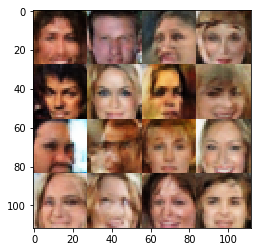

Epoch 5/10... Discriminator Loss: 0.6634... Generator Loss: 0.9936
Epoch 5/10... Discriminator Loss: 1.9787... Generator Loss: 4.8589
Epoch 5/10... Discriminator Loss: 0.6841... Generator Loss: 2.5494
Epoch 5/10... Discriminator Loss: 0.4741... Generator Loss: 1.7609
Epoch 5/10... Discriminator Loss: 1.9060... Generator Loss: 0.2246
Epoch 5/10... Discriminator Loss: 0.4504... Generator Loss: 2.5748
Epoch 5/10... Discriminator Loss: 0.6321... Generator Loss: 1.1473
Epoch 5/10... Discriminator Loss: 0.8461... Generator Loss: 0.8191
Epoch 5/10... Discriminator Loss: 0.5621... Generator Loss: 1.3034
Epoch 5/10... Discriminator Loss: 0.5878... Generator Loss: 1.3081


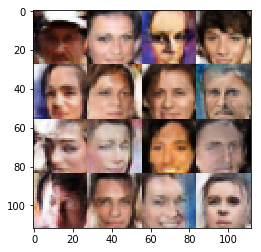

Epoch 5/10... Discriminator Loss: 1.1765... Generator Loss: 0.5188
Epoch 5/10... Discriminator Loss: 0.4548... Generator Loss: 1.4242
Epoch 5/10... Discriminator Loss: 0.6905... Generator Loss: 3.0427
Epoch 5/10... Discriminator Loss: 1.0973... Generator Loss: 0.5628
Epoch 5/10... Discriminator Loss: 0.6114... Generator Loss: 1.1556
Epoch 5/10... Discriminator Loss: 0.5149... Generator Loss: 1.4168
Epoch 5/10... Discriminator Loss: 0.5214... Generator Loss: 1.3091
Epoch 5/10... Discriminator Loss: 1.4277... Generator Loss: 0.4154
Epoch 5/10... Discriminator Loss: 0.4524... Generator Loss: 1.6621
Epoch 5/10... Discriminator Loss: 0.5873... Generator Loss: 1.1601


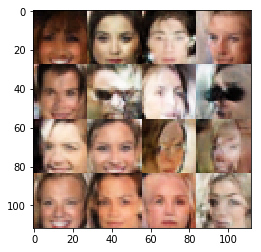

Epoch 5/10... Discriminator Loss: 0.6008... Generator Loss: 1.2523
Epoch 5/10... Discriminator Loss: 0.4821... Generator Loss: 1.3417
Epoch 5/10... Discriminator Loss: 0.6413... Generator Loss: 1.2867
Epoch 5/10... Discriminator Loss: 0.8512... Generator Loss: 0.7202
Epoch 5/10... Discriminator Loss: 1.0186... Generator Loss: 0.6430
Epoch 5/10... Discriminator Loss: 0.5476... Generator Loss: 3.3632
Epoch 5/10... Discriminator Loss: 1.7140... Generator Loss: 0.3694
Epoch 5/10... Discriminator Loss: 0.6227... Generator Loss: 1.2861
Epoch 5/10... Discriminator Loss: 1.0369... Generator Loss: 0.7040
Epoch 5/10... Discriminator Loss: 0.6410... Generator Loss: 1.1434


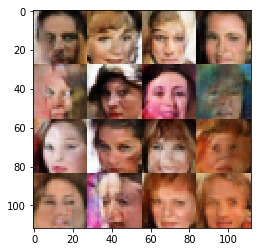

Epoch 5/10... Discriminator Loss: 1.0532... Generator Loss: 0.6662
Epoch 5/10... Discriminator Loss: 0.4970... Generator Loss: 1.5029
Epoch 5/10... Discriminator Loss: 1.1544... Generator Loss: 0.5261
Epoch 5/10... Discriminator Loss: 0.1664... Generator Loss: 2.9774
Epoch 5/10... Discriminator Loss: 0.5640... Generator Loss: 2.0852
Epoch 5/10... Discriminator Loss: 0.9786... Generator Loss: 0.6508
Epoch 5/10... Discriminator Loss: 0.4629... Generator Loss: 1.8185
Epoch 5/10... Discriminator Loss: 0.8191... Generator Loss: 0.9545
Epoch 5/10... Discriminator Loss: 0.5971... Generator Loss: 1.2372
Epoch 5/10... Discriminator Loss: 1.2211... Generator Loss: 0.5062


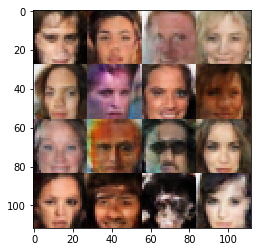

Epoch 5/10... Discriminator Loss: 0.6317... Generator Loss: 1.0832
Epoch 5/10... Discriminator Loss: 0.0966... Generator Loss: 3.8313
Epoch 5/10... Discriminator Loss: 0.5767... Generator Loss: 1.8147
Epoch 5/10... Discriminator Loss: 0.7721... Generator Loss: 0.8287
Epoch 5/10... Discriminator Loss: 0.7035... Generator Loss: 0.9326
Epoch 5/10... Discriminator Loss: 0.9598... Generator Loss: 0.6732
Epoch 5/10... Discriminator Loss: 0.7536... Generator Loss: 0.9042
Epoch 5/10... Discriminator Loss: 0.1805... Generator Loss: 2.5084
Epoch 5/10... Discriminator Loss: 0.6561... Generator Loss: 2.0492
Epoch 5/10... Discriminator Loss: 1.0135... Generator Loss: 0.6350


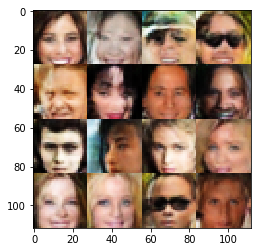

Epoch 5/10... Discriminator Loss: 0.5455... Generator Loss: 1.2327
Epoch 5/10... Discriminator Loss: 0.6340... Generator Loss: 1.1738
Epoch 5/10... Discriminator Loss: 0.4975... Generator Loss: 1.7924
Epoch 5/10... Discriminator Loss: 0.7774... Generator Loss: 4.0605
Epoch 5/10... Discriminator Loss: 0.8944... Generator Loss: 0.7223
Epoch 5/10... Discriminator Loss: 0.3109... Generator Loss: 3.5642
Epoch 5/10... Discriminator Loss: 0.3922... Generator Loss: 1.9650
Epoch 5/10... Discriminator Loss: 0.5336... Generator Loss: 1.5247
Epoch 5/10... Discriminator Loss: 0.4754... Generator Loss: 2.2105
Epoch 5/10... Discriminator Loss: 0.4904... Generator Loss: 1.4459


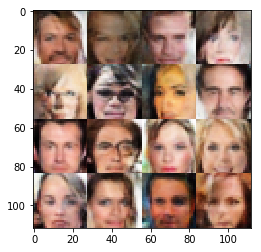

Epoch 5/10... Discriminator Loss: 0.5865... Generator Loss: 1.2449
Epoch 5/10... Discriminator Loss: 0.6016... Generator Loss: 1.1258
Epoch 5/10... Discriminator Loss: 0.3747... Generator Loss: 1.7537
Epoch 5/10... Discriminator Loss: 0.9296... Generator Loss: 0.7907
Epoch 5/10... Discriminator Loss: 1.0696... Generator Loss: 0.5986
Epoch 5/10... Discriminator Loss: 0.4118... Generator Loss: 2.0688
Epoch 5/10... Discriminator Loss: 0.3396... Generator Loss: 1.7861
Epoch 5/10... Discriminator Loss: 0.1933... Generator Loss: 2.1296
Epoch 5/10... Discriminator Loss: 0.6017... Generator Loss: 1.1209
Epoch 5/10... Discriminator Loss: 1.3032... Generator Loss: 0.5052


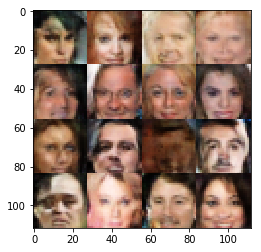

Epoch 5/10... Discriminator Loss: 0.8168... Generator Loss: 0.7859
Epoch 5/10... Discriminator Loss: 1.0089... Generator Loss: 0.6942
Epoch 5/10... Discriminator Loss: 0.4684... Generator Loss: 1.1893
Epoch 5/10... Discriminator Loss: 1.0647... Generator Loss: 0.5955
Epoch 5/10... Discriminator Loss: 0.3011... Generator Loss: 1.8247
Epoch 5/10... Discriminator Loss: 0.2714... Generator Loss: 2.0832
Epoch 5/10... Discriminator Loss: 0.9509... Generator Loss: 2.5533
Epoch 5/10... Discriminator Loss: 0.5610... Generator Loss: 2.7320
Epoch 5/10... Discriminator Loss: 0.6048... Generator Loss: 1.2553
Epoch 5/10... Discriminator Loss: 0.7156... Generator Loss: 0.8712


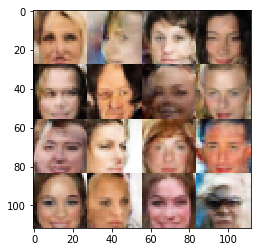

Epoch 5/10... Discriminator Loss: 0.5236... Generator Loss: 1.4864
Epoch 5/10... Discriminator Loss: 0.3635... Generator Loss: 1.6985
Epoch 5/10... Discriminator Loss: 0.4250... Generator Loss: 1.4608
Epoch 5/10... Discriminator Loss: 0.3504... Generator Loss: 1.5924
Epoch 5/10... Discriminator Loss: 0.5158... Generator Loss: 1.5004
Epoch 5/10... Discriminator Loss: 0.5781... Generator Loss: 1.2297
Epoch 5/10... Discriminator Loss: 0.2204... Generator Loss: 2.5276
Epoch 5/10... Discriminator Loss: 0.3850... Generator Loss: 1.6945
Epoch 5/10... Discriminator Loss: 1.5112... Generator Loss: 0.3949
Epoch 5/10... Discriminator Loss: 0.6180... Generator Loss: 1.0711


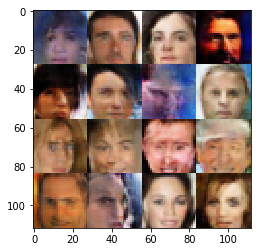

Epoch 5/10... Discriminator Loss: 0.9664... Generator Loss: 0.6758
Epoch 5/10... Discriminator Loss: 0.3087... Generator Loss: 1.8193
Epoch 5/10... Discriminator Loss: 0.4353... Generator Loss: 1.9669
Epoch 5/10... Discriminator Loss: 1.2957... Generator Loss: 0.4954
Epoch 5/10... Discriminator Loss: 1.0173... Generator Loss: 0.7093
Epoch 5/10... Discriminator Loss: 0.3776... Generator Loss: 1.8584
Epoch 5/10... Discriminator Loss: 0.9927... Generator Loss: 0.6630
Epoch 5/10... Discriminator Loss: 0.5360... Generator Loss: 1.5153
Epoch 5/10... Discriminator Loss: 1.6860... Generator Loss: 0.3622
Epoch 5/10... Discriminator Loss: 0.5759... Generator Loss: 1.2294


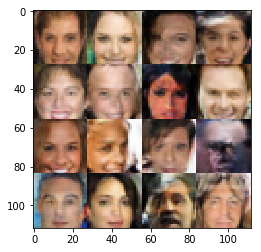

Epoch 5/10... Discriminator Loss: 0.6563... Generator Loss: 1.6885
Epoch 5/10... Discriminator Loss: 1.1744... Generator Loss: 0.5485
Epoch 5/10... Discriminator Loss: 0.5735... Generator Loss: 1.2279
Epoch 5/10... Discriminator Loss: 0.5121... Generator Loss: 1.2675
Epoch 5/10... Discriminator Loss: 0.4827... Generator Loss: 1.4390
Epoch 5/10... Discriminator Loss: 0.9785... Generator Loss: 0.7722
Epoch 5/10... Discriminator Loss: 0.9326... Generator Loss: 0.7783
Epoch 5/10... Discriminator Loss: 1.5390... Generator Loss: 0.3739
Epoch 5/10... Discriminator Loss: 0.6330... Generator Loss: 1.0301
Epoch 5/10... Discriminator Loss: 0.3031... Generator Loss: 2.1359


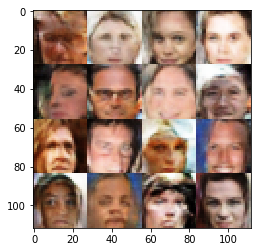

Epoch 5/10... Discriminator Loss: 0.9820... Generator Loss: 0.6743
Epoch 5/10... Discriminator Loss: 0.5386... Generator Loss: 1.2825
Epoch 5/10... Discriminator Loss: 0.5177... Generator Loss: 1.1647
Epoch 5/10... Discriminator Loss: 0.6860... Generator Loss: 1.0018
Epoch 5/10... Discriminator Loss: 0.3454... Generator Loss: 1.8538
Epoch 5/10... Discriminator Loss: 0.5862... Generator Loss: 1.1437
Epoch 5/10... Discriminator Loss: 0.5999... Generator Loss: 1.0782
Epoch 5/10... Discriminator Loss: 0.6808... Generator Loss: 0.8954
Epoch 5/10... Discriminator Loss: 1.2060... Generator Loss: 0.5564
Epoch 5/10... Discriminator Loss: 0.4135... Generator Loss: 1.4301


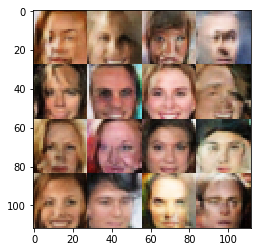

Epoch 5/10... Discriminator Loss: 1.1670... Generator Loss: 0.5516
Epoch 5/10... Discriminator Loss: 0.4670... Generator Loss: 1.5196
Epoch 5/10... Discriminator Loss: 1.1714... Generator Loss: 0.5241
Epoch 5/10... Discriminator Loss: 1.9399... Generator Loss: 0.2888
Epoch 5/10... Discriminator Loss: 0.6734... Generator Loss: 2.5550
Epoch 5/10... Discriminator Loss: 0.5198... Generator Loss: 1.4195
Epoch 5/10... Discriminator Loss: 0.4321... Generator Loss: 1.6211
Epoch 5/10... Discriminator Loss: 0.7478... Generator Loss: 0.9681
Epoch 5/10... Discriminator Loss: 0.3061... Generator Loss: 1.9746
Epoch 5/10... Discriminator Loss: 0.4478... Generator Loss: 1.5945


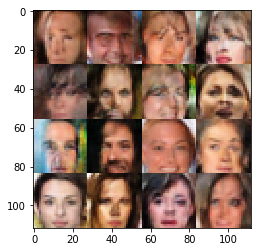

Epoch 5/10... Discriminator Loss: 1.0129... Generator Loss: 0.6651
Epoch 5/10... Discriminator Loss: 0.6943... Generator Loss: 1.0064
Epoch 5/10... Discriminator Loss: 0.6484... Generator Loss: 1.1328
Epoch 5/10... Discriminator Loss: 0.4010... Generator Loss: 1.9227
Epoch 5/10... Discriminator Loss: 0.3931... Generator Loss: 1.6927
Epoch 5/10... Discriminator Loss: 0.4617... Generator Loss: 1.2838
Epoch 5/10... Discriminator Loss: 0.5745... Generator Loss: 1.8602
Epoch 5/10... Discriminator Loss: 0.5730... Generator Loss: 1.7773
Epoch 5/10... Discriminator Loss: 1.5443... Generator Loss: 0.4143
Epoch 5/10... Discriminator Loss: 0.6544... Generator Loss: 1.1145


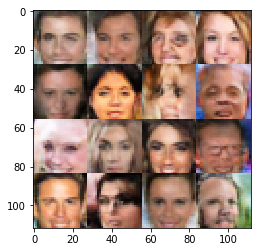

Epoch 5/10... Discriminator Loss: 0.6751... Generator Loss: 1.1908
Epoch 5/10... Discriminator Loss: 0.4974... Generator Loss: 2.4028
Epoch 5/10... Discriminator Loss: 0.9580... Generator Loss: 0.8034
Epoch 5/10... Discriminator Loss: 0.6298... Generator Loss: 1.2842
Epoch 5/10... Discriminator Loss: 0.5035... Generator Loss: 1.2450
Epoch 5/10... Discriminator Loss: 1.5762... Generator Loss: 0.3080
Epoch 5/10... Discriminator Loss: 0.9786... Generator Loss: 0.6457
Epoch 5/10... Discriminator Loss: 0.4249... Generator Loss: 1.7424
Epoch 5/10... Discriminator Loss: 0.8677... Generator Loss: 0.8207
Epoch 5/10... Discriminator Loss: 0.4796... Generator Loss: 1.5280


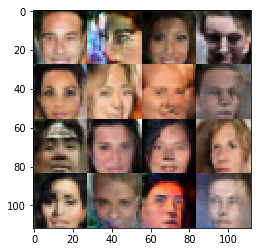

Epoch 5/10... Discriminator Loss: 0.9799... Generator Loss: 0.7302
Epoch 5/10... Discriminator Loss: 0.3956... Generator Loss: 1.8343
Epoch 5/10... Discriminator Loss: 0.7233... Generator Loss: 0.9723
Epoch 5/10... Discriminator Loss: 0.7961... Generator Loss: 0.9440
Epoch 5/10... Discriminator Loss: 0.5920... Generator Loss: 1.0768
Epoch 5/10... Discriminator Loss: 0.5676... Generator Loss: 1.1855
Epoch 5/10... Discriminator Loss: 0.3249... Generator Loss: 2.4806
Epoch 5/10... Discriminator Loss: 1.3130... Generator Loss: 0.4419
Epoch 5/10... Discriminator Loss: 0.9209... Generator Loss: 0.7708
Epoch 5/10... Discriminator Loss: 0.9264... Generator Loss: 0.6800


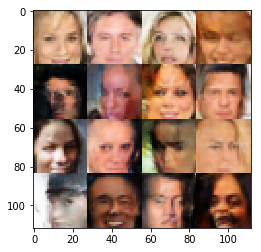

Epoch 5/10... Discriminator Loss: 3.1650... Generator Loss: 5.8744
Epoch 5/10... Discriminator Loss: 1.2971... Generator Loss: 3.2728
Epoch 5/10... Discriminator Loss: 0.6828... Generator Loss: 1.2405
Epoch 5/10... Discriminator Loss: 0.5729... Generator Loss: 1.3302
Epoch 5/10... Discriminator Loss: 0.6147... Generator Loss: 1.3694
Epoch 5/10... Discriminator Loss: 0.8205... Generator Loss: 0.7894
Epoch 5/10... Discriminator Loss: 1.0973... Generator Loss: 0.5640
Epoch 5/10... Discriminator Loss: 0.4260... Generator Loss: 1.5599
Epoch 5/10... Discriminator Loss: 1.0348... Generator Loss: 0.6254
Epoch 5/10... Discriminator Loss: 0.4851... Generator Loss: 1.3212


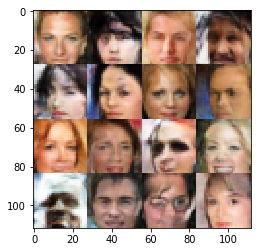

Epoch 5/10... Discriminator Loss: 0.4902... Generator Loss: 1.3727
Epoch 5/10... Discriminator Loss: 0.7979... Generator Loss: 0.8645
Epoch 6/10... Discriminator Loss: 0.4084... Generator Loss: 1.4992
Epoch 6/10... Discriminator Loss: 0.5517... Generator Loss: 1.2058
Epoch 6/10... Discriminator Loss: 0.6074... Generator Loss: 1.0863
Epoch 6/10... Discriminator Loss: 0.3946... Generator Loss: 1.7469
Epoch 6/10... Discriminator Loss: 0.9192... Generator Loss: 0.7982
Epoch 6/10... Discriminator Loss: 0.3180... Generator Loss: 1.9268
Epoch 6/10... Discriminator Loss: 0.5194... Generator Loss: 1.4926
Epoch 6/10... Discriminator Loss: 1.1583... Generator Loss: 0.5301


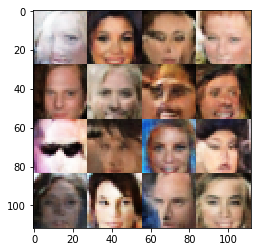

Epoch 6/10... Discriminator Loss: 0.4315... Generator Loss: 1.6280
Epoch 6/10... Discriminator Loss: 0.6592... Generator Loss: 1.0143
Epoch 6/10... Discriminator Loss: 0.3861... Generator Loss: 1.6155
Epoch 6/10... Discriminator Loss: 0.8188... Generator Loss: 0.8216
Epoch 6/10... Discriminator Loss: 0.4300... Generator Loss: 1.7027
Epoch 6/10... Discriminator Loss: 0.6053... Generator Loss: 1.1385
Epoch 6/10... Discriminator Loss: 1.0634... Generator Loss: 0.6438
Epoch 6/10... Discriminator Loss: 0.5753... Generator Loss: 1.2888
Epoch 6/10... Discriminator Loss: 0.5219... Generator Loss: 1.6825
Epoch 6/10... Discriminator Loss: 0.4680... Generator Loss: 1.3611


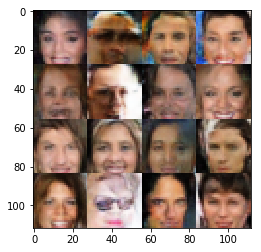

Epoch 6/10... Discriminator Loss: 1.3651... Generator Loss: 0.5003
Epoch 6/10... Discriminator Loss: 0.5083... Generator Loss: 1.7828
Epoch 6/10... Discriminator Loss: 1.9980... Generator Loss: 0.3168
Epoch 6/10... Discriminator Loss: 1.5324... Generator Loss: 0.3881
Epoch 6/10... Discriminator Loss: 1.4270... Generator Loss: 0.3877
Epoch 6/10... Discriminator Loss: 0.3814... Generator Loss: 1.8915
Epoch 6/10... Discriminator Loss: 1.1044... Generator Loss: 0.6236
Epoch 6/10... Discriminator Loss: 0.7310... Generator Loss: 0.9012
Epoch 6/10... Discriminator Loss: 0.5267... Generator Loss: 1.3687
Epoch 6/10... Discriminator Loss: 0.4008... Generator Loss: 1.7199


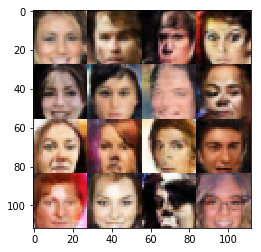

Epoch 6/10... Discriminator Loss: 0.6340... Generator Loss: 1.1705
Epoch 6/10... Discriminator Loss: 1.2573... Generator Loss: 0.4602
Epoch 6/10... Discriminator Loss: 0.4788... Generator Loss: 3.0890
Epoch 6/10... Discriminator Loss: 0.7842... Generator Loss: 0.8343
Epoch 6/10... Discriminator Loss: 0.4370... Generator Loss: 1.4646
Epoch 6/10... Discriminator Loss: 1.4590... Generator Loss: 0.3595
Epoch 6/10... Discriminator Loss: 0.4915... Generator Loss: 1.3991
Epoch 6/10... Discriminator Loss: 0.3425... Generator Loss: 2.3226
Epoch 6/10... Discriminator Loss: 0.5624... Generator Loss: 1.1779
Epoch 6/10... Discriminator Loss: 0.3511... Generator Loss: 1.8778


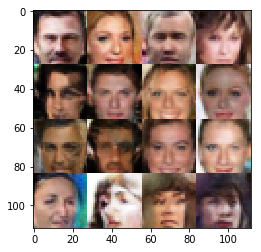

Epoch 6/10... Discriminator Loss: 0.9602... Generator Loss: 0.6700
Epoch 6/10... Discriminator Loss: 0.9185... Generator Loss: 0.7581
Epoch 6/10... Discriminator Loss: 1.2935... Generator Loss: 0.5044
Epoch 6/10... Discriminator Loss: 0.8536... Generator Loss: 0.8824
Epoch 6/10... Discriminator Loss: 0.9975... Generator Loss: 0.6800
Epoch 6/10... Discriminator Loss: 0.5639... Generator Loss: 1.2119
Epoch 6/10... Discriminator Loss: 0.9917... Generator Loss: 0.6669
Epoch 6/10... Discriminator Loss: 1.7459... Generator Loss: 0.2617
Epoch 6/10... Discriminator Loss: 1.0650... Generator Loss: 0.6107
Epoch 6/10... Discriminator Loss: 0.8121... Generator Loss: 0.7585


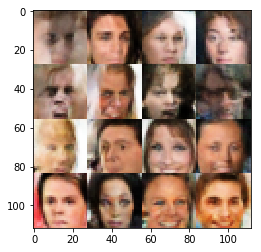

Epoch 6/10... Discriminator Loss: 0.2972... Generator Loss: 2.3991
Epoch 6/10... Discriminator Loss: 1.1215... Generator Loss: 0.6036
Epoch 6/10... Discriminator Loss: 0.4590... Generator Loss: 1.3974
Epoch 6/10... Discriminator Loss: 0.8232... Generator Loss: 0.8150
Epoch 6/10... Discriminator Loss: 1.3863... Generator Loss: 0.4182
Epoch 6/10... Discriminator Loss: 0.8149... Generator Loss: 0.9112
Epoch 6/10... Discriminator Loss: 1.1321... Generator Loss: 0.6248
Epoch 6/10... Discriminator Loss: 0.5603... Generator Loss: 1.2834
Epoch 6/10... Discriminator Loss: 0.6676... Generator Loss: 1.1498
Epoch 6/10... Discriminator Loss: 0.4276... Generator Loss: 1.6440


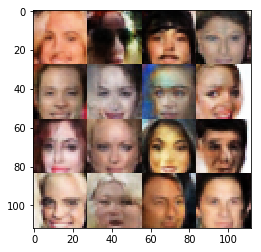

Epoch 6/10... Discriminator Loss: 2.2742... Generator Loss: 0.1957
Epoch 6/10... Discriminator Loss: 0.5252... Generator Loss: 1.5021
Epoch 6/10... Discriminator Loss: 1.4678... Generator Loss: 0.4327
Epoch 6/10... Discriminator Loss: 1.0670... Generator Loss: 0.6011
Epoch 6/10... Discriminator Loss: 0.8618... Generator Loss: 0.8310
Epoch 6/10... Discriminator Loss: 0.2979... Generator Loss: 2.2045
Epoch 6/10... Discriminator Loss: 0.3210... Generator Loss: 1.9988
Epoch 6/10... Discriminator Loss: 1.1635... Generator Loss: 0.5087
Epoch 6/10... Discriminator Loss: 0.3792... Generator Loss: 1.9064
Epoch 6/10... Discriminator Loss: 0.8855... Generator Loss: 0.7205


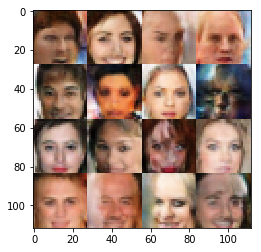

Epoch 6/10... Discriminator Loss: 0.8105... Generator Loss: 0.7903
Epoch 6/10... Discriminator Loss: 0.5551... Generator Loss: 1.1758
Epoch 6/10... Discriminator Loss: 1.5282... Generator Loss: 0.3542
Epoch 6/10... Discriminator Loss: 0.6102... Generator Loss: 2.4319
Epoch 6/10... Discriminator Loss: 0.6682... Generator Loss: 0.9911
Epoch 6/10... Discriminator Loss: 0.6362... Generator Loss: 1.9748
Epoch 6/10... Discriminator Loss: 0.5704... Generator Loss: 1.1907
Epoch 6/10... Discriminator Loss: 0.4559... Generator Loss: 1.6409
Epoch 6/10... Discriminator Loss: 0.5028... Generator Loss: 1.2835
Epoch 6/10... Discriminator Loss: 0.1089... Generator Loss: 3.5925


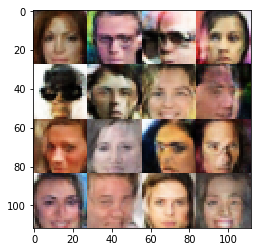

Epoch 6/10... Discriminator Loss: 0.6164... Generator Loss: 1.1927
Epoch 6/10... Discriminator Loss: 1.5175... Generator Loss: 0.4114
Epoch 6/10... Discriminator Loss: 1.1885... Generator Loss: 0.5396
Epoch 6/10... Discriminator Loss: 1.0146... Generator Loss: 0.6822
Epoch 6/10... Discriminator Loss: 0.6660... Generator Loss: 1.1426
Epoch 6/10... Discriminator Loss: 0.8895... Generator Loss: 0.7448
Epoch 6/10... Discriminator Loss: 0.7118... Generator Loss: 0.9321
Epoch 6/10... Discriminator Loss: 1.8421... Generator Loss: 0.2399
Epoch 6/10... Discriminator Loss: 3.3553... Generator Loss: 5.7509
Epoch 6/10... Discriminator Loss: 1.4203... Generator Loss: 0.4709


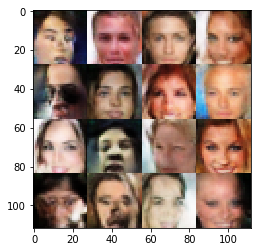

Epoch 6/10... Discriminator Loss: 0.5483... Generator Loss: 1.8202
Epoch 6/10... Discriminator Loss: 0.6091... Generator Loss: 1.1554
Epoch 6/10... Discriminator Loss: 0.7327... Generator Loss: 1.2787
Epoch 6/10... Discriminator Loss: 0.9187... Generator Loss: 1.8729
Epoch 6/10... Discriminator Loss: 1.1544... Generator Loss: 0.6666
Epoch 6/10... Discriminator Loss: 0.4800... Generator Loss: 2.3714
Epoch 6/10... Discriminator Loss: 0.7101... Generator Loss: 1.0712
Epoch 6/10... Discriminator Loss: 0.6947... Generator Loss: 0.9962
Epoch 6/10... Discriminator Loss: 0.7860... Generator Loss: 0.8481
Epoch 6/10... Discriminator Loss: 0.5110... Generator Loss: 2.1014


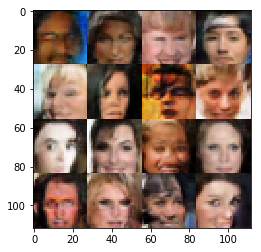

Epoch 6/10... Discriminator Loss: 0.8261... Generator Loss: 0.8443
Epoch 6/10... Discriminator Loss: 0.6868... Generator Loss: 1.0717
Epoch 6/10... Discriminator Loss: 0.4758... Generator Loss: 1.6161
Epoch 6/10... Discriminator Loss: 0.4370... Generator Loss: 2.0791
Epoch 6/10... Discriminator Loss: 0.4774... Generator Loss: 1.4582
Epoch 6/10... Discriminator Loss: 0.2377... Generator Loss: 2.6700
Epoch 6/10... Discriminator Loss: 0.4258... Generator Loss: 1.7480
Epoch 6/10... Discriminator Loss: 1.2234... Generator Loss: 0.4624
Epoch 6/10... Discriminator Loss: 0.6412... Generator Loss: 4.5698
Epoch 6/10... Discriminator Loss: 0.4044... Generator Loss: 1.6615


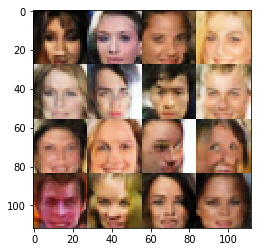

Epoch 6/10... Discriminator Loss: 0.4986... Generator Loss: 1.5834
Epoch 6/10... Discriminator Loss: 0.4464... Generator Loss: 1.5121
Epoch 6/10... Discriminator Loss: 0.4738... Generator Loss: 1.4275
Epoch 6/10... Discriminator Loss: 0.5986... Generator Loss: 1.1471
Epoch 6/10... Discriminator Loss: 0.7498... Generator Loss: 4.3808
Epoch 6/10... Discriminator Loss: 0.6846... Generator Loss: 0.9765
Epoch 6/10... Discriminator Loss: 0.9590... Generator Loss: 0.7583
Epoch 6/10... Discriminator Loss: 0.4414... Generator Loss: 1.5797
Epoch 6/10... Discriminator Loss: 0.5849... Generator Loss: 1.1704
Epoch 6/10... Discriminator Loss: 0.4705... Generator Loss: 1.4479


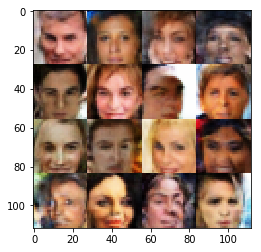

Epoch 6/10... Discriminator Loss: 1.8620... Generator Loss: 0.3009
Epoch 6/10... Discriminator Loss: 0.5267... Generator Loss: 1.2410
Epoch 6/10... Discriminator Loss: 0.9001... Generator Loss: 0.7670
Epoch 6/10... Discriminator Loss: 1.7005... Generator Loss: 0.3289
Epoch 6/10... Discriminator Loss: 0.5740... Generator Loss: 1.2256
Epoch 6/10... Discriminator Loss: 1.2894... Generator Loss: 0.4748
Epoch 6/10... Discriminator Loss: 1.3300... Generator Loss: 0.4594
Epoch 6/10... Discriminator Loss: 0.7201... Generator Loss: 1.0241
Epoch 6/10... Discriminator Loss: 1.4718... Generator Loss: 0.3911
Epoch 6/10... Discriminator Loss: 0.9107... Generator Loss: 0.7147


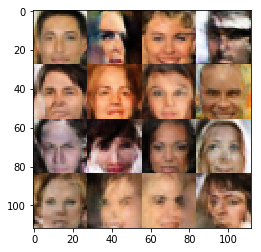

Epoch 6/10... Discriminator Loss: 0.4580... Generator Loss: 1.3988
Epoch 6/10... Discriminator Loss: 0.7580... Generator Loss: 0.8548
Epoch 6/10... Discriminator Loss: 0.4707... Generator Loss: 1.3702
Epoch 6/10... Discriminator Loss: 0.4658... Generator Loss: 2.0819
Epoch 6/10... Discriminator Loss: 1.4966... Generator Loss: 0.3998
Epoch 6/10... Discriminator Loss: 1.1954... Generator Loss: 0.5334
Epoch 6/10... Discriminator Loss: 1.3065... Generator Loss: 0.4960
Epoch 6/10... Discriminator Loss: 0.6411... Generator Loss: 1.1127
Epoch 6/10... Discriminator Loss: 0.6124... Generator Loss: 1.1890
Epoch 6/10... Discriminator Loss: 0.7283... Generator Loss: 0.8641


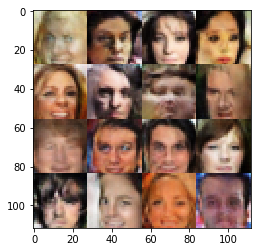

Epoch 6/10... Discriminator Loss: 1.9395... Generator Loss: 0.2147
Epoch 6/10... Discriminator Loss: 0.5161... Generator Loss: 1.4215
Epoch 6/10... Discriminator Loss: 0.5254... Generator Loss: 1.3426
Epoch 6/10... Discriminator Loss: 0.7345... Generator Loss: 0.9293
Epoch 6/10... Discriminator Loss: 0.3522... Generator Loss: 1.6981
Epoch 6/10... Discriminator Loss: 0.3155... Generator Loss: 2.7418
Epoch 6/10... Discriminator Loss: 1.3450... Generator Loss: 0.5173
Epoch 6/10... Discriminator Loss: 0.9819... Generator Loss: 0.7038
Epoch 6/10... Discriminator Loss: 0.4092... Generator Loss: 1.8625
Epoch 6/10... Discriminator Loss: 0.4410... Generator Loss: 1.3952


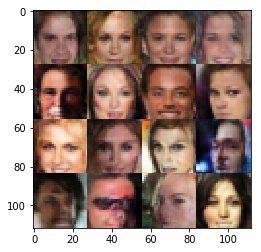

Epoch 6/10... Discriminator Loss: 1.5901... Generator Loss: 0.3606
Epoch 6/10... Discriminator Loss: 0.9578... Generator Loss: 0.6862
Epoch 6/10... Discriminator Loss: 0.5407... Generator Loss: 1.2821
Epoch 6/10... Discriminator Loss: 0.3260... Generator Loss: 1.8633
Epoch 6/10... Discriminator Loss: 0.6461... Generator Loss: 1.1790
Epoch 6/10... Discriminator Loss: 1.2918... Generator Loss: 0.4764
Epoch 6/10... Discriminator Loss: 0.6603... Generator Loss: 1.0273
Epoch 6/10... Discriminator Loss: 0.7598... Generator Loss: 0.8449
Epoch 6/10... Discriminator Loss: 0.7257... Generator Loss: 1.0522
Epoch 6/10... Discriminator Loss: 1.4197... Generator Loss: 0.3906


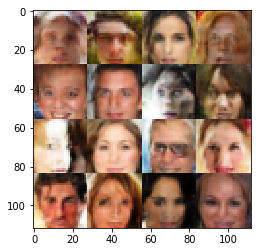

Epoch 6/10... Discriminator Loss: 0.4875... Generator Loss: 1.4585
Epoch 6/10... Discriminator Loss: 1.0034... Generator Loss: 0.6349
Epoch 6/10... Discriminator Loss: 0.4973... Generator Loss: 1.5677
Epoch 6/10... Discriminator Loss: 0.8092... Generator Loss: 0.8853
Epoch 6/10... Discriminator Loss: 1.2796... Generator Loss: 3.5382
Epoch 6/10... Discriminator Loss: 0.6110... Generator Loss: 1.2614
Epoch 6/10... Discriminator Loss: 1.7782... Generator Loss: 0.2721
Epoch 6/10... Discriminator Loss: 0.6666... Generator Loss: 1.3406
Epoch 6/10... Discriminator Loss: 0.5766... Generator Loss: 1.0632
Epoch 6/10... Discriminator Loss: 0.4602... Generator Loss: 1.5818


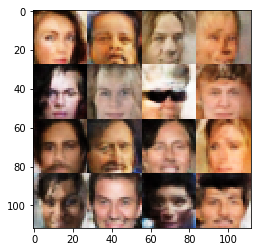

Epoch 6/10... Discriminator Loss: 0.4233... Generator Loss: 1.7135
Epoch 6/10... Discriminator Loss: 1.1129... Generator Loss: 0.5502
Epoch 6/10... Discriminator Loss: 0.7148... Generator Loss: 0.9792
Epoch 6/10... Discriminator Loss: 0.2646... Generator Loss: 1.8064
Epoch 6/10... Discriminator Loss: 0.8505... Generator Loss: 0.7955
Epoch 6/10... Discriminator Loss: 1.0890... Generator Loss: 0.5387
Epoch 6/10... Discriminator Loss: 0.5115... Generator Loss: 1.3343
Epoch 6/10... Discriminator Loss: 0.4965... Generator Loss: 2.2657
Epoch 6/10... Discriminator Loss: 0.4635... Generator Loss: 2.9697
Epoch 6/10... Discriminator Loss: 0.9077... Generator Loss: 0.7128


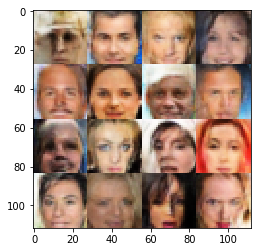

Epoch 6/10... Discriminator Loss: 0.4618... Generator Loss: 1.7381
Epoch 6/10... Discriminator Loss: 0.5659... Generator Loss: 1.5397
Epoch 6/10... Discriminator Loss: 1.2215... Generator Loss: 0.4881
Epoch 6/10... Discriminator Loss: 0.5136... Generator Loss: 1.2868
Epoch 6/10... Discriminator Loss: 0.9980... Generator Loss: 0.7534
Epoch 6/10... Discriminator Loss: 0.4967... Generator Loss: 1.4333
Epoch 6/10... Discriminator Loss: 0.5804... Generator Loss: 1.1426
Epoch 6/10... Discriminator Loss: 1.5136... Generator Loss: 0.3213
Epoch 6/10... Discriminator Loss: 0.4547... Generator Loss: 1.4407
Epoch 6/10... Discriminator Loss: 0.7456... Generator Loss: 0.9700


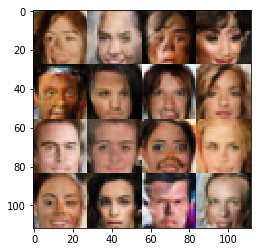

Epoch 6/10... Discriminator Loss: 0.7010... Generator Loss: 0.9814
Epoch 6/10... Discriminator Loss: 0.5602... Generator Loss: 1.2761
Epoch 6/10... Discriminator Loss: 3.4228... Generator Loss: 0.0888
Epoch 6/10... Discriminator Loss: 2.5936... Generator Loss: 0.1402
Epoch 6/10... Discriminator Loss: 0.6916... Generator Loss: 1.3233
Epoch 6/10... Discriminator Loss: 0.7615... Generator Loss: 0.9444
Epoch 6/10... Discriminator Loss: 0.7657... Generator Loss: 0.9730
Epoch 6/10... Discriminator Loss: 0.5585... Generator Loss: 1.2930
Epoch 6/10... Discriminator Loss: 0.5956... Generator Loss: 1.4246
Epoch 6/10... Discriminator Loss: 0.6654... Generator Loss: 0.9765


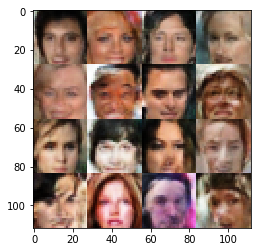

Epoch 6/10... Discriminator Loss: 0.6017... Generator Loss: 1.1010
Epoch 6/10... Discriminator Loss: 0.7735... Generator Loss: 0.9275
Epoch 6/10... Discriminator Loss: 0.8358... Generator Loss: 0.8154
Epoch 6/10... Discriminator Loss: 0.7834... Generator Loss: 0.9517
Epoch 6/10... Discriminator Loss: 0.4175... Generator Loss: 1.4353
Epoch 6/10... Discriminator Loss: 1.6144... Generator Loss: 4.4863
Epoch 6/10... Discriminator Loss: 0.5472... Generator Loss: 1.9362
Epoch 6/10... Discriminator Loss: 0.6083... Generator Loss: 1.2014
Epoch 6/10... Discriminator Loss: 0.4325... Generator Loss: 1.4616
Epoch 6/10... Discriminator Loss: 1.0302... Generator Loss: 0.6035


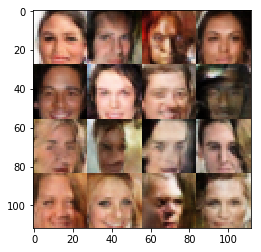

Epoch 6/10... Discriminator Loss: 0.7186... Generator Loss: 0.8720
Epoch 6/10... Discriminator Loss: 1.5245... Generator Loss: 0.3445
Epoch 6/10... Discriminator Loss: 0.8897... Generator Loss: 0.6887
Epoch 6/10... Discriminator Loss: 0.8938... Generator Loss: 0.7015
Epoch 6/10... Discriminator Loss: 0.5633... Generator Loss: 1.4393
Epoch 6/10... Discriminator Loss: 0.6071... Generator Loss: 1.0883
Epoch 6/10... Discriminator Loss: 0.5284... Generator Loss: 1.3826
Epoch 6/10... Discriminator Loss: 0.8397... Generator Loss: 0.8107
Epoch 6/10... Discriminator Loss: 0.6039... Generator Loss: 1.0698
Epoch 6/10... Discriminator Loss: 0.4937... Generator Loss: 1.4034


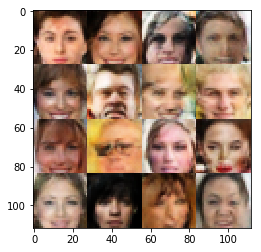

Epoch 6/10... Discriminator Loss: 0.5940... Generator Loss: 1.1766
Epoch 6/10... Discriminator Loss: 0.7082... Generator Loss: 0.9554
Epoch 6/10... Discriminator Loss: 0.5833... Generator Loss: 1.3872
Epoch 6/10... Discriminator Loss: 0.9442... Generator Loss: 0.6707
Epoch 6/10... Discriminator Loss: 0.5935... Generator Loss: 1.0984
Epoch 6/10... Discriminator Loss: 0.5832... Generator Loss: 2.1009
Epoch 6/10... Discriminator Loss: 0.6989... Generator Loss: 0.9469
Epoch 6/10... Discriminator Loss: 0.6702... Generator Loss: 1.0430
Epoch 6/10... Discriminator Loss: 0.5583... Generator Loss: 1.1334
Epoch 6/10... Discriminator Loss: 0.3045... Generator Loss: 2.2040


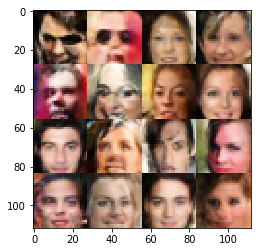

Epoch 6/10... Discriminator Loss: 1.6268... Generator Loss: 3.3663
Epoch 6/10... Discriminator Loss: 2.0425... Generator Loss: 0.2475
Epoch 6/10... Discriminator Loss: 1.1345... Generator Loss: 0.6467
Epoch 6/10... Discriminator Loss: 0.5576... Generator Loss: 2.0078
Epoch 6/10... Discriminator Loss: 0.5979... Generator Loss: 1.2508
Epoch 6/10... Discriminator Loss: 0.4068... Generator Loss: 1.7951
Epoch 6/10... Discriminator Loss: 0.7009... Generator Loss: 0.9925
Epoch 6/10... Discriminator Loss: 0.4582... Generator Loss: 1.6776
Epoch 6/10... Discriminator Loss: 0.8047... Generator Loss: 0.8257
Epoch 6/10... Discriminator Loss: 0.4154... Generator Loss: 1.5746


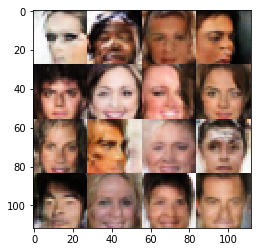

Epoch 6/10... Discriminator Loss: 0.4912... Generator Loss: 1.3497
Epoch 6/10... Discriminator Loss: 0.9565... Generator Loss: 0.6969
Epoch 6/10... Discriminator Loss: 0.4895... Generator Loss: 1.2577
Epoch 6/10... Discriminator Loss: 0.6464... Generator Loss: 2.1538
Epoch 6/10... Discriminator Loss: 0.9028... Generator Loss: 0.7569
Epoch 6/10... Discriminator Loss: 0.8028... Generator Loss: 0.8595
Epoch 6/10... Discriminator Loss: 0.3076... Generator Loss: 1.9795
Epoch 6/10... Discriminator Loss: 0.5934... Generator Loss: 1.1622
Epoch 6/10... Discriminator Loss: 0.7284... Generator Loss: 0.9752
Epoch 6/10... Discriminator Loss: 0.7004... Generator Loss: 0.9050


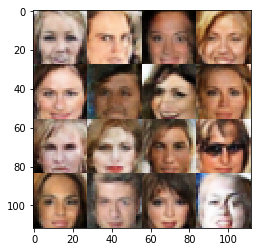

Epoch 6/10... Discriminator Loss: 0.6768... Generator Loss: 1.0278
Epoch 6/10... Discriminator Loss: 0.6072... Generator Loss: 1.1401
Epoch 6/10... Discriminator Loss: 0.8551... Generator Loss: 0.7066
Epoch 6/10... Discriminator Loss: 0.4902... Generator Loss: 1.3715
Epoch 6/10... Discriminator Loss: 0.5505... Generator Loss: 1.2125
Epoch 6/10... Discriminator Loss: 1.5424... Generator Loss: 0.3666
Epoch 6/10... Discriminator Loss: 0.7743... Generator Loss: 0.8924
Epoch 6/10... Discriminator Loss: 1.2073... Generator Loss: 0.4970
Epoch 6/10... Discriminator Loss: 0.5029... Generator Loss: 1.2587
Epoch 6/10... Discriminator Loss: 0.8238... Generator Loss: 0.8807


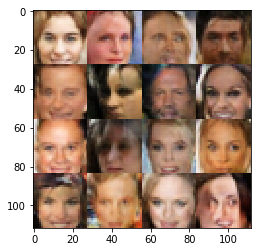

Epoch 6/10... Discriminator Loss: 0.8866... Generator Loss: 0.7179
Epoch 6/10... Discriminator Loss: 0.6279... Generator Loss: 3.3245
Epoch 6/10... Discriminator Loss: 0.5369... Generator Loss: 1.9140
Epoch 6/10... Discriminator Loss: 0.5602... Generator Loss: 1.4548
Epoch 6/10... Discriminator Loss: 0.6738... Generator Loss: 1.7108
Epoch 6/10... Discriminator Loss: 0.5100... Generator Loss: 1.4494
Epoch 6/10... Discriminator Loss: 0.7264... Generator Loss: 0.9902
Epoch 6/10... Discriminator Loss: 0.2719... Generator Loss: 1.8299
Epoch 6/10... Discriminator Loss: 1.2147... Generator Loss: 0.5507
Epoch 6/10... Discriminator Loss: 1.3939... Generator Loss: 0.4601


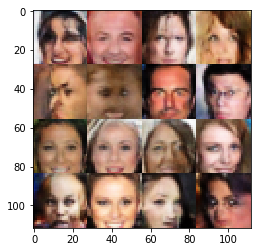

Epoch 6/10... Discriminator Loss: 0.2862... Generator Loss: 3.0924
Epoch 6/10... Discriminator Loss: 1.0605... Generator Loss: 0.6029
Epoch 6/10... Discriminator Loss: 0.5776... Generator Loss: 1.1733
Epoch 6/10... Discriminator Loss: 0.7688... Generator Loss: 0.8653
Epoch 6/10... Discriminator Loss: 1.8378... Generator Loss: 0.3212
Epoch 6/10... Discriminator Loss: 1.1027... Generator Loss: 0.5340
Epoch 6/10... Discriminator Loss: 2.0072... Generator Loss: 0.2050
Epoch 6/10... Discriminator Loss: 0.4786... Generator Loss: 1.4740
Epoch 6/10... Discriminator Loss: 0.4945... Generator Loss: 1.5734
Epoch 6/10... Discriminator Loss: 0.7033... Generator Loss: 0.9283


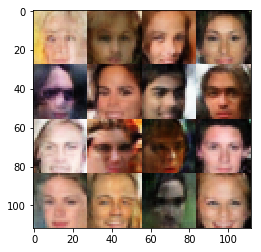

Epoch 6/10... Discriminator Loss: 0.9608... Generator Loss: 0.6962
Epoch 6/10... Discriminator Loss: 0.9440... Generator Loss: 0.6973
Epoch 6/10... Discriminator Loss: 0.9576... Generator Loss: 0.7108
Epoch 6/10... Discriminator Loss: 0.4716... Generator Loss: 1.7440
Epoch 6/10... Discriminator Loss: 0.2917... Generator Loss: 1.8672
Epoch 6/10... Discriminator Loss: 0.4328... Generator Loss: 1.5223
Epoch 6/10... Discriminator Loss: 0.5967... Generator Loss: 1.1519
Epoch 6/10... Discriminator Loss: 0.5507... Generator Loss: 1.9932
Epoch 6/10... Discriminator Loss: 0.6250... Generator Loss: 1.1229
Epoch 6/10... Discriminator Loss: 1.1066... Generator Loss: 0.5584


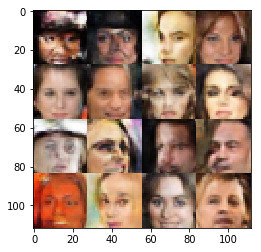

Epoch 6/10... Discriminator Loss: 0.7358... Generator Loss: 0.8747
Epoch 6/10... Discriminator Loss: 0.6178... Generator Loss: 1.1042
Epoch 6/10... Discriminator Loss: 1.0480... Generator Loss: 4.6506
Epoch 6/10... Discriminator Loss: 0.5020... Generator Loss: 1.5746
Epoch 6/10... Discriminator Loss: 1.2335... Generator Loss: 0.4878
Epoch 6/10... Discriminator Loss: 0.8264... Generator Loss: 0.7513
Epoch 6/10... Discriminator Loss: 1.0139... Generator Loss: 1.7790
Epoch 6/10... Discriminator Loss: 0.5110... Generator Loss: 1.6446
Epoch 6/10... Discriminator Loss: 0.5017... Generator Loss: 2.2889
Epoch 6/10... Discriminator Loss: 1.2454... Generator Loss: 0.5348


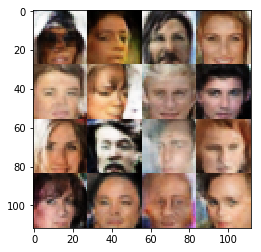

Epoch 6/10... Discriminator Loss: 0.4179... Generator Loss: 1.6601
Epoch 6/10... Discriminator Loss: 0.6481... Generator Loss: 1.1115
Epoch 6/10... Discriminator Loss: 0.5158... Generator Loss: 1.8874
Epoch 6/10... Discriminator Loss: 0.6250... Generator Loss: 1.1471
Epoch 6/10... Discriminator Loss: 0.5251... Generator Loss: 2.3512
Epoch 6/10... Discriminator Loss: 0.4720... Generator Loss: 1.8230
Epoch 6/10... Discriminator Loss: 0.6777... Generator Loss: 0.9720
Epoch 6/10... Discriminator Loss: 1.1499... Generator Loss: 0.6785
Epoch 6/10... Discriminator Loss: 1.7465... Generator Loss: 0.3540
Epoch 6/10... Discriminator Loss: 0.7819... Generator Loss: 1.0160


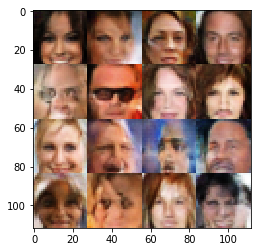

Epoch 6/10... Discriminator Loss: 1.3111... Generator Loss: 3.8199
Epoch 6/10... Discriminator Loss: 0.4642... Generator Loss: 1.4250
Epoch 6/10... Discriminator Loss: 0.4022... Generator Loss: 1.6032
Epoch 6/10... Discriminator Loss: 0.9359... Generator Loss: 0.7297
Epoch 6/10... Discriminator Loss: 0.7720... Generator Loss: 0.8842
Epoch 6/10... Discriminator Loss: 0.6051... Generator Loss: 1.4327
Epoch 6/10... Discriminator Loss: 0.8371... Generator Loss: 0.8075
Epoch 6/10... Discriminator Loss: 0.3386... Generator Loss: 1.7508
Epoch 6/10... Discriminator Loss: 0.5087... Generator Loss: 1.6141
Epoch 7/10... Discriminator Loss: 1.1089... Generator Loss: 0.5630


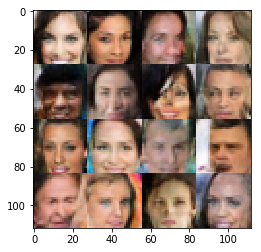

Epoch 7/10... Discriminator Loss: 1.3690... Generator Loss: 0.4525
Epoch 7/10... Discriminator Loss: 0.6211... Generator Loss: 1.0827
Epoch 7/10... Discriminator Loss: 0.6486... Generator Loss: 1.0675
Epoch 7/10... Discriminator Loss: 0.8116... Generator Loss: 0.8654
Epoch 7/10... Discriminator Loss: 0.9660... Generator Loss: 0.7421
Epoch 7/10... Discriminator Loss: 0.5449... Generator Loss: 1.2273
Epoch 7/10... Discriminator Loss: 1.4099... Generator Loss: 0.4002
Epoch 7/10... Discriminator Loss: 0.5252... Generator Loss: 1.8018
Epoch 7/10... Discriminator Loss: 1.7450... Generator Loss: 0.2810
Epoch 7/10... Discriminator Loss: 0.9386... Generator Loss: 0.8069


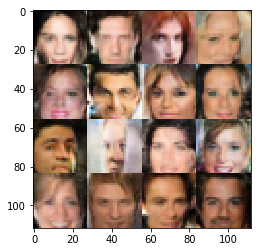

Epoch 7/10... Discriminator Loss: 0.7688... Generator Loss: 0.8334
Epoch 7/10... Discriminator Loss: 0.7701... Generator Loss: 0.8792
Epoch 7/10... Discriminator Loss: 0.5362... Generator Loss: 1.4175
Epoch 7/10... Discriminator Loss: 0.6607... Generator Loss: 2.1379
Epoch 7/10... Discriminator Loss: 0.8066... Generator Loss: 0.9149
Epoch 7/10... Discriminator Loss: 0.9053... Generator Loss: 0.7320
Epoch 7/10... Discriminator Loss: 1.1476... Generator Loss: 0.5598
Epoch 7/10... Discriminator Loss: 0.2923... Generator Loss: 2.0534
Epoch 7/10... Discriminator Loss: 0.4797... Generator Loss: 1.3576
Epoch 7/10... Discriminator Loss: 0.4085... Generator Loss: 2.3194


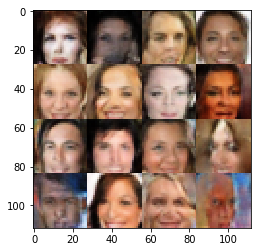

Epoch 7/10... Discriminator Loss: 0.4603... Generator Loss: 1.8728
Epoch 7/10... Discriminator Loss: 0.9029... Generator Loss: 0.7415
Epoch 7/10... Discriminator Loss: 0.6038... Generator Loss: 1.9647
Epoch 7/10... Discriminator Loss: 1.1672... Generator Loss: 0.5287
Epoch 7/10... Discriminator Loss: 0.3795... Generator Loss: 1.6116
Epoch 7/10... Discriminator Loss: 0.7813... Generator Loss: 0.9123
Epoch 7/10... Discriminator Loss: 2.2502... Generator Loss: 0.2770
Epoch 7/10... Discriminator Loss: 1.9007... Generator Loss: 0.2541
Epoch 7/10... Discriminator Loss: 1.1308... Generator Loss: 0.5871
Epoch 7/10... Discriminator Loss: 0.4744... Generator Loss: 1.4342


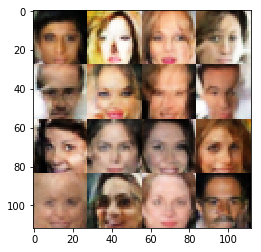

Epoch 7/10... Discriminator Loss: 1.0901... Generator Loss: 0.5993
Epoch 7/10... Discriminator Loss: 0.8230... Generator Loss: 0.8350
Epoch 7/10... Discriminator Loss: 0.5664... Generator Loss: 1.2128
Epoch 7/10... Discriminator Loss: 0.8612... Generator Loss: 0.8451
Epoch 7/10... Discriminator Loss: 1.0273... Generator Loss: 0.6483
Epoch 7/10... Discriminator Loss: 0.8011... Generator Loss: 0.8740
Epoch 7/10... Discriminator Loss: 0.9686... Generator Loss: 0.7032
Epoch 7/10... Discriminator Loss: 0.6798... Generator Loss: 1.0704
Epoch 7/10... Discriminator Loss: 0.2721... Generator Loss: 1.8530
Epoch 7/10... Discriminator Loss: 0.8986... Generator Loss: 1.0059


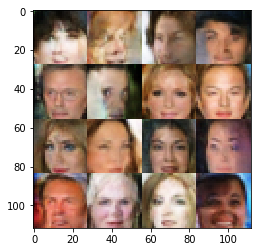

Epoch 7/10... Discriminator Loss: 0.7336... Generator Loss: 0.9621
Epoch 7/10... Discriminator Loss: 1.3003... Generator Loss: 0.4596
Epoch 7/10... Discriminator Loss: 0.8477... Generator Loss: 0.7678
Epoch 7/10... Discriminator Loss: 0.3684... Generator Loss: 1.9602
Epoch 7/10... Discriminator Loss: 0.7996... Generator Loss: 0.9016
Epoch 7/10... Discriminator Loss: 0.7852... Generator Loss: 2.6584
Epoch 7/10... Discriminator Loss: 0.6239... Generator Loss: 1.2109
Epoch 7/10... Discriminator Loss: 0.4951... Generator Loss: 1.5212
Epoch 7/10... Discriminator Loss: 0.7092... Generator Loss: 1.0162
Epoch 7/10... Discriminator Loss: 0.6219... Generator Loss: 1.1364


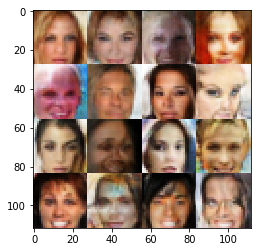

Epoch 7/10... Discriminator Loss: 0.4244... Generator Loss: 2.0053
Epoch 7/10... Discriminator Loss: 0.9366... Generator Loss: 0.7395
Epoch 7/10... Discriminator Loss: 0.9599... Generator Loss: 0.6230
Epoch 7/10... Discriminator Loss: 0.6177... Generator Loss: 1.0339
Epoch 7/10... Discriminator Loss: 0.3628... Generator Loss: 1.8433
Epoch 7/10... Discriminator Loss: 1.1901... Generator Loss: 0.5404
Epoch 7/10... Discriminator Loss: 0.8712... Generator Loss: 0.8750
Epoch 7/10... Discriminator Loss: 0.5154... Generator Loss: 1.3895
Epoch 7/10... Discriminator Loss: 1.0277... Generator Loss: 0.7525
Epoch 7/10... Discriminator Loss: 0.4857... Generator Loss: 1.8515


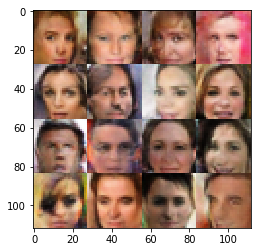

Epoch 7/10... Discriminator Loss: 0.6432... Generator Loss: 1.2668
Epoch 7/10... Discriminator Loss: 0.9273... Generator Loss: 0.7120
Epoch 7/10... Discriminator Loss: 1.0297... Generator Loss: 0.6503
Epoch 7/10... Discriminator Loss: 1.2609... Generator Loss: 0.4611
Epoch 7/10... Discriminator Loss: 0.4181... Generator Loss: 1.4723
Epoch 7/10... Discriminator Loss: 0.7455... Generator Loss: 0.9739
Epoch 7/10... Discriminator Loss: 0.6537... Generator Loss: 0.9522
Epoch 7/10... Discriminator Loss: 1.3171... Generator Loss: 0.4659
Epoch 7/10... Discriminator Loss: 0.7301... Generator Loss: 1.1246
Epoch 7/10... Discriminator Loss: 0.6120... Generator Loss: 1.1578


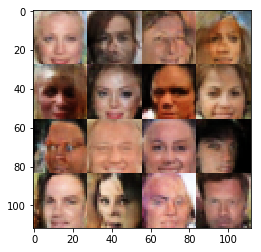

Epoch 7/10... Discriminator Loss: 0.6029... Generator Loss: 1.2367
Epoch 7/10... Discriminator Loss: 0.4341... Generator Loss: 1.5538
Epoch 7/10... Discriminator Loss: 0.8981... Generator Loss: 0.6952
Epoch 7/10... Discriminator Loss: 0.9336... Generator Loss: 0.7984
Epoch 7/10... Discriminator Loss: 0.3777... Generator Loss: 1.8651
Epoch 7/10... Discriminator Loss: 0.5291... Generator Loss: 2.7707
Epoch 7/10... Discriminator Loss: 0.6859... Generator Loss: 1.0181
Epoch 7/10... Discriminator Loss: 0.5060... Generator Loss: 1.5494
Epoch 7/10... Discriminator Loss: 0.5801... Generator Loss: 1.1533
Epoch 7/10... Discriminator Loss: 1.1355... Generator Loss: 3.1607


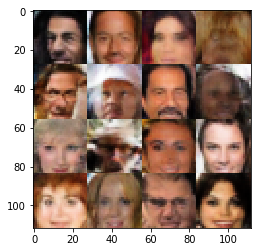

Epoch 7/10... Discriminator Loss: 1.0629... Generator Loss: 0.8591
Epoch 7/10... Discriminator Loss: 1.0224... Generator Loss: 0.7887
Epoch 7/10... Discriminator Loss: 0.3849... Generator Loss: 1.8885
Epoch 7/10... Discriminator Loss: 0.6178... Generator Loss: 1.0884
Epoch 7/10... Discriminator Loss: 0.9109... Generator Loss: 4.9993
Epoch 7/10... Discriminator Loss: 0.4479... Generator Loss: 1.6032
Epoch 7/10... Discriminator Loss: 0.6344... Generator Loss: 1.0868
Epoch 7/10... Discriminator Loss: 0.7083... Generator Loss: 0.9509
Epoch 7/10... Discriminator Loss: 1.0933... Generator Loss: 0.6571
Epoch 7/10... Discriminator Loss: 0.9288... Generator Loss: 0.7214


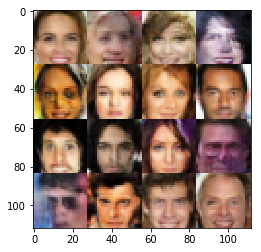

Epoch 7/10... Discriminator Loss: 0.2979... Generator Loss: 2.0801
Epoch 7/10... Discriminator Loss: 0.5060... Generator Loss: 1.2988
Epoch 7/10... Discriminator Loss: 0.4709... Generator Loss: 1.3832
Epoch 7/10... Discriminator Loss: 1.0125... Generator Loss: 0.7604
Epoch 7/10... Discriminator Loss: 1.1195... Generator Loss: 0.6181
Epoch 7/10... Discriminator Loss: 0.5591... Generator Loss: 1.9051
Epoch 7/10... Discriminator Loss: 0.6907... Generator Loss: 1.0655
Epoch 7/10... Discriminator Loss: 1.0461... Generator Loss: 0.6688
Epoch 7/10... Discriminator Loss: 0.8695... Generator Loss: 0.7812
Epoch 7/10... Discriminator Loss: 0.7508... Generator Loss: 0.8724


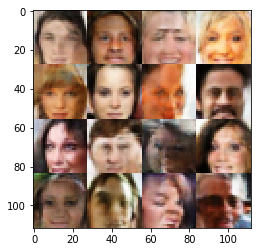

Epoch 7/10... Discriminator Loss: 0.9948... Generator Loss: 0.6379
Epoch 7/10... Discriminator Loss: 0.4980... Generator Loss: 1.3349
Epoch 7/10... Discriminator Loss: 0.9550... Generator Loss: 0.7155
Epoch 7/10... Discriminator Loss: 0.7688... Generator Loss: 0.9287
Epoch 7/10... Discriminator Loss: 0.4446... Generator Loss: 1.6486
Epoch 7/10... Discriminator Loss: 0.5619... Generator Loss: 1.4439
Epoch 7/10... Discriminator Loss: 1.1842... Generator Loss: 0.6046
Epoch 7/10... Discriminator Loss: 0.6351... Generator Loss: 1.3228
Epoch 7/10... Discriminator Loss: 0.5187... Generator Loss: 1.3315
Epoch 7/10... Discriminator Loss: 0.4707... Generator Loss: 1.6728


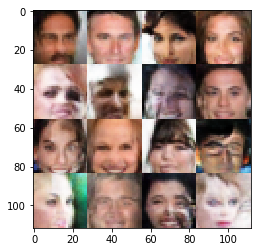

Epoch 7/10... Discriminator Loss: 0.5519... Generator Loss: 1.1910
Epoch 7/10... Discriminator Loss: 0.4053... Generator Loss: 2.0354
Epoch 7/10... Discriminator Loss: 1.2176... Generator Loss: 0.6142
Epoch 7/10... Discriminator Loss: 0.6034... Generator Loss: 1.1667
Epoch 7/10... Discriminator Loss: 0.4330... Generator Loss: 1.4376
Epoch 7/10... Discriminator Loss: 0.8487... Generator Loss: 0.7744
Epoch 7/10... Discriminator Loss: 0.3700... Generator Loss: 1.6455
Epoch 7/10... Discriminator Loss: 0.4683... Generator Loss: 1.3674
Epoch 7/10... Discriminator Loss: 0.7650... Generator Loss: 0.9965
Epoch 7/10... Discriminator Loss: 0.5893... Generator Loss: 1.9054


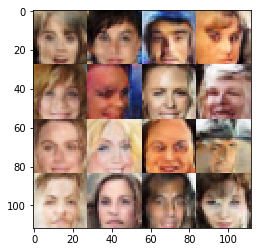

Epoch 7/10... Discriminator Loss: 0.4829... Generator Loss: 2.0844
Epoch 7/10... Discriminator Loss: 1.5151... Generator Loss: 0.3434
Epoch 7/10... Discriminator Loss: 0.6994... Generator Loss: 0.9582
Epoch 7/10... Discriminator Loss: 0.6847... Generator Loss: 1.0741
Epoch 7/10... Discriminator Loss: 0.5882... Generator Loss: 1.4045
Epoch 7/10... Discriminator Loss: 0.8017... Generator Loss: 0.8570
Epoch 7/10... Discriminator Loss: 0.5083... Generator Loss: 1.6035
Epoch 7/10... Discriminator Loss: 0.4992... Generator Loss: 3.3632
Epoch 7/10... Discriminator Loss: 1.1290... Generator Loss: 0.5877
Epoch 7/10... Discriminator Loss: 0.7333... Generator Loss: 1.3097


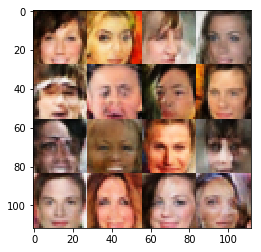

Epoch 7/10... Discriminator Loss: 1.4246... Generator Loss: 0.4000
Epoch 7/10... Discriminator Loss: 0.3947... Generator Loss: 1.5444
Epoch 7/10... Discriminator Loss: 0.3315... Generator Loss: 1.7507
Epoch 7/10... Discriminator Loss: 1.3416... Generator Loss: 0.4524


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.